In [1127]:
#Imports
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import seaborn as sns
import dataframe_image as dfi
from wordcloud import WordCloud, STOPWORDS
from collections import Counter, defaultdict
from tqdm import tqdm
import spacy
spacy.load('en_core_web_sm')

import convokit
from convokit import Corpus, Speaker, Utterance, download, TextParser, PolitenessStrategies

import nltk
from nltk import word_tokenize, Text, WordNetLemmatizer, FreqDist, pos_tag
from nltk.corpus import stopwords, names, subjectivity
from nltk.stem import WordNetLemmatizer
from nltk.classify import NaiveBayesClassifier
from nltk.sentiment import SentimentAnalyzer, SentimentIntensityAnalyzer
from nltk.sentiment.util import *

sid = SentimentIntensityAnalyzer()
wnl = WordNetLemmatizer()
parser = TextParser(verbosity=1000)
ps = PolitenessStrategies()
stop_words = set(stopwords.words("english")+ ["'nt", "'re", "'m", "n't", "'s", "'ll", "'ve", "'d"]) 

In [406]:
#Read in Data
conversations = pd.read_csv("data/movie_conversations.tsv", names=["character_id_1", "character_id_2", "movie_id", "line_id_list"], sep="\t", header=None, error_bad_lines=False)
characters = pd.read_table("data/movie_characters_metadata.tsv", names=["character_id", "character_name", "movie_id", "movie_title", "gender", "position"], sep="\t", header=None, error_bad_lines=False)
lines = pd.read_csv("data/movie_lines.tsv", sep="\t", names=["line_id", "character_id", "movie_id", "character_name", "text"], header=None, error_bad_lines=False)
titles = pd.read_csv("data/movie_titles_metadata.tsv", names=["movie_id", "movie_title", "movie_year", "rating", "votes", "genres"], sep="\t", header=None, error_bad_lines=False)
urls = pd.read_csv("data/raw_script_urls.tsv", names=["movie_title", "url"], sep="\t", header=None, error_bad_lines=False)

In [4]:
conversations.head()

,character_id_1,character_id_2,movie_id,line_id_list
0,u0,u2,m0,['L194' 'L195' 'L196' 'L197']
1,u0,u2,m0,['L198' 'L199']
2,u0,u2,m0,['L200' 'L201' 'L202' 'L203']
3,u0,u2,m0,['L204' 'L205' 'L206']
4,u0,u2,m0,['L207' 'L208']


In [5]:
characters.head()

,character_id,character_name,movie_id,movie_title,gender,position
0,u0,BIANCA,m0,10 things i hate about you,f,4
1,u1,BRUCE,m0,10 things i hate about you,?,?
2,u2,CAMERON,m0,10 things i hate about you,m,3
3,u3,CHASTITY,m0,10 things i hate about you,?,?
4,u4,JOEY,m0,10 things i hate about you,m,6


In [6]:
lines.head()

,line_id,character_id,movie_id,character_name,text
0,L1045,u0,m0,BIANCA,They do not!
1,L1044,u2,m0,CAMERON,They do to!
2,L985,u0,m0,BIANCA,I hope so.
3,L984,u2,m0,CAMERON,She okay?
4,L925,u0,m0,BIANCA,Let's go.


In [7]:
titles.head()

,movie_id,movie_title,movie_year,rating,votes,genres
0,m0,10 things i hate about you,1999,6.9,62847.0,['comedy' 'romance']
1,m1,1492: conquest of paradise,1992,6.2,10421.0,['adventure' 'biography' 'drama' 'history']
2,m2,15 minutes,2001,6.1,25854.0,['action' 'crime' 'drama' 'thriller']
3,m3,2001: a space odyssey,1968,8.4,163227.0,['adventure' 'mystery' 'sci-fi']
4,m4,48 hrs.,1982,6.9,22289.0,['action' 'comedy' 'crime' 'drama' 'thriller']


In [8]:
urls.head()

,movie_title,url
m0,10 things i hate about you,http://www.dailyscript.com/scripts/10Things.html
m1,1492: conquest of paradise,http://www.hundland.org/scripts/1492-ConquestO...
m2,15 minutes,http://www.dailyscript.com/scripts/15minutes.html
m3,2001: a space odyssey,http://www.scifiscripts.com/scripts/2001.txt
m4,48 hrs.,http://www.awesomefilm.com/script/48hours.txt


In [708]:
#Merge all datasets
full_data = lines.merge(titles, on="movie_id", how="inner").merge(characters, on="character_id", how="inner")
full_data = full_data.drop(labels=["movie_id_y", "character_name_y", "movie_title_y"], axis=1) #Remove duplicates
full_data = full_data.rename(columns={"movie_id_x":"movie_id", "character_name_x":"character_name", "movie_title_x":"movie_title"}) #Clean titles from duplicates
full_data["gender"] = full_data["gender"].str.lower() #Clean gender data

In [709]:
#Identify more genders based on name, for characters with unlabeled gender
char_gender_corr = characters
characters["corrected_gender"] = characters["gender"]
full_data["corrected_gender"] = full_data["gender"]

In [710]:
#Males
for x in char_gender_corr["character_name"]:
    if full_data.loc[full_data.character_name == x, "gender"].any() == "?":
        if str(x).capitalize() in names.words('male.txt') and str(x).capitalize() not in names.words('female.txt'):
            full_data.loc[full_data.character_name == x, "corrected_gender"] = "m"
            characters.loc[characters.character_name == x, "corrected_gender"] = "m"

In [711]:
#Females
for x in char_gender_corr["character_name"]:
    if full_data.loc[full_data.character_name == x, "gender"].any() == "?":
        if str(x).capitalize() in names.words('female.txt') and str(x).capitalize() not in names.words('male.txt'):
            full_data.loc[full_data.character_name == x, "corrected_gender"] = "f"
            characters.loc[characters.character_name == x, "corrected_gender"] = "f"

In [249]:
def correct_name_gender(name, gender):
    full_data.loc[full_data.character_name == name, "corrected_gender"] = gender
    characters.loc[characters.character_name == name, "corrected_gender"] = gender

In [352]:
full_data.head()

,line_id,character_id,movie_id,character_name,text,movie_title,movie_year,rating,votes,genres,gender,position,corrected_gender
0,L1045,u0,m0,BIANCA,They do not!,10 things i hate about you,1999,6.9,62847.0,['comedy' 'romance'],f,4,f
1,L985,u0,m0,BIANCA,I hope so.,10 things i hate about you,1999,6.9,62847.0,['comedy' 'romance'],f,4,f
2,L925,u0,m0,BIANCA,Let's go.,10 things i hate about you,1999,6.9,62847.0,['comedy' 'romance'],f,4,f
3,L872,u0,m0,BIANCA,Okay -- you're gonna need to learn how to lie.,10 things i hate about you,1999,6.9,62847.0,['comedy' 'romance'],f,4,f
4,L869,u0,m0,BIANCA,Like my fear of wearing pastels?,10 things i hate about you,1999,6.9,62847.0,['comedy' 'romance'],f,4,f


In [712]:
corr_gender_total = full_data.groupby("corrected_gender")["line_id"].count()

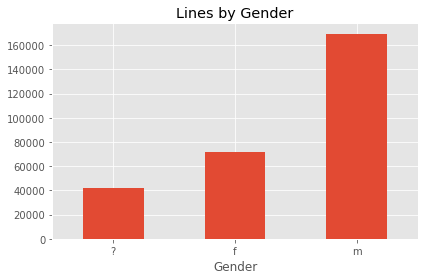

In [717]:
#Plot total lines by gender
plt.style.use('ggplot')
corr_gender_total.plot.bar()
plt.xticks(rotation=None)
plt.xlabel("Gender")
plt.title("Lines by Gender")
plt.tight_layout()
plt.savefig("images/lines_by_corr_gender.png", dpi=300)

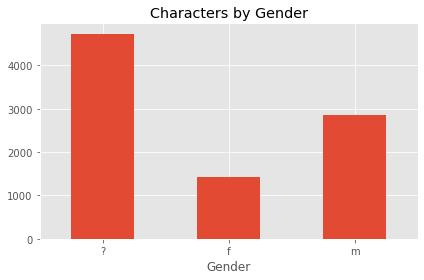

In [715]:
#Plot total characters by gender
characters["corrected_gender"] = characters["corrected_gender"].str.lower()
characters.groupby("corrected_gender").count()["character_id"].plot.bar()
plt.xticks(rotation=None)
plt.title("Characters by Gender")
plt.xlabel("Gender")
plt.tight_layout()
plt.savefig("images/characters_by_corr_gender.png", dpi=300)

In [378]:
#Create list of genre names
genres_list = []
for x in full_data["genres"]:
    if x not in genres_list:
        genres_list.append(x)

In [379]:
#Remove punctuation
genres_list_np = []
punct = "[,']"
for i in range(len(genres_list)):
    for x in genres_list[i]:
        if x in punct:
            genres_list[i] = genres_list[i].replace(x, "")
    genres_list_np.append(genres_list[i])
genres_list_np = sorted(genres_list_np)

In [380]:
#Separate genres
genres_list_np = " ".join(genres_list_np)
genres_list_np.split(" ")

['',
 'action',
 'action',
 'adventure',
 'action',
 'adventure',
 'adventure',
 'adventure',
 'sci-fi',
 'action',
 'adventure',
 'animation',
 'sci-fi',
 'action',
 'adventure',
 'comedy',
 'action',
 'adventure',
 'comedy',
 'crime',
 'action',
 'adventure',
 'comedy',
 'crime',
 'action',
 'adventure',
 'comedy',
 'crime',
 'sci-fi',
 'action',
 'adventure',
 'comedy',
 'drama',
 'war',
 'action',
 'adventure',
 'comedy',
 'fantasy',
 'sci-fi',
 'action',
 'adventure',
 'comedy',
 'fantasy',
 'sci-fi',
 'action',
 'adventure',
 'comedy',
 'sci-fi',
 'action',
 'adventure',
 'comedy',
 'sci-fi',
 'action',
 'adventure',
 'comedy',
 'thriller',
 'action',
 'adventure',
 'crime',
 'action',
 'adventure',
 'crime',
 'drama',
 'sci-fi',
 'action',
 'adventure',
 'crime',
 'drama',
 'sport',
 'thriller',
 'action',
 'adventure',
 'crime',
 'horror',
 'thriller',
 'action',
 'adventure',
 'crime',
 'thriller',
 'action',
 'adventure',
 'drama',
 'action',
 'adventure',
 'drama',
 'fantasy

In [381]:
#Create set from genres
genres_set = set(genres_list_np.split(" "))
genres_set.remove('')
genres_set

{'action',
 'adult',
 'adventure',
 'animation',
 'biography',
 'comedy',
 'crime',
 'documentary',
 'drama',
 'family',
 'fantasy',
 'film-noir',
 'history',
 'horror',
 'music',
 'musical',
 'mystery',
 'romance',
 'sci-fi',
 'short',
 'sport',
 'thriller',
 'war',
 'western'}

In [414]:
titles = titles.dropna()

,movie_id,movie_title,movie_year,rating,votes,genres,percent_female
0,m0,10 things i hate about you,1999,6.9,62847.0,['comedy' 'romance'],0.445652
5,m5,the fifth element,1997,7.5,133756.0,['action' 'adventure' 'romance' 'sci-fi' 'thriller'],0.151020
12,m12,airplane ii: the sequel,1982,5.8,15210.0,['comedy' 'romance' 'sci-fi'],0.450704
13,m13,airplane!,1980,7.8,57692.0,['comedy' 'romance'],0.496296
17,m17,an american werewolf in london,1981,7.5,24443.0,['horror' 'romance'],0.249027
...,...,...,...,...,...,...,...
576,m576,tombstone,1993,7.7,44204.0,['action' 'drama' 'history' 'romance' 'western'],0.153247
586,m586,true romance,1993,7.9,74762.0,['crime' 'romance' 'thriller'],0.205686
594,m594,vertigo,1958,8.6,93524.0,['crime' 'mystery' 'romance' 'thriller'],0.485893
608,m608,willow,1988,7.1,33506.0,['action' 'adventure' 'drama' 'fantasy' 'romance'],0.172566


In [415]:
#Make separate selections of dataframe containing each respective genre, contain selections in dictionary
def genre_df(genre):
    return full_data[full_data["genres"].str.contains(genre)]
def genre_title_df(genre):
    return titles[titles["genres"].str.contains(genre)]
    
genre_dict = dict()
genre_titles_dict = dict()
    
for x in genres_set:
    genre_dict[x] = genre_df(x)
    genre_titles_dict[x] = genre_title_df(x)

In [383]:
#Collect percentage of female to male lines by genre
percentages = dict()

def percent_gender(genre):
    if len(genre_dict[genre]["movie_id"].unique()) >= 10:
        percentages[genre] = (genre_dict[genre].groupby("corrected_gender")["line_id"].count()["f"])/((genre_dict[genre].groupby("corrected_gender")["line_id"].count()["m"]) + (genre_dict[genre].groupby("corrected_gender")["line_id"].count()["f"]))
        
for x in genres_set:
    percent_gender(x)

In [384]:
percentages

{'romance': 0.3645579947723873,
 'crime': 0.2511392232877644,
 'fantasy': 0.2919876088412592,
 'history': 0.1612215909090909,
 'comedy': 0.3085598461618419,
 'animation': 0.20103537532355478,
 'family': 0.3429080824088748,
 'action': 0.22985092356120448,
 'war': 0.147900025766555,
 'adventure': 0.21232216059802267,
 'horror': 0.3955164992826399,
 'music': 0.24566088117489987,
 'sci-fi': 0.25196383577886466,
 'western': 0.25,
 'biography': 0.2174813214510757,
 'drama': 0.2936776742873271,
 'mystery': 0.3005701941674412,
 'thriller': 0.2854495867424479}

In [237]:
#Sorted by highest percentage of female lines
percentages_sort = dict(sorted(percentages.items(), key=lambda item: item[1], reverse=True))

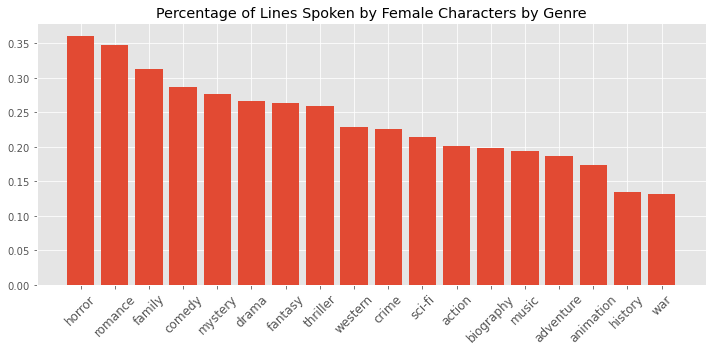

In [705]:
#Plot percentage of female lines by genre
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(10,5))
x = np.arange(len(percentages_sort))
ax.bar(x, percentages_sort.values())
ax.set_xticks(x)
ax.set_xticklabels(list(percentages_sort.keys()), rotation=45, size=12)
ax.set_title("Percentage of Lines Spoken by Female Characters by Genre")
plt.tight_layout()
plt.savefig("images/lines_by_genre.png", dpi=300)

In [239]:
#Count percentage of total female lines in all movies
total_female_lines = (full_data.groupby("corrected_gender")["line_id"].count()["f"])/((full_data.groupby("corrected_gender")["line_id"].count()["m"]) + (full_data.groupby("corrected_gender")["line_id"].count()["f"]))

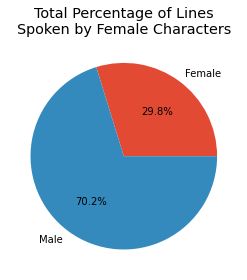

In [1283]:
#Plot percentage of total female lines
plt.style.use('ggplot')
fig, ax = plt.subplots()
ax.pie([total_female_lines, (1-total_female_lines)], labels=["Female", "Male"], autopct="%1.1f%%")
ax.set_title("Total Percentage of Lines\nSpoken by Female Characters")
plt.tight_layout()
plt.savefig("images/total_female_lines.png")

In [287]:
top_female_movies = dict()

for i in range(617):
    indexes = full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count().index
    if "m" in indexes and "f" in indexes:
        top_female_movies["m"+str(i)] = full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["f"] / (full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["f"] + full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["m"])
    elif "f" not in indexes and "m" in indexes:
        top_female_movies["m"+str(i)] = 0
    elif "m" not in indexes and "f" in indexes:
        top_female_movies["m"+str(i)] = 1
    else:
        top_female_movies["m"+str(i)] = "N/A"

In [296]:
for i in range(617):
    indexes = full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count().index
    if full_data[full_data["movie_id"] == "m"+str(i)]["line_id"].count() < 120:
        top_female_movies["m"+str(i)] = "N/A"
    elif "m" in indexes and "f" in indexes and "?" in indexes:
        if full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["?"] > (full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["m"] + full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["f"]):
            top_female_movies["m"+str(i)] = "N/A"
    elif "f" in indexes and "?" in indexes:
        if full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["?"] > (full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["f"])*2:
            top_female_movies["m"+str(i)] = "N/A"
    elif "m" in indexes and "?" in indexes:
        if full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["?"] > (full_data[full_data["movie_id"] == "m"+str(i)].groupby("corrected_gender")["line_id"].count()["m"])*2:
            top_female_movies["m"+str(i)] = "N/A"                                                                                                        

In [293]:
full_data[full_data["movie_title"] == "alien vs. predator"].groupby("corrected_gender")["line_id"].count()

corrected_gender
?    251
f     32
Name: line_id, dtype: int64

In [297]:
top_female_movies_c = {k:v for k,v in top_female_movies.items() if v != 'N/A'}
        
top_female_movies_sort = dict(sorted(top_female_movies_c.items(), key=lambda item: item[1], reverse=True))

top_10 = list(top_female_movies_sort.keys())[0:10]
no_females = [k for k, v in top_female_movies_sort.items() if v == 0]

In [408]:
titles["percent_female"] = titles["movie_id"].map(top_female_movies_sort)

In [409]:
top_females_df = titles[titles["percent_female"] != "N/A"].sort_values("percent_female", ascending=False).head(10)[["movie_title", "genres", "percent_female"]]
top_females_df["movie_title"] = top_females_df["movie_title"].str.upper()

C:\Users\Sophia\anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)


In [680]:
top_females_df.reset_index()[["movie_title", "genres", "percent_female"]]
top_females_df.index = (np.arange(1,11))
pd.set_option('display.max_colwidth', 0)
#top_females_df['percent_female'] = pd.Series(["{0:.2f}%".format(val * 100) for val in top_females_df['percent_female']], index = top_females_df.index)
dfi.export(top_females_df, "images/top_movies_female.png")

In [942]:
top_females_df

,movie_title,genres,percent_female
1,AGNES OF GOD,['drama' 'mystery' 'thriller'],0.990208
2,HEAVENLY CREATURES,['crime' 'drama' 'fantasy' 'thriller'],0.897561
3,SUGAR & SPICE,['comedy' 'crime'],0.890476
4,MY MOTHER DREAMS THE SATAN'S DISCIPLES IN NEW YORK,['short'],0.884956
5,DROP DEAD GORGEOUS,['comedy' 'adult'],0.875648
6,HELLRAISER III: HELL ON EARTH,['horror'],0.868132
7,THELMA & LOUISE,['crime' 'drama' 'thriller'],0.847487
8,STEPMOM,['comedy' 'drama'],0.792142
9,FRIDAY THE 13TH PART III,['horror'],0.777778
10,I STILL KNOW WHAT YOU DID LAST SUMMER,['horror' 'mystery' 'thriller'],0.770751


In [613]:
genre_corr_dict = dict()
for x in genres_set:
    if len(genre_dict[x]["movie_id"].unique()) >= 5:
        genre_corr_dict[x] = (genre_titles_dict[x][["rating", "percent_female"]])

In [1117]:
full_data["percent_male"] = 1-full_data["percent_female"]

In [1176]:
female_mean = np.mean(full_data.groupby("movie_id")["percent_female"].describe()["mean"])
male_mean = np.mean(full_data.groupby("movie_id")["percent_male"].describe()["mean"])
female_std = np.std(full_data.groupby("movie_id")["percent_female"].describe()["mean"])
male_std = np.std(full_data.groupby("movie_id")["percent_male"].describe()["mean"])
n = len(full_data.groupby("movie_id")["percent_female"].describe()["mean"])

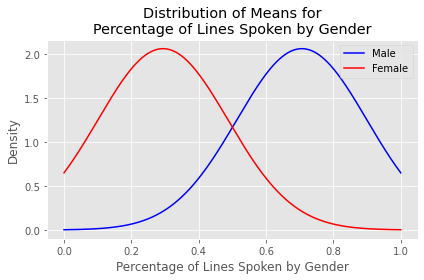

In [1278]:
xaxis = np.linspace(0,1,n)
yaxis1 = stats.norm(loc=male_mean, scale=male_std)
yaxis2 = stats.norm(loc=female_mean, scale=female_std)
fig, ax = plt.subplots()
ax.plot(xaxis, yaxis1.pdf(xaxis), color="blue", label="Male")
#ax.fill(xaxis, yaxis1.pdf(xaxis), color='blue', alpha=0.5)
ax.plot(xaxis, yaxis2.pdf(xaxis), color="red", label="Female")
#ax.fill(xaxis, yaxis2.pdf(xaxis), color='red', alpha=0.5)
ax.set_xlabel("Percentage of Lines Spoken by Gender")
ax.set_ylabel("Density")
ax.legend()
ax.set_title("Distribution of Means for\nPercentage of Lines Spoken by Gender")
plt.tight_layout()
plt.savefig("images/hypothesis_test_count.png", dpi=300)

In [1167]:
print(stats.mannwhitneyu(full_data.groupby("movie_id")["percent_female"].describe()["mean"], full_data.groupby("movie_id")["percent_male"].describe()["mean"], alternative = 'two-sided'))

MannwhitneyuResult(statistic=25658.5, pvalue=9.499402897494699e-134)


In [1197]:
titles.loc[titles.percent_female > 0.5][["rating", "percent_female"]]

,rating,percent_female
7,5.2,0.593103
8,4.7,0.730337
15,8.5,0.554422
23,3.4,0.506726
39,7.6,0.513932
...,...,...
549,8.1,0.539877
551,4.6,0.690476
574,7.4,0.520548
596,8.2,0.586873


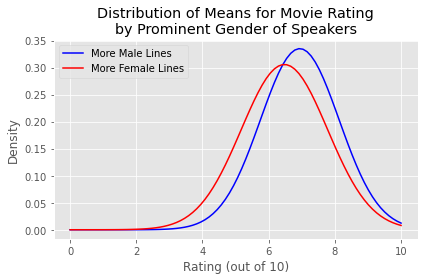

In [1403]:
xaxis_r = np.linspace(0,10,rating_n)
yaxis1_r = stats.norm(loc=male_rating_mean, scale=male_rating_std)
yaxis2_r = stats.norm(loc=female_rating_mean, scale=female_rating_std)
fig, ax = plt.subplots()
ax.plot(xaxis_r, yaxis1_r.pdf(xaxis_r), color="blue", label="More Male Lines")
#ax.fill(xaxis, yaxis1.pdf(xaxis), color='blue', alpha=0.5)
ax.plot(xaxis_r, yaxis2_r.pdf(xaxis_r), color="red", label="More Female Lines")
#ax.fill(xaxis, yaxis2.pdf(xaxis), color='red', alpha=0.5)
ax.set_xlabel("Rating (out of 10)")
ax.set_ylabel("Density")
ax.legend()

ax.set_title("Distribution of Means for Movie Rating\nby Prominent Gender of Speakers")
plt.tight_layout()
plt.savefig("images/hypothesis_test_rating.png", dpi=300)

In [1200]:
female_rating_mean = np.mean(titles.loc[titles.percent_female > 0.5]["rating"])
female_rating_std = np.std(titles.loc[titles.percent_female > 0.5]["rating"])
male_rating_mean = np.mean(titles.loc[titles.percent_female < 0.5]["rating"])
male_rating_std = np.std(titles.loc[titles.percent_female < 0.5]["rating"])
rating_n = len(titles.loc[titles.percent_female > 0.5]["rating"])

In [1198]:
print(stats.mannwhitneyu(titles.loc[titles.percent_female > 0.5]["rating"], titles.loc[titles.percent_female < 0.5]["rating"], alternative = 'two-sided'))

MannwhitneyuResult(statistic=15698.0, pvalue=0.0017823279160287667)


<ipython-input-704-a614910f7df8>:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar_ax = fig.add_axes([.92, 0.1, .03, 0.75])
<ipython-input-704-a614910f7df8>:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, .9, 1])


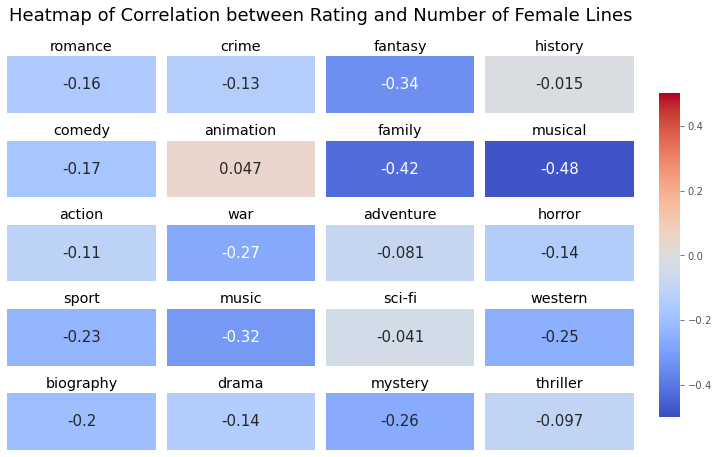

In [704]:
fig, axes = plt.subplots(ncols=4, nrows=5, figsize=(10,6), )

for genre, ax in zip(genre_corr_dict, axes.flat):
    cbar_ax = fig.add_axes([.92, 0.1, .03, 0.75])
    corr = genre_corr_dict[genre][["rating", "percent_female"]].corr().drop(["rating"], axis=1).drop("percent_female", axis=0)
    sns.heatmap(corr, vmin=-0.5, vmax=0.5, annot=True, annot_kws={"fontsize":15}, ax=ax, cmap="coolwarm", cbar_ax=cbar_ax).set(title=genre, xticks=[], yticks=[])
fig.suptitle("Heatmap of Correlation between Rating and Number of Female Lines", x=0.45, y=1.05, fontsize=18)
plt.gcf().subplots_adjust(bottom=0.5)
plt.tight_layout(rect=[0, 0, .9, 1])
plt.savefig("images/heatmap_rating_lines.png")

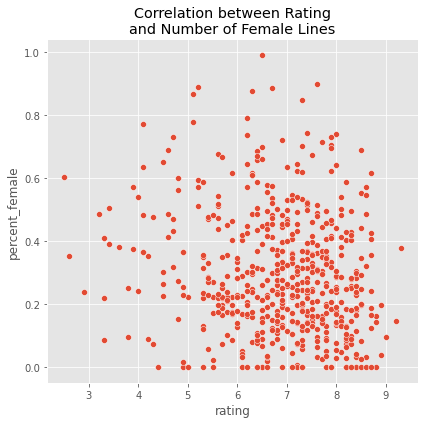

In [1406]:
g = sns.relplot(x="rating", y="percent_female", data=titles[["rating", "percent_female"]]).set(title="Correlation between Rating\nand Number of Female Lines")
g.fig.set_figwidth(6)
g.fig.set_figheight(6)
plt.tight_layout()
plt.savefig("images/corr_rating_female_lines.png", dpi=300)

C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


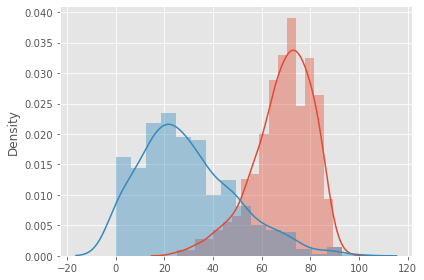

In [1309]:
sns.distplot(titles[["rating"]]*10)
sns.distplot(titles[["percent_female"]]*100)
#.set(title="Correlation between Rating and Number of Female Lines")
#g.fig.set_figwidth(6)
#g.fig.set_figheight(6)
plt.tight_layout()
plt.show()
#plt.savefig("images/corr_rating_female_lines.png", dpi=300)

In [575]:
titles_genres_df = pd.DataFrame()
titles_genres_dict = dict()

for i in range(len(titles)+1):
    for genre in genres_set:
        if len(titles.loc[titles.movie_id=="m"+str(i)]["genres"]) > 0:
            if genre in titles.loc[titles.movie_id=="m"+str(i)]["genres"].iloc[0]:
                titles.loc[titles.movie_id=="m"+str(i), "genre"] = genre
                titles_genres_df = titles_genres_df.append(titles.loc[titles.movie_id=="m"+str(i)])

In [576]:
titles_genres_df

,movie_id,movie_title,movie_year,rating,votes,genres,percent_female,genre
0,m0,10 things i hate about you,1999,6.9,62847.0,['comedy' 'romance'],0.445652,romance
0,m0,10 things i hate about you,1999,6.9,62847.0,['comedy' 'romance'],0.445652,comedy
1,m1,1492: conquest of paradise,1992,6.2,10421.0,['adventure' 'biography' 'drama' 'history'],0.163158,history
1,m1,1492: conquest of paradise,1992,6.2,10421.0,['adventure' 'biography' 'drama' 'history'],0.163158,adventure
1,m1,1492: conquest of paradise,1992,6.2,10421.0,['adventure' 'biography' 'drama' 'history'],0.163158,biography
...,...,...,...,...,...,...,...,...
570,m570,three kings,1999,7.3,69757.0,['action' 'adventure' 'comedy' 'drama' 'war'],0.000000,comedy
570,m570,three kings,1999,7.3,69757.0,['action' 'adventure' 'comedy' 'drama' 'war'],0.000000,action
570,m570,three kings,1999,7.3,69757.0,['action' 'adventure' 'comedy' 'drama' 'war'],0.000000,war
570,m570,three kings,1999,7.3,69757.0,['action' 'adventure' 'comedy' 'drama' 'war'],0.000000,adventure


In [904]:
def lemmatizer(text):
    punct = '''!@#$%^&*()_--+=...,?/"'[]\:;<>'''
    lst_master = []
    for x in text:
        if (str(x)) != "nan":
            lst = []
            for word, tag in pos_tag(word_tokenize(x)):
                wntag = tag[0].lower()
                wntag = wntag if wntag in ['a', 'r', 'n', 'v'] else None
                lemma = wnl.lemmatize(word, wntag) if wntag else word
                if lemma not in punct:
                    lst.append(lemma)
            lst_master.append(" ".join([x.lower() for x in lst]))
        else:
            lst_master.append(" ")
    return lst_master

In [892]:
def no_stopwords(text):
    lst_master = []
    for x in text:
        if (str(x)) != "nan":
            lst = []
            for word in x.split(" "):
                if word.lower() not in stop_words:
                    lst.append(word)
            lst_master.append(" ".join([x.lower() for x in lst]))
        else:
            lst_master.append(" ")
    return lst_master

In [841]:
full_data["cleaned"] = [x for x in lemmatizer(full_data["text"].values)]

In [901]:
full_data["cleaned_no_stops"] = [x for x in no_stopwords(full_data["cleaned"].values)]

In [902]:
full_data[["text", "cleaned", "cleaned_no_stops"]]

,text,cleaned,cleaned_no_stops
0,They do not!,they do not,
1,I hope so.,i hope so,hope
2,Let's go.,let 's go,let go
3,Okay -- you're gonna need to learn how to lie.,okay you 're gon na need to learn how to lie,okay gon na need learn lie
4,Like my fear of wearing pastels?,like my fear of wear pastel,like fear wear pastel
...,...,...,...
283245,Now just one moment. There's no need for roughhousing. Have you ever tried a tip?,now just one moment there 's no need for roughhouse have you ever try a tip,one moment need roughhouse ever try tip
283246,Oh no sir-ee. If yo don't have a reservation you can skip to ma-loo.,oh no sir-ee if yo do n't have a reservation you can skip to ma-loo,oh sir-ee yo reservation skip ma-loo
283247,I'm sorry sir. We only seat by reservation.,i 'm sorry sir we only seat by reservation,sorry sir seat reservation
283248,Do you have a reservation?,do you have a reservation,reservation


In [903]:
Counter(" ".join(full_data["cleaned_no_stops"]).split()).most_common(25)

[('get', 26953),
 ('know', 22764),
 ('go', 20097),
 ('like', 14295),
 ('think', 13720),
 ('want', 12871),
 ('say', 10696),
 ('one', 9816),
 ('well', 9776),
 ('come', 9644),
 ('tell', 9517),
 ('right', 9335),
 ('see', 9285),
 ('look', 7760),
 ('would', 7662),
 ('take', 7583),
 ('make', 7467),
 ('oh', 7296),
 ('yes', 6927),
 ('good', 6765),
 ('time', 6726),
 ('could', 6686),
 ('<', 6655),
 ('>', 6653),
 ('yeah', 6526)]

In [915]:
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stop_words,
                min_font_size = 10).generate(" ".join(full_data["cleaned_no_stops"].values))

In [922]:
wordcloud_f = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stop_words,
                min_font_size = 10).generate(" ".join(full_data.loc[full_data.corrected_gender == "f"]["cleaned_no_stops"].values))

In [924]:
wordcloud_m = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stop_words,
                min_font_size = 10).generate(" ".join(full_data.loc[full_data.corrected_gender == "m"]["cleaned_no_stops"].values))

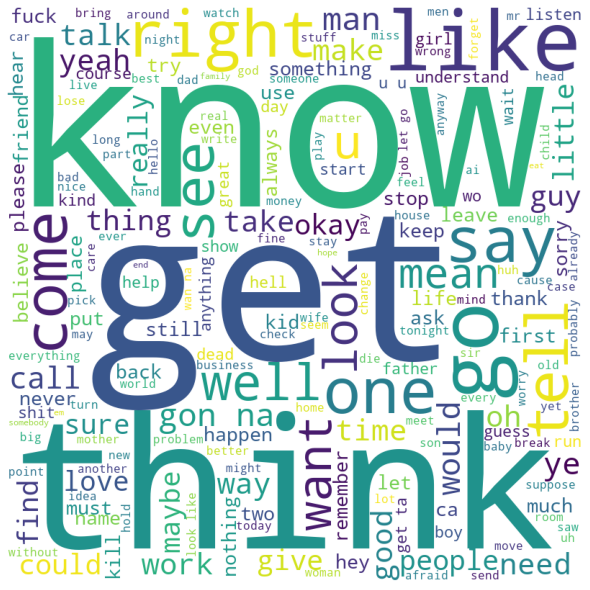

In [916]:
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

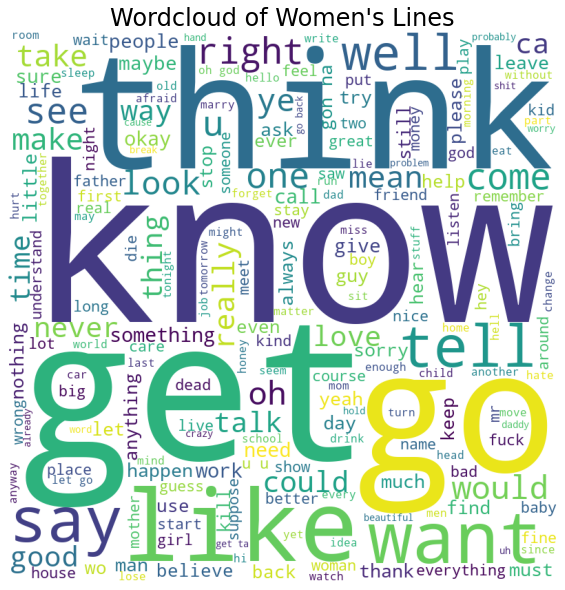

In [930]:
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud_f)
plt.axis("off")
plt.title("Wordcloud of Women's Lines", fontsize=24)
plt.tight_layout(pad = 0)
plt.savefig("images/wordcloud_f.png", dpi=300)

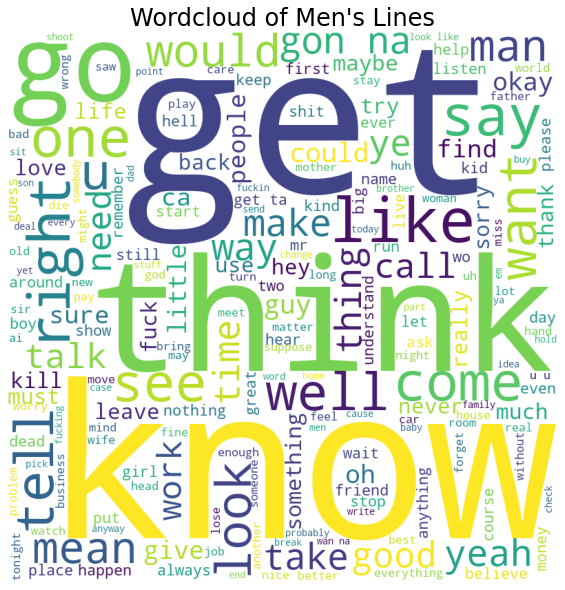

In [931]:
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud_m)
plt.axis("off")
plt.title("Wordcloud of Men's Lines", fontsize=24)
plt.tight_layout(pad = 0)
plt.savefig("images/wordcloud_m.png", dpi=300)

In [945]:
top_words_f = pd.DataFrame(Counter(" ".join(full_data[full_data.corrected_gender == "f"]["cleaned_no_stops"]).split()).most_common(15))
top_words_f.index = (np.arange(1,16))
top_words_f.columns = ["word", "count"]
dfi.export(top_words_f, "images/top_words_f.png")
top_words_f

,word,count
1,know,5966
2,get,5822
3,go,5510
4,like,4008
5,think,3915
6,want,3582
7,say,2728
8,oh,2705
9,well,2432
10,tell,2418


In [946]:
top_words_m = pd.DataFrame(Counter(" ".join(full_data[full_data.corrected_gender == "m"]["cleaned_no_stops"]).split()).most_common(15))
top_words_m.index = (np.arange(1,16))
top_words_m.columns = ["word", "count"]
dfi.export(top_words_m, "images/top_words_m.png")
top_words_m

,word,count
1,get,17189
2,know,13824
3,go,11889
4,like,8380
5,think,8133
6,want,7495
7,say,6386
8,one,6001
9,right,5933
10,well,5899


In [954]:
all_male = nltk.Text(" ".join(full_data[full_data.corrected_gender == "m"]["cleaned_no_stops"]).split())

In [955]:
all_male

<Text: okay wow figure get good stuff eventually thank...>

In [1066]:
sentiment_f = []
sentiment_m = []

for sentence in full_data.loc[full_data.corrected_gender == "m"]["cleaned"]:
    ss = sid.polarity_scores(sentence)
    sentiment_m.append(ss['compound'])
    
for sentence in full_data.loc[full_data.corrected_gender == "f"]["cleaned"]:
    ss = sid.polarity_scores(sentence)
    sentiment_f.append(ss['compound'])

C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


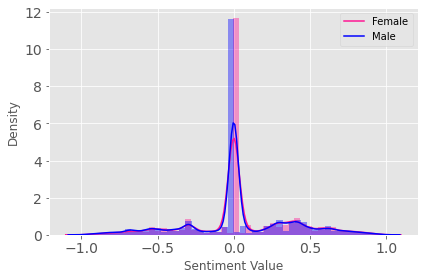

In [1317]:
# plt.figure(figsize=[12,5])
ax = sns.distplot(sentiment_f, color="deeppink", label="Female")
ax = sns.distplot(sentiment_m, color="blue", label="Male")
ax.legend(labels=["Female", "Male"])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.set_xlabel("Sentiment Value")
plt.tight_layout()
plt.savefig("images/sentiment_dist.png", dpi=300)

C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


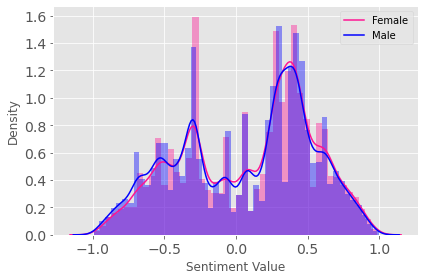

In [1320]:
#plt.figure(figsize=[12,5])
ax = sns.distplot([x for x in sentiment_f if x != 0], color="deeppink", label="Female")
ax = sns.distplot([x for x in sentiment_m if x != 0], color="blue", label="Male")
ax.legend(labels=["Female", "Male"])
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.set_xlabel("Sentiment Value")
plt.tight_layout()
plt.savefig("images/sentiment_dist_no_zeroes.png", dpi=300)

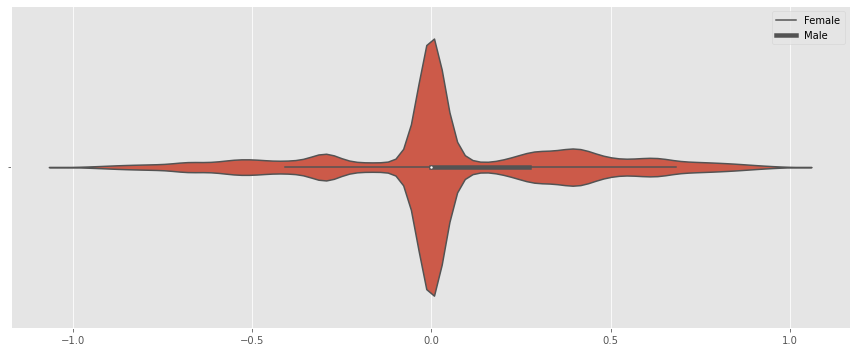

In [1048]:
plt.figure(figsize=[12,5])
ax = sns.violinplot(x=sentiment_f, orient="h")
#ax = sns.swarmplot(x=sentiment_f, orient="h")
#sns.swarmplot(sentiment_m, color="blue")
ax.legend(labels=["Female", "Male"])
plt.tight_layout()
plt.show()

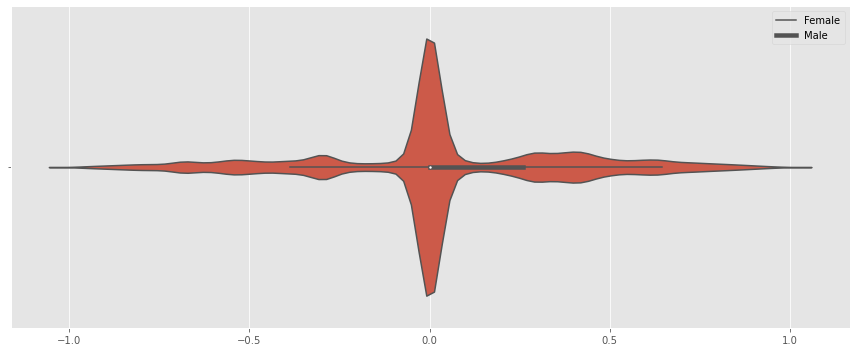

In [1047]:
plt.figure(figsize=[12,5])
ax = sns.violinplot(x=sentiment_m, orient="h")
#ax = sns.swarmplot(x=sentiment_m, orient="h")
#sns.swarmplot(sentiment_m, color="blue")
ax.legend(labels=["Female", "Male"])
plt.tight_layout()
plt.show()

In [1053]:
sentiment_f_romance = []
sentiment_m_romance = []

for sentence in full_data.loc[full_data.genres.str.contains("romance")][full_data.corrected_gender == "m"]["cleaned"]:
    ss = sid.polarity_scores(sentence)
    sentiment_m_romance.append(ss['compound'])
    
for sentence in full_data.loc[full_data.genres.str.contains("romance")][full_data.corrected_gender == "f"]["cleaned"]:
    ss = sid.polarity_scores(sentence)
    sentiment_f_romance.append(ss['compound'])

<ipython-input-1053-d133953192b3>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for sentence in full_data.loc[full_data.genres.str.contains("romance")][full_data.corrected_gender == "m"]["cleaned"]:
<ipython-input-1053-d133953192b3>:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for sentence in full_data.loc[full_data.genres.str.contains("romance")][full_data.corrected_gender == "f"]["cleaned"]:


C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


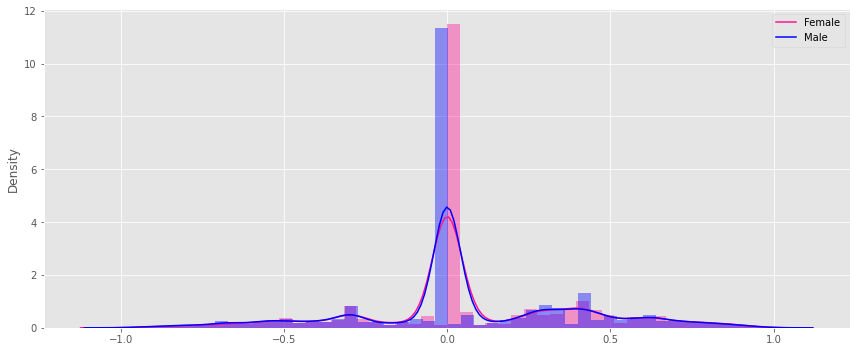

In [1059]:
plt.figure(figsize=[12,5])
ax = sns.distplot([x for x in sentiment_f_romance], color="deeppink", label="Female")
ax = sns.distplot([x for x in sentiment_m_romance], color="blue", label="Male")
ax.legend(labels=["Female", "Male"])
plt.tight_layout()
plt.show()

In [ ]:
corpus_f = Corpus(utterances=list(full_data.loc[full_data.corrected_gender == "f"]["text"].values))
#corpus_m = Corpus(utterances=list(full_data.loc[full_data.corrected_gender == "m"]["text"].values))

In [1234]:
year_gender = titles.groupby("movie_year").describe()["percent_female"]["mean"]

In [1254]:
year_gender_dict = year_gender.to_dict()
year_gender_dict
year_gender_dict = {int(key):val for key, val in year_gender_dict.items() if "I" not in key}
year_gender_dict
lst = sorted(year_gender_dict.items())
x_yg, y_yg = zip(*lst)
x_yg[0]

1927

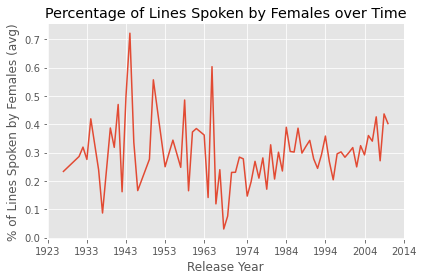

In [1308]:
fig, ax = plt.subplots()
m, b = np.polyfit(x_yg,y_yg,1)
ax.plot(x_yg, y_yg)
#ax.plot(x_yg, m*x_yg+b)
xmin, xmax = ax.get_xlim()
ax.set_xticks(np.round(np.linspace(xmin, xmax, 10)))
#plt.locator_params(axis='x', nbins=8)
ax.set_title("Percentage of Lines Spoken by Females over Time")
ax.set_xlabel("Release Year")
ax.set_ylabel("% of Lines Spoken by Females (avg)")
plt.tight_layout()
plt.savefig("images/female_over_time.png", dpi=300)

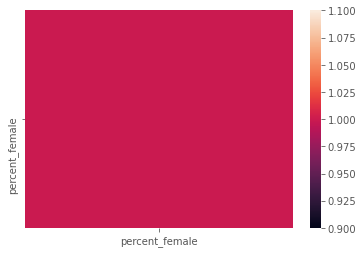

In [1284]:
sns.heatmap(titles[["percent_female", "movie_year"]].corr())

In [1301]:
pd.DataFrame(titles.percent_female.values, index=titles.movie_year).corr()

,0
0,1.0


In [1376]:
hedging = lemmatizer(["may", "might", "indicate", "rather", "think", "maybe", "possibly", "probably", "seem", "appear", "tend", "believe", "doubt", "suggest", "could"])
factuality = lemmatizer(["really", "definitely", "absolutely", "clearly", "obviously", "undeniably", "unequivocally", "positive", "positively", "explicitly"])
first_person = lemmatizer(["i", "we", "my"])
second_person = lemmatizer(["you", "yourself", "your"])
third_person = lemmatizer(["she", "he", "his", "her", "he's", "she's", "they", "their", "they're"])
direct_question = lemmatizer(["how", "who", "why", "where", "when", "what"])

In [1377]:
hedging_d = {"m": 0, "f": 0}
fact_d = {"m": 0, "f": 0}
first_d = {"m": 0, "f": 0}
second_d = {"m": 0, "f": 0}
third_d = {"m": 0, "f": 0}
q_d = {"m": 0, "f": 0}

def count_words(gender, dct, lst):
    for x in full_data.loc[full_data.corrected_gender == gender]["cleaned"].values:
        for y in (x).split(" "):
            if y in lst:
                dct[gender] += 1

In [1378]:
count_words("m", hedging_d, hedging)
count_words("m", fact_d, factuality)
count_words("m", first_d, first_person)
count_words("m", second_d, second_person)
count_words("m", third_d, third_person)
count_words("m", q_d, direct_question)
count_words("f", hedging_d, hedging)
count_words("f", fact_d, factuality)
count_words("f", first_d, first_person)
count_words("f", second_d, second_person)
count_words("f", third_d, third_person)
count_words("f", q_d, direct_question)

In [1379]:
def convert_percent(dct, gender):
    dct[gender] = dct[gender] / len(full_data.loc[full_data.corrected_gender == gender]["cleaned"].values)
convert_percent(hedging_d, "m")
convert_percent(fact_d, "m")
convert_percent(first_d, "m")
convert_percent(second_d, "m")
convert_percent(third_d, "m")
convert_percent(q_d, "m")
convert_percent(hedging_d, "f")
convert_percent(fact_d, "f")
convert_percent(first_d, "f")
convert_percent(second_d, "f")
convert_percent(third_d, "f")
convert_percent(q_d, "f")

In [1380]:
print(hedging_d, fact_d, first_d, second_d, third_d, q_d)

{'m': 0.1163501058478739, 'f': 0.12382416660842827} {'m': 0.017324849778574503, 'f': 0.022685023411838704} {'m': 0.5568541658067141, 'f': 0.5726745404989867} {'m': 0.5492295807952448, 'f': 0.5630023062408275} {'m': 0.23771250656020945, 'f': 0.23875882311831714} {'m': 0.26359953533078195, 'f': 0.2608428261933049}


In [1383]:
word_type = pd.DataFrame({'Gender': ["m", "f", "m", "f", "m", "f", "m", "f", "m", "f", "m", "f"], 'Percentage': [hedging_d["m"], hedging_d["f"], fact_d["m"], fact_d["f"], first_d["m"], first_d["f"], second_d["m"], second_d["f"], third_d["m"], third_d["f"], q_d["m"], q_d["f"]], "Word Type": ["Hedging Words", "Hedging Words", "Factuality Words", "Factuality Words", "First Person Words", "First Person Words", "Second Person Words", "Second Person Words", "Third Person Words", "Third Person Words", "Question Words", "Question Words"]})

C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Sophia\anaconda3\lib\site-packages\seaborn\categorical.py:3720: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


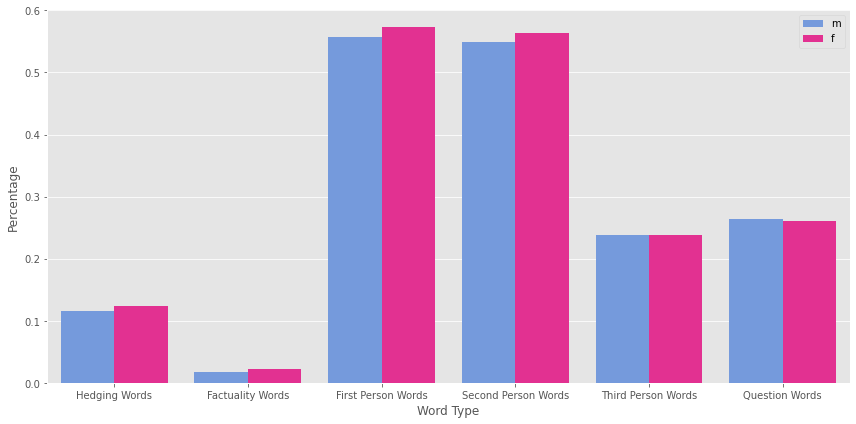

In [1401]:
#fig, ax = plt.subplots(figsize = (12,6))
ax = sns.factorplot(x="Word Type", y="Percentage", hue="Gender", data=word_type, kind="bar", palette=["cornflowerblue", "deeppink"], size=6, aspect=2, legend=False)
plt.legend(loc="upper right")
plt.tight_layout()
plt.savefig("images/word_type.png", dpi=300)

In [1351]:
for x in full_data.loc[full_data.corrected_gender == "m"]["cleaned"].values:
    for y in x.split(" "):
        print(y)

they
do
to
she
okay
wow
no
i
figure
you
'd
get
to
the
good
stuff
eventually
thank
god
if
i
have
to
hear
one
more
story
about
your
coiffure
what
crap
no
you
always
be
this
selfish
then
that
's
all
you
have
to
say
you
never
want
to
go
out
with
'me
do
you
have
fun
tonight
i
believe
we
share
an
art
instructor
looks
like
thing
work
out
tonight
huh
so
that
's
the
kind
of
guy
she
like
pretty
one
she
's
not
a
i
'm
workin
on
it
but
she
do
n't
seem
to
be
goin
for
him
sure
have
how
do
you
get
your
hair
to
look
like
that
you
have
my
word
as
a
gentleman
you
get
something
on
your
mind
there
well
there
's
someone
i
think
might
be
that
's
because
it
's
such
a
nice
one
right
see
you
're
ready
for
the
quiz
let
me
see
what
i
can
do
that
's
a
shame
why
seems
like
she
could
get
a
date
easy
enough
cameron
forget
it
okay
then
how
'bout
we
try
out
some
french
cuisine
saturday
night
well
i
think
we
'd
start
with
pronunciation
if
that
's
okay
with
you
you
humiliate
the
woman
sacrifice
yourself
on
the
altar
of
d

get
you
to
mainline
tequila
you
do
n't
seem
like
the
type
dorsey
why
'd
you
let
him
get
to
you
see
that
who
need
affection
when
i
've
get
blind
hatred
because
then
i
'd
have
to
start
take
out
girl
who
like
me
sure
i
do
i
tell
you
leave
it
to
you
to
use
big
word
when
you
're
shitfaced
what
if
you
have
a
concussion
my
dog
go
to
sleep
with
a
concussion
and
wake
up
a
vegetable
not
that
i
could
tell
the
difference
uh
uh
you
lie
down
and
you
'll
go
to
sleep
you
're
not
okay
okay
i
say
do
what
you
wan
na
do
what
's
this
why
do
n't
you
you
know
these
guy
be
no
bikini
kill
or
the
raincoats
but
they
're
right
up
there
do
you
mind
you
're
sort
of
ruin
it
for
me
excuse
me
hey
great
show
huh
you
're
not
a
big
talker
be
you
i
be
in
the
laundromat
i
saw
your
car
thought
i
'd
say
hi
seven-thirty
come
on
the
pony
the
flat
beer
you
with
money
in
your
eye
me
with
my
hand
on
your
as
then
say
you
'll
spend
dollar
night
at
the
track
with
me
you
hate
me
do
n't
you
i
know
a
lot
more
than
that
the
night
i
take

what
be
it
a
tribe
an
island
i
do
n't
know
i
have
the
impression
that
i
do
n't
change
that
much
i
still
ca
n't
accept
the
world
as
it
be
new
world
create
new
people
i
have
to
disagree
you
'll
always
be
older
than
me
father
give
me
absolution
you
be
bind
by
an
oath
father
if
i
tell
them
they
wo
n't
follow
me
you
know
that
i
be
right
father
you
trust
me
i
be
not
sure
it
could
be
twice
the
distance
i
lie
the
journey
will
be
longer
than
i
say
father
i
have
betray
my
family
i
betray
my
men
and
i
betray
you
forgive
me
father
for
i
have
sin
all
of
them
just
lie
damn
all
of
you
you
all
set
up
theory
base
on
what
you
never
leave
the
safety
of
your
study
go
out
find
out
what
the
world
be
about
and
then
tell
me
something
i
can
listen
to
damn
god
wait
i
've
wait
seven
year
already
how
much
longer
do
you
want
me
to
wait
i
've
be
contradict
all
my
life
eternity
passion
be
something
one
can
not
control
i
'll
try
to
remember
that
marchena
so
be
christ
the
calculation
of
toscanelli
marin
de
tyr
esdras


credit
but
the
problem
be
i
do
n't
share
credit
credit
your
idea
i
think
it
be
my
idea
why
do
you
leave
that
stuff
in
about
you
be
the
director
i
tell
you
to
cut
that
out
before
we
hand
in
the
tape
bad
last
moment
i
cut
it
out
shut
up
look
the
one
who
get
catch
in
the
bathroom
george
michael
oleg
do
n't
be
paranoid
you
get
a
hundred-fifty
thousand
dollar
do
n't
you
i
give
you
half
of
what
they
give
me
look
here
we
be
okay
he
have
nothing
to
say
start
the
camera
no
we
be
insane
who
else
but
crazy
men
would
film
their
murder
so
we
kill
someone
famous
and
if
we
be
catch
we
be
send
to
mental
hospital
but
what
good
be
money
there
because
once
in
hospital
i
say
i
not
crazy
just
pretend
to
be
acquit
we
see
psychiatrist
they
must
certify
we
be
sane
and
because
of
your
what
be
law
call
oh
i
get
it
because
of
your
double
jeopardy
law
we
ca
n't
be
try
for
same
crime
twice
we
come
out
free
rich
and
famous
sit
down
what
do
it
look
like
it
's
an
address
book
put
the
camera
down
oleg
and
the
whore
's

blow
off
and
for
what
some
stupid
kid
get
panicky
take
the
safety
off
and
it
's
over
if
i
have
n't
go
back
for
that
cigar
for
a
bad
habit
i
would
've
have
my
head
blow
off
yeah
sure
beep
me
when
you
're
ready
for
the
press
conference
oh
yeah
alright
well
i
'm
the
deputy
chief
fire
marshall
and
every
now
and
then
i
'd
like
to
be
include
in
decision
oh
there
's
nothing
to
talk
about
get
a
good
lawyer
you
're
suspend
until
your
trial
how
be
you
go
to
fight
this
maybe
if
oleg
have
n't
get
away
and
you
'd
be
on
the
front
page
as
a
hero
this
thing
would
be
easier
to
fight
you
'd
have
the
good
to
weight
against
the
bad
it
's
unfortunate
that
i
have
to
make
decision
base
upon
your
press
coverage
but
there
's
nothing
i
can
do
gim
me
your
shield
well
this
be
gon
na
end
your
career
and
probably
mine
forgot
you
handcuff
a
civilian
to
a
tree
the
public
do
n't
have
any
idea
what
we
do
and
now
you
're
go
to
define
our
image
this
be
go
to
be
our
rodney
king
okay
but
not
water
sport
oh
really
that
's
n

if
i
can
frank
great
just
great
how
about
chargin
the
battery
yeah
i
've
be
busy
hammond
i
want
to
pick
up
my
car
i
dunno
he
's
gon
na
call
me
he
he
want
me
to
help
him
skip
town
i
do
n't
know
ganz
and
billy
get
my
girl
rosalie
who
give
a
fuck
what
you
think
have
n't
see
him
for
year
that
's
the
truth
a
cop
rosalie
you
okay
let
her
go
come
on
you
can
trust
me
please
honest
the
place
we
stash
it
open
monday
morning
i
ca
n't
get
it
till
then
monday
morning
that
's
when
it
open
after
that
i
'll
get
the
money
to
you
right
away
i
ca
n't
get
it
until
monday
honest
no
do
n't
kill
her
i
can
get
you
the
money
do
n't
give
me
this
we
be
partner
i
do
n't
know
what
you
're
talkin
about
whaddya
want
i
think
you
be
lock
up-
try
obeyin
the
law
once
in
awhile
and
i
wo
n't
have
to
hassle
you
i
do
n't
give
a
damn
about
his
girl
maybe
i
better
ask
around
see
what
your
pal
think
now
how
's
your
memory
doin
no
man
i
think
i
'll
have
a
vodka
vodka
i
'll
buy
ya
the
best
dinner
in
san
francisco
how
'd
that
be


i
do
n't
give
out
the
detail
now
where
we
goin
convict
she
's
get
the
same
complaint
as
half
the
goddamn
population
she
ca
n't
get
the
job
she
's
train
for
and
it
piss
her
off
anyway
what
the
fuck
do
you
care
just
get
in
the
car
and
keep
your
mouth
shut
yeah
i
'm
hungry
too
i
know
of
a
place
let
's
go
eat
we
eat
when
i
say
we
eat
we
're
on
the
move
let
's
go
as
they
walk
toward
a
corridor
he
's
get
ta
take
that
call
if
there
be
one
what
do
you
think
want
to
try
it
again
hey
this
work
pretty
good
just
throw
me
the
goddamn
gun
i
'm
tellin
you
to
drop
the
goddam
gun
i
'm
helpin
you
huh
your
pal
nut
enough
to
take
a
shot
at
me
i
may
call
you
worse
than
that
i
do
n't
give
a
damn
it
happen
to
be
my
name
i
can
read
a
police
file
shithead
and
quit
call
me
jack
luther
be
part
of
the
gang
okay
let
's
get
down
to
it
i
do
my
part
and
get
you
out
so
now
you
tell
me
where
we
're
goin
yeah
get
this
we
ai
n't
partner
we
ai
n't
brother
we
ai
n't
friend
i
'm
puttin
you
down
and
keepin
you
down
until
gan

hour
call
me
from
the
hotel
when
you
get
there
amy
just
listen
take
cindy
and
get
out
of
the
house
do
it
now
go
to
a
hotel
and
stay
there
amy
it
's
me
listen
very
carefully
i
'm
not
gon
na
need
it
i
wo
n't
even
wear
it
it
's
a
precaution
do
n't
worry
about
me
it
's
a
missing
person
case
a
long
shot
i
'll
give
it
two
month
two
month
at
most
then
i
'll
be
back
we
'll
take
a
vacation
sometimes
you
ca
n't
know
what
i
'm
do
it
's
better
that
way
this
be
the
mortgage
this
be
cindy
's
college
money
i
'm
not
use
him
again
for
anything
he
be
worthless
you
have
bridge
here
saturday
sure
i
'll
call
the
guy
i
love
you
honey
i
'm
not
please
business
be
fine
i
'll
tell
you
what
you
could
n't
pay
me
enough
to
live
down
there
we
've
be
all
through
that
i
've
be
on
my
best
behavior
well
i
'm
not
smoke
okay
easy
enough
for
you
do
n't
think
i
wo
n't
where
show
me
where
show
me
where
you
bury
her
stop
talk
keep
moving
show
me
what
do
you
do
with
her
body
nobody
saw
you
bring
her
in
tell
me
what
happen
you

know
how
it
be
once
you
pick
it
up
you
ca
n't
put
it
down
it
's
your
call
but
you
're
gon
na
be
sorry
when
you
're
in
one
of
those
everyday
situation
that
call
for
a
battery-operated
vagina
and
you
do
n't
have
one
my
bos
tells
me
i
have
to
do
more
suggestive
selling
can
i
interest
you
in
a
battery
operated-vagina
big
date
tonight
how
will
i
get
it
to
you
fine
nothing
more
than
a
bother
have
you
any
news
for
me
i
've
be
order
into
bed
the
doctor
say
i
've
get
the
flu
or
some
other
wretched
ailment
how
be
you
having
any
luck
hello
you
tell
me
to
look
so
i
look
okay
do
you
think
the
film
could
have
cost
that
much
hello
to
the
penny
exactly
one
million
dollar
in
cash
totalled
together
these
five
check
from
five
different
account
they
equal
one
million
dollar
one
be
for
two
hundred
thousand
one
dollar
and
thirteen
cent
another
be
for
three
hundred
thousand
six
hundred
fifty
four
dollar
and
seventy
six
cent
the
check
be
for
odd
amount
my
husband
never
deal
with
money
personally
certainly
not

who
say
you
win
<
u
>
those
<
/u
>
by
fight
war
and
<
u
>
i
'll
<
/u
>
show
you
an
idiot
perhaps
but
the
idea
of
willingly
go
to
<
u
>
school
<
/u
>
to
spend
my
<
u
>
life
<
/u
>
at
a
paleozoic
pastime
that
should
have
disappear
with
the
thunder-lizards
i
'm
refer
to
war
<
u
>
that
<
/u
>
strike
me
as
the
<
u
>
worst
<
/u
>
cowardice
of
all
be
spiritually
yellow
that
may
be
but
dad
stay
where
<
u
>
he
<
/u
>
be
and
i
'm
stay
here
wearing
a
uniform
do
n't
bestow
an
automatic
monopoly
on
courage
<
u
>
commander
<
/u
>
it
just
so
happens
i
'm
<
u
>
not
<
/u
>
a
coward
physical
or
mental
and
before
i
'd
risk
my
father
's
life
you
'trade
school
boy
be
all
alike
be
n't
you
anybody
who
do
n't
happen
to
think
like
a
little
gold-braided
puppet
be
ipso
facto
a
coward
what
do
you
mean
i
'm
'out
my
father
he
's
not
what
be
it
not
in
two
day
look
do
you
think
i
<
u
>
want
<
/u
>
to
come
if
it
do
n't
mean
so
much
to
dad
prove
his
depth-explorer
it
's
the
last
thing
i
'd
want
it
be
moderate
he
'll
be

grader
all
morning
twombley
's
summer
people
massachusetts
friend
of
gordon
's
it
be
his
idea
for
jack
to
take
him
hunt
i
get
ta
go
where
how
'd
you
hear
that
jack
not
since
last
night
he
take
a
guy
hunting
that
goddamned
woman
thinks
she
can
cart
jill
off
and
leave
me
alone
like
this
i
'm
more
than
piss
margie
i
'm
a
whole
lot
more
than
piss
i
be
that
plenty
and
i
know
the
difference
this
be
different
i
'm
not
find
fault
it
's
a
good
idea
good
for
you
good
for
the
town
real
modern
too
the
sign
it
look
like
it
's
spell
wrong
or
something
it
do
n't
look
right
you
be
careful
of
that
little
bastard
he
's
die
to
get
in
your
pant
you
know
i
do
n't
know
you
my
goddamn
father
and
i
do
n't
know
you
crawl
you
and
me
yeah
call
it
what
you
want
love
what
the
fuck
do
you
know
about
love
you
do
n't
know
me
you
do
n't
know
me
so
fuck
you
fuck
you
pop
for
christ
's
sake
listen
it
's
no
big
deal
pop
why
do
n't
you
call
and
have
the
furnace
fix
is
there
something
wrong
with
the
phone
yeah
where
's
ma
y

all
the
time
i
just
wish
it
be
that
simple
we
really
be
in
love
you
know
how
it
be
when
you
laugh
all
the
time
sure
but
that
's
only
when
the
love
itself
go
unchanged
people
change
in
relation
to
each
other
love
change
on
its
own
we
be
in
love
but
i
'm
not
sure
i
know
what
love
be
anymore
i
open
this
panel
and
a
vacuum
cleaner
hit
me
i
'm
get
over
it
if
a
relationship
be
n't
work
you
ca
n't
force
it
i
'm
familiar
with
your
work
doctor
you
'll
have
to
excuse
me
i
have
to
go
not
dr.
barrington
the
world
renowned
agronomist
uh
oh
thank
you
it
's
nothing
maybe
my
career
be
shoot
we
're
computer
lock
and
the
manual
navigation
unit
be
down
he
try
to
disconnect
rok
it
gas
him
that
computer
be
run
this
ship
and
we
're
head
right
for
the
sun
roger
that
's
my
girl
have
you
get
it
straighten
out
now
meet
me
onboard
sweetheart
i
have
to
pick
up
a
few
thing
at
the
drugstore
so
mentally
ill
elaine
ted
's
a
danger
to
himself
he
's
a
threat
to
this
mission
and
his
behavior
do
absolutely
nothing
to
pro

lucky
nothing
i
have
to
empty
my
damn
gun
into
him
yeah
fedorchuk
could
n't
find
his
as
with
his
hand
in
his
back
pocket
the
human
come
on
you
get
nothin
better
to
do
cushy
county
job
like
yours
granger
and
pitts
have
one
hell
of
a
caseload
and
i
would
have
think
with
jetson
here
be
the
first
newcomer
plainclothes
and
hubley
's
body
be
find
over
in
the
newcomer
community
departmental
policy
captain
i
'd
like
to
volunteer
for
duty
with
the
new
detective
i
'll
cover
you
get
outta
there
get
outta
there
i
get
him
do
n't
get
pin
yeah
that
's
comfort
mine
too
you
get
your
vest
does
that
look
at
all
suspicious
to
you
shit
if
kristin
have
to
get
married
where
i
could
afford
it
we
'd
be
hold
the
reception
at
buddy
's
burgers
goddammit
tug
i
want
to
see
kristin
get
marry
okay
but
what
how
can
i
go
hope
their
plumbing
's
the
same
show
me
the
young
woman
at
the
front
say
you
might
know
where
he
be
we
be
with
the
police
department
this
be
sergeant
sykes
and
i
be
you
be
cassandra
you
look
very
good


be
go
to
come
in
here
just
like
they
do
before
man
they
're
go
to
come
in
here
and
get
us
man
long
before
oh
god
jesus
this
ai
n't
happen
hey
hey
look
crowe
and
dietrich
be
n't
dead
man
sounds
like
you
hicks
well
thanks
i
in
seventeen
minute
this
place
will
be
a
cloud
of
vapor
the
size
of
nebraska
ripley
plenty
twenty-six
minutes
see
you
soon
i
'm
really
the
only
one
qualify
to
remote-pilot
the
ship
anyway
believe
me
i
'd
prefer
not
to
i
may
be
synthetic
but
i
'm
not
stupid
i
'll
go
i
'm
afraid
so
the
crash
do
too
much
damage
the
overload
be
inevitable
at
this
point
i
'm
project
total
system
failure
in
a
little
under
four
hour
the
blast
radius
will
be
about
thirty
kilometer
about
equal
to
ten
megaton
that
's
it
see
it
emergency
venting
hard
to
say
it
may
have
be
blind
instinct
attraction
to
the
heat
of
whatever
but
she
do
choose
to
incubate
her
egg
in
the
one
spot
where
we
could
n't
destroy
her
without
destroy
ourselves
that
's
if
she
exist
of
course
well
the
queen
be
always
physically

but
salieri
i
never
know
that
music
like
that
be
possible
how
could
it
not
excellency
how
could
i
not
grazie
a
lei
signor
antonio
oh
no
the
honour
would
be
all
mine
i
know
i
know
perhaps
you
should
give
me
some
lesson
in
that
it
's
the
best
opera
yet
write
i
know
it
why
do
n't
they
come
what
do
you
think
of
it
yourself
did
you
like
it
at
all
but
what
be
it
they
do
n't
like
nine
performance
nine
that
's
all
it
's
have
and
withdrawn
thank
you
oh
thank
you
oh
excellency
would
you
it
's
not
fair
that
a
man
like
that
have
power
over
our
work
oh
no
my
wife
take
it
out
in
time
oh
i
could
kill
him
i
mean
really
kill
him
i
actually
throw
the
entire
opera
on
the
fire
he
make
me
so
angry
i
do
n't
know
they
say
i
've
get
to
re-write
the
opera
but
it
's
perfect
as
it
be
i
ca
n't
rewrite
what
's
perfect
ca
n't
you
talk
to
him
it
's
unbelievable
the
director
have
actually
rip
out
a
huge
section
of
my
music
pages
of
it
i
ca
n't
say
really
two
thousand
two
hundred
florin
be
all
i
need
a
hundred
fifty
a

a
good
dinner
not
a
sausage
or
stew
but
a
singer
not
a
sausage
or
stew
but
a
singer
is
the
treat
that
i
'll
eat
for
my
meat
dinner
how
dare
you
i
be
a
nobleman
i
only
dine
with
people
of
my
own
height
who
the
devil
be
you
what
do
you
want
you
're
mad
she
's
mad
wolfi
oh
yes
and
what
's
so
intelligent
about
write
a
requiem
i
'm
pay
people
just
to
wait
for
you
it
's
ridiculous
i
'm
pay
these
people
do
you
realize
that
look
you
little
clown
do
you
know
how
many
people
i
've
hire
for
you
do
you
know
how
many
people
be
wait
i
hope
so
i
need
it
immediately
where
's
our
friend
am
i
interrupt
something
ah
well
ah
i
see
you
've
get
your
manager
with
you
well
madame
how
about
half
the
receipt
so
let
me
see
it
where
be
it
look
i
ask
you
if
we
could
start
rehearsal
next
week
and
you
say
yes
why
not
can
i
see
it
what
the
vaudeville
what
'd
you
think
oh
i
'm
sorry
i
'm
sorry
what
have
you
get
for
me
is
it
finish
what
be
this
wolfi
so
there
you
be
what
do
you
say
of
course
what
else
do
you
think
they

be
murder
father
mozart
cruelly
murder
do
you
believe
it
and
do
they
believe
it
ah
you
've
hear
that
i
do
n't
that
be
mozart
wolfgang
amadeus
mozart
you
know
who
that
be
can
you
recall
no
melody
of
mine
i
be
the
most
famous
composer
in
europe
when
you
be
still
a
boy
i
write
forty
operas
alone
what
about
this
little
thing
well
i
'm
surprised
you
do
n't
know
it
be
a
very
popular
tune
in
its
day
i
write
it
how
about
this
then
you
must
know
this
where
how
well
be
you
train
in
music
i
do
not
seek
forgiveness
are
they
do
you
know
who
i
be
you
never
heard
of
me
do
you
leave
me
alone
what
do
you
want
so
about
what
what
do
you
want
oh
my
son
my
poor
son
my
son
why
should
you
want
all
vienna
to
believe
you
a
murderer
is
that
your
penance
is
it
but
not
his
body
no
you
do
n't
why
why
why
why
add
to
your
misery
by
confess
to
murder
you
do
n't
kill
him
yes
what
i
do
not
claim
to
unravel
the
mystery
i
treasure
them
as
you
should
my
son
no
one
can
speak
for
god
god
's
way
be
not
yours
and
you
be
not
h

not
hungry
i
do
n't
want
any
food
call
me
david
aw
come
on
alex
aw
come
on
miss
price
leave
the
pill
i
'll
take
them
later
how
be
that
please
really
i
'm
not
hungry
i
'm
not
very
hungry
thank
you
yes
a
wolf
it
be
a
wolf
it
be
n't
a
lunatic
that
's
what
i
want
you
to
do
you
moron
who
be
this
girl
shakespeare
be
french
the
queen
mother
suck
cock
in
hell
shit
fuck
piss
queen
elizabeth
be
a
man
prince
charles
be
a
faggot
winston
churchill
be
full
of
shit
hey
you
asshole
i
want
you
to
arrest
me
officer
i
kill
those
people
last
night
why
be
you
do
this
to
me
that
's
easy
for
you
to
say
you
're
already
dead
mr.
bringsly
i
'm
sorry
i
have
absolutely
no
idea
what
to
say
to
you
why
be
you
do
this
to
me
jack
yes
but
do
everyone
kill
bambi
do
you
have
bad
dream
too
what
be
you
go
to
see
alex
what
time
be
it
i
be
have
a
nightmare
dr.
hirsch
i
'd
rather
not
be
by
myself
you
really
think
i
'm
crazy
do
n't
you
then
why
the
hell
be
you
so
quick
to
disbelieve
me
you
yourself
say
it
must
have
take
incred

get
marry
say
come
on
show
a
little
enthusiasm
what
's
the
matter
are
you
sick
or
something
go
on
fake
it
even
if
it
be
n't
real
what
's
the
matter
you
do
n't
seem
very
excited
about
it
and
what
's
more
keep
up
the
good
work
and
who
know
some
day
you
'll
be
the
fellow
sit
behind
that
desk
not
a
bad
thought
eh
you
do
n't
want
to
check
up
on
anybody
i
'll
do
all
the
check
up
wait
a
minute
you
're
lie
my
wife
what
's
she
get
to
do
with
you
why
you
must
be
crazy
i
've
know
this
man
for
year
listen
matt
if
you
do
n't
tell
the
truth
i
ca
n't
help
you
where
be
you
last
night
so
have
you
so
have
i
so
's
everybody
get
a
record
what
difference
do
that
make
you
ca
n't
go
around
pin
crime
on
people
just
because
they
what
be
you
talk
about
he
have
no
more
to
do
with
it
than
you
do
good
you
've
get
nothing
to
worry
about
soon
as
the
report
come
in
you
'll
be
release
and
listen
do
n't
talk
so
loud
take
it
easy
coast
a
little
why
certainly
he
can
matt
now
all
you
've
get
to
do
be
tell
them
where
you


problem
it
's
cole
the
thing
a
fella
have
to
do
to
get
a
little
respect
around
here
yes
i
be
obviously
not
stand
out
in
people
's
mind
at
the
robbery
you
hear
me
jesse
you
know
how
crazy
i
get
one
false
move
and
i
'll
blow
your
head
off
hey
well
no
jesse
it
be
the
bank
's
that
's
why
we
have
to
go
to
all
that
trouble
of
steal
it
you
explain
it
to
him
but
if
we
take
their
money
and
supply
not
yet
but
i
'm
hop
two
best
damn
plan
i
hear
all
war
he
's
not
bad
at
it
you
're
just
upset
about
jesse
we
all
be
i
swear
bob
i
do
n't
i
ai
n't
do
how
'd
they
leave
me
alone
bob
as
long
as
people
think
jesse
's
still
rid
we
will
never
get
the
respect
we
deserve
it
's
still
take
too
long
the
people
use
to
snap
to
that
's
what
the
newspaper
say
were
n't
for
jesse
james
this
gang
would
n't
be
able
to
find
a
goat
's
as
with
a
stick
we
get
a
problem
here
brother
how
you
stay
out
of
this
bob
these
be
deed
and
mortgage
of
farm
the
bank
be
hold
for
the
railroad
i
say
we
ride
into
town
and
kill
us
some
pinker

little
bastard
that
's
what
i
would
have
do
was
it
worth
it
oh
that
's
nice
to
know
we
're
go
to
hang
you
you
know
i
go
myself
to
oversee
the
operation
did
n't
help
much
damn
yes
mmm
how
do
you
spot
the
ambush
in
torrell
pity
not
that
day
i
be
guilty
of
many
thing
but
that
be
mr.
thaddeus
rains
and
parker
that
day
that
's
the
idea
oh
it
's
a
similar
room
but
the
hotel
be
in
washington
d.c.
you
're
not
go
to
get
a
fair
trial
down
here
in
front
of
a
jury
of
jesse
james
sympathizer
we
're
move
you
tomorrow
move
you
fool
they
donate
money
to
farmer
to
church
rumor
have
it
they
give
the
sharecropper
of
maddox
so
much
money
they
be
able
to
build
a
school
by
burn
down
their
home
my
professional
opinion
be
that
you
have
manage
to
piss
off
the
wrong
bunch
of
farm
boys
this
time
it
's
not
my
job
to
relax
i
've
put
men
face
out
both
way
down
main
street
so
nobody
can
ride
in
shoot
i
've
get
a
sharpshooter
up
on
the
water
tower
just
in
case
well
this
land
be
about
to
be
condemn
vengeance
why
their

to
return
some
videotape
i
'm
just
leave
i
'm
leave
now
i
've
assess
the
situation
and
i
'm
go
if
you
really
want
to
do
something
for
me
you
can
stop
make
this
scene
right
now
i
know
my
behavior
be
erratic
sometimes
i
'm
in
touch
with
humanity
evelyn
i
'm
sorry
you
're
just
not
terribly
important
to
me
we
never
really
share
one
yes
i
be
i
know
that
your
friend
be
my
friend
i
've
think
about
that
you
can
have
them
i
'm
fuck
serious
it
's
fuck
over
us
this
be
no
joke
i
do
n't
think
we
should
see
each
other
anymore
it
's
over
evelyn
it
's
all
over
we
need
to
talk
my
need
to
engage
in
homicidal
behavior
on
a
massive
scale
can
not
be
um
correct
but
i
have
no
other
way
to
fulfill
my
need
i
think
evelyn
that
we
've
lose
touch
it
's
not
no
i
'm
not
why
should
i
he
have
a
great
body
he
's
good-looking
he
's
rich
why
don
t
you
just
go
for
price
hi
pat
bateman
because
i
want
to
fit
in
i
do
n't
want
to
talk
about
it
no-i
ca
n't
take
the
time
off
work
is
your
evian
spike
evelyn
do
what
no
serial
ki

be
he
with
where
be
marcus
oh
kimball
now
where
be
you
he
do
you
're
sure
well
do
marcus
have
an
alibi
but
marcus
deny
it
marcus
and
but
how
where
do
you
place
paul
that
night
i
'm
not
really
sure
i
have
a
shower
and
some
sorbet
yes
of
course
the
hash
brown
be
delicious
i
'm
just
not
order
them
not
in
the
mood
i
guess
i
'll
be
there
no
i
like
music
just-they're-huey
's
too
black
sounding
for
me
never
i
mean
i
do
n't
really
like
singer
absolutely
i
'm
with
you
on
that
one
great
yes
i
'd
like
that
patrick
please
i
hope
i
've
be
informative
long
day-a
bit
scattered
we
have
go
to
a
new
musical
call
oh
africa
brave
africa
it
be
a
laugh
riot
and
that
's
about
it
i
think
we
have
dinner
at
orso
's
no
petaluma
no
orso
's
the
last
time
i
physically
saw
him
be
at
an
automated
teller
i
ca
n't
remember
which
just
one
that
be
near
um
nell
's
well
i
could
he
wrong
well
i
wait
what
information
have
you
receive
what
i
have
a
date
with
a
girl
name
veronica
god
i
guess
i
be
probably
return
videotape
yeah

hubert
ainsworth
for
paul
so
actually
yes
his
girlfriend
do
n't
think
so
well
there
's
a
message
on
his
answer
machine
say
he
go
to
london
so
be
i
anything
else
you
can
tell
me
about
owen
i
just
want
to
know
if
you
know
bateman
before
yale
if
i
remember
correctly
saint
paul
's
listen
i
just
i
just
want
to
help
and
where
do
he
go
to
school
he
have
a
yacht
yeah
you
know
hang
out
where
do
paul
hang
out
do
you
feel
that
way
what
kind
of
man
be
he
besides
the
information
you
've
just
give
so
there
's
nothing
you
can
tell
me
about
paul
owen
what
do
you
mean
yale
thing
yale
thing
how
well
do
you
know
him
what
can
you
tell
me
about
paul
owen
you
sure
would
you
rather
i
not
smoke
i
know
i
'm
sorry
you
seem
nervous
pardon
me
but
be
you
okay
nice
very
nice
your
address
where
do
you
go
to
school
how
old
be
you
just
some
preliminary
question
that
i
need
for
my
own
file
okay
no
really
i
'm
okay
i
think
his
family
want
this
kept
quiet
the
disappearance
of
paul
owen
oh
no
i
'm
okay
kimball
no
i
'm
oka

on
something
'do
n't
know
what
i
'd
do
without
her
oh
yeah
talk
about
work
never
just
once
'guess
i
be
worry
we
do
n't
have
anything
to
talk
about
since
work
be
off-limits
non-
disclosure
were
the
flag
for
teddy
definitely
i
'm
sure
nothing
you
really
write
this
just
today
well
you
send
for
me
you
do
this
overnight
it
's
okay
really
maybe
i
'm
go
too
fast
could
work
with
a
new
switch
there
may
be
a
few
more
thing
hidden
that
's
insane
you
're
ahead
of
your
time
do
i
no
just
wait
for
my
counselor
to
come
by
and
introduce
himself
i
do
it
need
a
more
object-oriented
language
this
do
n't
scale
do
it
skywire
low
enough
to
relay
internet
traffic
you
know
a
lot
about
art
i
guess
oh
no
thanks
cool
you
would
wow
when
would
we
come
'think
he
hang
up
hello
cool
got
out
of
my
other
commitment
we
'll
come
up
with
the
next
big
thing
those
really
weird
short
line
it
's
only
meaningful
when
you
've
get
40000
line
of
code
to
back
it
up
just
think
his
work
should
go
on
i
know
you
lose
all
his
work
maybe

you
get
to
a
certain
age
you
start
wonder
about
your
legacy
i
doubt
you
even
remember
outpost
1.0
you
'd
have
to
start
practically
from
scratch
but
this
be
all
you
'd
be
work
on
no
marketing
meeting
no
product
seminar
we
ca
n't
waste
the
time
half
the
valley
's
work
on
convergence
so
're
medium
conglomerate
cable
company
phone
company
'ca
n't
finish
second
milo
there
be
no
second
now
what
would
you
like
to
ask
me
the
content
filer
have
t'be
write
into
the
medium
file
so
bit
come
off
the
satellite
can
be
read
by
multiplatforms
really
omniplatforms
including
whatever
new
hardware
emerge
among
other
thing
we
know
convergence
be
the
real
super-highway
all
the
pc
's
tv
's
phone
etc
link
together
why
cram
it
into
a
cable
if
you
can
use
the
whole
sky
i
've
only
show
this
to
three
other
people
i
buy
200
we
've
launch
12
so
far
i
keep
the
coordinate
in
this
room
it
's
leave
over
from
sdi
reagan
's
star
wars
technology
they
orbit
426
mile
up
there
's
a
rumor
go
around
maybe
you
've
hear
it
would

'll
just
give
basil
a
tinkle
on
the
tell
bone
well
you
know
cow
and
shagging
let
me
tell
you
a
story
there
's
these
two
bull
on
top
of
a
hill
check
out
some
foxy
cow
in
the
meadow
below
the
young
bull
say
'hey
why
do
n't
we
run
down
the
hill
and
shag
us
a
cow
and
the
wise
old
bull
reply
'no
why
do
n't
we
walk
down
the
hill
and
shag
all
the
cow
he
's
too
well-protected
right
now
i
never
forget
a
pussy
cat
hello
hello
that
's
dr
evil
's
cat
let
me
see
we
've
get
a
doctor
's
appointment
an
evil
doctor
's
appointment
good
morning
vanessa
i
hope
you
have
on
clean
underwear
good
morning
luv
who
be
you
on
the
phone
with
that
cat
number
two
have
an
x-ray
eyepatch
i
get
bad
vibe
from
him
man
listen
we
should
go
back
to
the
room
but
first
i
have
to
go
to
the
naughty
chair
and
see
a
man
about
a
dog
i
ca
n't
see
a
bloody
thing
i
'm
go
to
use
a
cover
name
it
's
important
that
it
be
a
generic
name
so
that
we
do
n't
draw
attention
to
ourselves
i
love
las
vegas
man
oh
i
forget
my
x-ray
glass
i
think
i

the
boy
's
right
i
really
be
evil
evil
actually
doctor
evil
scott
do
n't
say
that
i
have
the
group
liquidate
you
little
shit
they
be
insolent
what
do
you
say
do
n't
you
want
to
see
what
daddy
do
for
a
living
come
everyone
let
us
repair
to
the
main
chamber
project
vulcan
be
about
to
begin
scott
be
you
come
no
scott
you
just
do
n't
get
it
do
you
no
we
'll
leave
them
alone
and
not
actually
witness
them
die
and
we
'll
just
assume
it
all
go
to
plan
fine
whatever
mutated
ill-tempered
sea
bass
it
be
come
let
's
return
to
dinner
close
the
tank
one
more
peep
out
of
you
and
you
're
ground
let
's
begin
i
have
a
better
idea
i
'm
go
to
put
him
in
an
easily-escapable
situation
involve
an
overly-
elaborate
and
exotic
death
in
due
time
scott
i
want
you
to
meet
daddy
's
nemesis
austin
powers
and
that
's
how
you
want
to
live
your
life
be
it
fascinating
what
be
your
plan
for
this
evening
scott
my
boy
come
here
how
be
your
day
an
evil
petting
zoo
an
evil
vet
but
scott
who
's
go
to
take
over
the
world
when

the
rule
doctor
or
the
game
be
nothing
dyed
in
the
wool
but
i
can
admire
someone
who
do
n't
play
by
the
rule
congratulations
you
've
penetrate
a
bastion
of
male
privilege
i
guess
you
be
n't
a
stickler
for
tradition
doctor
red
herring
would
have
be
too
obvious
do
n't
you
think
i
should
n't
wonder
not
a
woman
inside
boodles
since
i
be
about
to
throw
in
the
towel
doctor
peel
i
presume
well
you
find
me
have
a
sniff
of
this
why
do
n't
you
careful
the
scent
can
be
overpower
it
be
you
who
give
valentine
peel
his
security
clearance
you
're
the
mole
who
betray
the
ministry
how
do
you
guess
dead
i
'm
afraid
oh
hello
we
know
one
thing
that
suspect
be
not
mrs.
peel
global
warming
in
your
operation
i
'm
go
to
follow
up
on
a
hunch
of
my
own
if
i
'm
right
mrs.
peel
be
innocent
and
you
have
a
mole
i
be
hop
you
could
tell
me
guilty
until
proven
innocent
you
're
accuse
mrs.
peel
of
kill
her
own
husband
no
her
husband
she
say
alice
try
to
warn
us
a
trap
tell
mother
beware
tell
father
that
's
all
impossib

swear
on
my
mother
's
grave
did
i
promise
that
i
do
n't
remember
that
sorry
we
get
men
's
business
to
do
it
's
no
place
for
a
lady
this
be
it
lady
last
stop
would
n't
think
of
it
because
tomorrow
we
're
go
to
the
chapel
and
we
're
well
twenty-four
more
hour
to
go
and
tonight
we
'll
share
with
our
friend
and
love
one
the
joy
of
those
last
moment
of
singleness
now
i
want
you
to
lie
down
and
drift
off
to
slumberland
good
c'mere
i
think
the
only
think
you
've
leave
out
be
our
relation
with
the
soviet
union
sweetheart
everything
's
gon
na
be
all
right
about
what
what
's
the
matter
oh
i
get
something
for
that
huh
wha
oh
those
why
do
you
ask
no
sweetheart
it
's
a
stag
party
does
stay
home
yes
but
look
be
deceive
not
in
this
case
however
of
course
i
'm
a
traditional
guy
it
's
a
traditional
event
well
what
do
you
think
not
as
much
fun
as
the
bachelor
party
the
guy
be
throw
for
me
do
n't
worry
it
's
suppose
to
do
this
it
's
either
meatloaf
swiss
steak
or
char
flesh
i
wo
n't
know
till
it
's
finis

next
right
give
me
the
will
to
live
let
me
go
first
okay
rick
all
finish
i
ca
n't
wait
for
that
bachelor
party
i
need
the
action
you
wo
n't
miss
a
thing
about
be
single
the
wild
party
the
different
girl
every
night
run
around
like
a
maniac
god
i
miss
that
rick
marriage
will
be
good
for
you
it
's
do
wonder
for
me
yeah
who
'd
have
think
they
'd
both
be
a
size
138
regular
i
'd
love
to
get
you
in
an
operating
room
just
once
what
i
think
you
tell
me
you
have
it
all
figure
out
how
the
hell
be
we
suppose
to
get
this
donkey
inside
you
stupid
son
of
a
bitch
what
the
fuck
be
you
do
there
's
a
fire
we
've
get
a
job
here
let
's
get
on
with
it
knock
it
off
what
the
fuck
be
you
think
huh
burning
people
you
're
a
fireman
goddamn
it
adcox
just
do
your
fuck
job
what
the
hell
's
the
matter
with
you
you
always
check
the
other
side
i
have
n't
get
time
for
bullshit
right
now
okay
we
get
a
job
here
adcox
go
with
pengelly
and
check
the
other
side
we
're
gon
na
be
okay
man
kind
of
an
asshole
be
n't
he
you
kno

fire
in
there
nobody
see
and
it
take
your
dad
do
n't
it
brian
did
you
see
him
burn
that
's
a
probie
answer
you
're
smarter
than
that
brian
very
good
brian
about
your
report
here
the
way
to
a
torch
's
heart
be
through
his
tool
that
's
how
you
know
him
it
's
the
way
he
talk
to
the
fire
and
to
you
if
you
listen
right
light
smoke
low
roll
couple
a
civilian
holler
medium
deal
so
young
fireman
adcox
and
captain
mccaffrey
they
head
up
stair
get
out
on
the
fire
escape
mccaffrey
do
the
ballsy
jump
across
what
be
you
feel
brian
c'mon
you
promise
be
honest
okay
guard
you
get
ta
tell
a
story
too
brian
it
's
fair
c'mon
do
n't
think
too
hard
famous
story
even
straight
burn
just
an
engine
and
truck
first
on
scene
what
do
you
feel
brian
when
you
first
get
there
sure
you
do
no
no
your
turn
tell
me
a
story
your
first
question
should
be
who
be
n't
it
be
n't
a
spark
brian
not
enough
damage
and
an
insurance
pro
where
's
the
profit
margin
okay
here
's
the
deal
i
'll
tell
you
a
story
you
tell
me
one
fair
so


's
to
believe
the
church
be
a
fuck
racket
i
know
how
they
operate
i
've
be
part
of
the
racket
since
the
first
time
some
faggot
priest
spilt
water
on
my
head
my
aunt
lu
say
i
be
cry
all
the
way
through
yeah
i
know
their
game
inside
out
now
i
'm
free
of
it
and
i
'm
gon
na
stay
that
way
yeah
at
least
she
's
alive
i
see
people
get
kill
every
day
worse
yet
torture
first
and
then
kill
the
nun
get
off
easy
jeez
cigarette
burn
everyone
's
all
upset
about
fuck
cigarette
burn
i
'll
show
you
cigarette
burn
she
's
fucking
nine
year
old
jesus
christ
they
're
alive
be
n't
they
come
on
man
everyone
's
making
such
a
fucking
fuss
just
because
she
's
a
nun
just
because
she
wear
a
penguin
suit
the
church
put
up
50
g
for
the
guy
who
dare
to
rape
her
do
you
think
they
'd
put
up
a
dime
if
you
get
rap
of
course
not
or
even
for
your
little
sister
the
virgin
like
shit
they
would
brown
downtown
there
have
n't
be
any
smoke
brown
on
the
street
in
didya
ever
think
of
move
to
a
cheaper
apartment
3500
a
month
be
cra

on
the
part
of
the
cns
to
get
this
on
the
air
in
fact
i
would
understand
fully
if
the
subject
matter
be
deem
too
risque
too
controversial
it
be
call
mantan
the
new
millennium
minstrel
show
so
let
's
take
this
great
form
this
very
american
tradition
of
entertainment
into
the
21st
century
into
the
new
millennium
i
know
you
're
familiar
with
minstrel
show
they
come
about
at
the
turn
of
the
19th
century
it
be
a
variety
show
in
which
the
talent
be
in
blackface
sing
dance
tell
joke
do
skit
dunwitty
i
ask
you
when
be
the
last
time
there
be
a
good
variety
show
on
the
air
carol
burnett
heehaw
i
've
do
a
lot
of
soul
searching
and
once
again
you
be
right
in
my
previous
work
it
's
be
all
surface
superficial
i
have
never
really
dug
deep
not
anymore
as
mark
twain
fully
understood
satire
be
the
way
race
have
always
be
a
hot
button
in
this
country
's
history
and
it
need
to
be
push
hard
if
we
be
ever
to
live
side
by
side
in
peace
and
harmony
it
's
about
promote
racial
healing
we
're
all
happy
to
be
her

hear
what
i
just
say
yo
i
seriously
doubt
that
will
ever
happen
did
n't
i
tell
you
i
know
your
people
better
than
you
do
but
if
by
some
miracle
you
're
correct
i
'm
gon
na
invite
them
inside
my
house
and
we
'll
have
a
sit
down
discus
it
like
civil
human
being
we
just
punch
it
up
a
bit
made
it
funnier
calm
down
please
i
'm
gon
na
leave
you
two
creative
genius
alone
derrick
coleman
he
possess
all
the
talent
in
the
world
coulda
shoulda
be
a
great
ballplayer
but
alas
d.c.
do
n't
want
it
bad
enough
delacroix
do
you
want
it
bad
enough
to
kill
for
it
do
you
want
it
that
much
no
just
meet
the
guy
that
's
all
i
'm
ask
look
i
'll
even
let
you
choose
your
own
musical
director
you
can
have
that
probably
nuthin
but
that
's
why
it
's
such
a
sexy
way
to
go
sometimes
an
outsider
have
a
fresh
new
outlook
a
different
unique
perspective
a
black
director
y'know
what
he
's
gon
na
do
give
the
subject
matter
with
this
kid
the
possibility
be
endless
i
just
want
you
to
meet
him
keep
an
open
mind
i
want
a
hot
y

news
which
i
want
of
my
family
a
man
of
honor
dy
but
never
apologize
i
'll
see
the
captain
hang
before
i
apologize
not
against
castle
dugan
gate
that
have
be
off
the
hinge
these
ten
year
i
'll
match
any
man
with
the
sword
i
hope
to
spoil
this
sport
and
trust
to
see
this
sword
of
mine
in
that
big
bully
's
body
i
be
harry
james
son
and
will
act
as
becomes
my
name
and
quality
it
be
with
this
sword
that
my
late
father
harry
james
god
rest
his
soul
meet
sir
huddelstone
fuddelstone
the
hampshire
baronet
and
be
fatally
run
through
the
neck
he
be
quite
in
the
wrong
have
insult
lady
fuddelstone
when
in
liquor
at
the
brentford
assembly
but
like
a
gentleman
he
scorn
to
apologize
my
mare
be
saddle
and
ready
who
's
the
captain
's
second
have
you
take
my
message
to
him
he
'll
give
the
better
mark
i
be
not
afraid
of
him
mark
this
come
what
will
of
it
i
swear
i
will
fight
the
man
who
pretend
to
the
hand
of
dorothy
dugan
i
'll
follow
him
if
it
's
into
the
church
and
meet
him
there
i
'll
have
his
blood


ghost
will
deter
me
faith
sir
if
i
want
to
learn
good
principle
it
's
surely
well
i
should
apply
for
them
to
your
lady
and
your
chaplin
than
to
you
i
think
sir
william
cosgrove
you
have
have
too
much
drink
your
chaplin
mr.
hunt
have
introduce
me
into
the
company
of
your
lady
to
advise
me
on
a
religious
matter
of
which
she
be
a
considerable
expert
i
beg
your
pardon
sir
william
cosgrove
with
his
complication
of
ill
be
die
before
us
by
inch
he
be
continually
tinker
up
by
doctor
and
what
with
my
usual
luck
he
might
be
restore
to
health
and
live
i
do
n't
know
how
many
year
if
cosgrove
would
not
die
where
be
the
use
of
my
purse
his
lady
but
my
fear
be
to
prove
groundless
for
on
that
very
night
patient
nature
would
claim
her
account
the
milkmaid
's
daughter
would
you
have
me
spend
my
life
all
alone
i
make
sir
william
cosgrove
's
acquaintance
as
usual
at
the
play-
table
one
could
not
but
admire
the
spirit
and
gallantry
with
which
he
pursue
his
favorite
pastime
for
though
worn
out
with
gout
and

as
to
take
this
then
i
must
give
up
an
honorable
and
lucrative
occupation
your
grace
owes
me
seventy
thousand
frederics
which
i
have
honorably
win
i
deny
your
grace
's
accusation
and
beg
you
to
say
how
you
have
be
cheat
i
have
no
luggage
all
europe
shall
hear
of
this
ten
thousand
but
the
scoundrel
owe
me
seventy
thousand
it
be
shameful
infamous
i
insist
upon
be
put
down
at
the
austrian
ambassador
's
house
good
gracious
what
be
this
where
be
my
rascal
lazlo
certain
to
risk
one
's
life
against
such
people
be
an
imposition
sir
we
have
but
eighty
thousand
florin
in
bank
or
two
hundred
thousand
at
three
month
if
your
highness
bag
do
not
contain
more
than
eight
thousand
we
will
meet
you
gentlemen
i
wish
you
a
good
day
will
you
please
go
to
the
house
from
whence
we
set
out
this
morning
and
tell
my
man
there
to
send
my
baggage
on
to
three
kings
at
dresden
make
your
mind
easy
you
shall
not
be
leave
behind
i
warrant
you
do
take
a
last
look
at
your
barrack
make
your
mind
easy
say
a
farewell
to
yo

to
the
chair
if
it
'll
work
well
for
you
is
n't
this
how
your
story
go
right
back
where
we
start
get
in
good
just
make
sure
maybe
maybe
we
be
nowhere
near
sometimes
mystery
stay
mystery
i
have
n't
by
any
chance
grow
on
you
have
i
that
's
gon
na
stay
my
secret
it
dawn
on
me
one
day
that
we
be
suppose
to
be
a
nation
found
on
the
principle
of
question
authority
and
all
i
do
here
be
follow
order
it
do
n't
add
up
plus
i
get
kick
out
nah
now
i
go
home
get
drunk
and
try
and
forget
this
ever
happen
yeah
no
i
do
n't
i
want
to
humiliate
him
for
what
he
do
to
dunbar
for
fuck
over
the
little
guy
yeah
i
could
've
should
've
i
push
him
too
hard
that
's
a
fantastic
idea
why
do
n't
you
talk
to
levi
off
the
record
for
a
second
are
you
sure
what
we
're
fuck
i
know
let
's
go
talk
to
bill
that
bug
you
too
and
all
hell
break
loose
a
lot
of
good
guy
shoot
a
lot
of
bad
guy
and
whiz
bang
zoom
happy
end
kendall
maybe
would
have
agree
but
the
hurricane
buttfucks
the
cabin
and
if
they
're
ask
that
's
what
they
'

course
and
come
here
then
hear
an
explosion
where
's
pike
you
wo
n't
find
them
wo
n't
find
west
either
he
's
too
good
i
guess
nunez
be
n't
dead
after
all
he
come
after
us
with
a
vengeance
you
know
the
rest
hunting
we
have
to
hunt
him
he
he
make
me
do
it
jesus
oh
you
do
n't
what
else
do
you
have
on
me
you
have
n't
find
any
body
yet
have
you
you
wan
na
bet
mr.
hardy
i
join
the
army
for
college
money
i
do
n't
ask
for
any
of
this
i
try
to
do
the
right
thing
out
there
and
people
get
kill
you
say
find
those
body
'll
help
me
then
go
find
them
i
do
n't
want
to
die
but
not
pike
's
they
would
have
kill
us
both
you
want
me
to
write
a
confession
i
'll
write
a
confession
yeah
of
course
i
apologize
i
do
n't
shoot
west
did
kendall
tell
you
about
the
px
i
'm
serious
he
's
lie
that
son
of
a
bitch
this
be
one
of
those
interrogation
trick
be
n't
it
you
do
n't
give
me
a
cigarette
till
i
tell
you
more
yeah
and
that
's
all
i
'm
say
some
i
'm
not
tell
you
what
happen
okay
there
's
no
need
you
do
basic
here
i

out
of
here
still
get
mine
on
not
a
speck
of
blood
on
it
not
a
bad
trick
for
a
murderer
you
say
you
burn
yours
where
's
your
shirt
mueller
this
place
be
go
mueller
we
get
ta
move
thank
god
blame
the
nigger
then
huh
someone
turn
up
dead
you
just
look
for
the
darkest
face
in
the
crowd
what
the
fuck
happen
to
you
hurricane
's
due
after
midnight
and
we
're
still
go
out
for
the
last
time
i
have
no
idea
what
you
're
talk
about
you
're
crazy
you
want
to
get
into
a
finger
point
contest
about
character
the
army
kick
you
out
for
drug
the
cop
fire
you
for
take
bribe
from
a
mobster
and
you
think
you
can
stand
there
and
lecture
me
on
code
of
conduct
there
's
only
one
criminal
standing
in
this
room
and
it
's
you
i
'm
not
even
go
to
dignify
that
i
want
to
see
if
he
be
okay
that
's
preposterous
or
what
you
've
go
round
the
bend
you
're
drunk
what
be
you
talk
about
i
think
you
say
that
be
n't
a
compliment
do
n't
be
i
'm
not
cut
out
to
deal
with
the
west
's
of
the
world
the
senator
you
think
you
could
e

a
place
like
this
so
what
do
you
say
join
me
mine
's
edward
and
truthfully
i
do
want
you
to
leave
karl
but
i
want
to
leave
with
you
you
think
this
town
be
too
small
for
you
well
it
's
too
small
for
a
man
of
my
ambition
i
ca
n't
see
stay
here
a
day
longer
what
's
your
name
giant
so
why
be
you
waste
your
time
in
a
small
town
you
're
a
big
man
you
should
be
in
the
big
city
would
n't
lie
to
you
and
they
've
get
all-you-can-eat
buffet
you
can
eat
a
lot
ca
n't
you
hardly
two
story
in
the
whole
place
now
i
've
hear
in
real
city
they
've
get
building
so
tall
you
ca
n't
even
see
the
top
of
'em
yes
exactly
story
of
my
life
the
river
let
's
get
out
of
here
like
this
how
i
go
tell
me
how
it
happen
the
river
i
have
be
nothing
but
myself
since
the
day
i
be
bear
and
if
you
ca
n't
see
that
it
's
your
fail
not
mine
what
do
you
want
will
who
do
you
want
me
to
be
it
would
kill
you
huh
you
think
i
'm
fake
i
've
tell
you
a
thousand
fact
that
's
all
i
do
will
i
tell
story
what
you
're
see
down
to
my
nose
my

you
're
not
try
to
run
away
you
know
anyone
's
who
's
take
it
what
do
she
say
okay
you
do
n't
like
it
karl
you
're
just
try
to
get
me
to
leave
be
n't
you
that
's
why
they
send
you
here
i
can
really
the
set
be
excellent
everything
be
big
you
know
all
the
rubbish
coke
can
sweet
wrapper
dustbin
so
when
you
be
watch
it
you
felt
cat
size
it
be
really
clever
yeah
it
be
quite
good
actually
some
bit
i
really
like
i
pay
for
those
guitar
case
when
we
go
to
the
hard
rock
cafe
who
pay
when
we
go
to
see
'cats
who
pay
i
've
be
buy
you
stuff
all
week
i
've
be
buy
him
stuff
all
week
no
i
do
n't
what
for
fifty
thousand
almost
exactly
i
'm
so
sorry
he
be
sure
you
can
do
this
of
course
you
can
not
you
do
n't
understand
he
want
all
the
money
that
be
in
your
bank
he
want
the
money
from
your
bank
he
want
a
lot
of
money
he
want
money
he
say
you
be
very
sad
ridiculous
man
i
do
n't
agree
of
course
and
that
you
must
pay
someone
to
have
sex
like
a
prostitute
nadia
be
a
prostitute
i
'm
sorry
he
say
you
scare
him


know
happy
birthday
happy
birthday
syevodnya
i
do
n't
understand
sorry
uh
are
you
a
giraffe
do
you
follow
or
should
i
speak
slower
good
or
should
i
speak
slower
do
uh
sorry
can
you
follow
me
do
you
understand
what
i
'm
say
and
how
be
the
flight
sorry
be
i
speak
too
fast
for
you
i
bet
what
about
me
am
i
how
you
imagine
so
is
it
different
to
how
you
imagine
it
i
'm
pretty
nervous
are
you
i
just
ca
n't
find
a
nest
the
root
of
the
problem
i
've
look
everywhere
what
's
the
russian
for
ant
sorry
that
's
a
stupid
sorry
this
be
strange
be
n't
it
right
okay
good
is
that
everything
cash
thanks
please
check
is
it
full
please
could
you
check
is
the
flight
full
yes
ma'am
yeah
i
know
just
want
to
see
make
yourself
at
home
you
do
it
already
it
's
not
her
fault
gill
she
's
have
to
take
care
of
me
all
this
time
cuz
i
'd
just
start
throwin
up
choking
just
losin
my
grip
and
she
listen
she
listen
to
me
and
i
get
well
i
do
n't
get
nervous
like
i
use
to
and
since
we
be
together
she
be
faithful
to
me
put
all

come
to
me
do
n't
worry
nobody
gon
na
come
lookin
for
it
i
get
the
pink
get
no
problem
ai
n't
gon
na
have
my
girl
ridin
no
bus
like
i
tell
you
meanin
like
a
team
of
fella
go
to
work
on
her
and
she
do
n't
even
break
a
sweat
she
into
football
you
know
you
get
a
letter
on
your
jacket
you
get
that
pussy
in
ya
lap
i
ai
n't
playin
you
ever
see
a
train
run
on
a
woman
go
ask
him
he
tap
that
first
hook
up
with
that
bitch
when
she
be
16
girl
be
fuckin
the
principal
and
two
of
her
teacher
you
know
coach
reynolds
what
i
'm
tellin
you
girl
get
ta
get
dick
or
she
go
crazy
she
a
freak
got
what
you
call
a
sexual
addiction
what
i
'm
tellin
you
girl
get
ta
get
dick
or
she
go
crazy
she
a
freak
got
what
you
call
a
sexual
addiction
like
i
say
you
wan
na
hook
that
up
i
ai
n't
in
ya
way
that
switch
of
hers
be
all
over
this
town
got
that
sickness
you
know
see
that
girl
be
in
my
favor
you
hear
me
nigga
you
fuck
with
her
rough
and
you
get
me
to
fuck
wit
that
ai
n't
my
scene
if
that
's
somethin
you
into
she
get


go
to
my
place
we
sure
do
what
about
friend
where
be
your
folk
oh
you
want
to
go
home
mine
's
j.f
sebastian
what
's
your
name
how
come
you
be
in
my
truck
go
if
you
do
n't
we
will
it
have
to
be
total
deckard
that
's
an
order
from
as
high
as
it
come
got
it
okay
here
it
be
eldon
tyrell
his
family
and
half
his
staff
be
just
massacre
the
cat
be
about
to
get
out
of
the
bag
pressure
be
definitely
on
the
nexus
program
be
terminate
when
you
finish
there
locate
nexus
designate
rachael
and
retire
take
a
number
canapt
1700
tenth
floor
villa
vita
district
olympia
south
she
's
not
with
you
this
be
bryant
are
you
alone
look
go
home
get
some
rest
take
an
aspirin
you
do
n't
like
her
then
let
her
get
away
i
think
you
be
a
pro
you
're
suppose
to
be
a
fuckin
tracker
if
you
hurry
you
'll
get
back
before
it
get
cold
i
get
a
spinner
on
your
roof
in
five
minute
good
luck
bryant
here
regarding
the
rundown
you
request
on
job
applicant
esper
's
conclude
that
the
only
irregular
category
that
tyrell
's
got
be
the


'm
sorry
i
'm
sorry
all
right
let
me
tell
you
the
whole
thing
in
1962
no
i
admire
you
i
i
fell
in
love
with
you
the
first
time
i
saw
you
i
do
i
think
that
you
be
the
most
i
've
never
lie
to
you
i
've
maybe
let
you
believe
thing
that
you
want
to
believe
but
i
've
never
lie
why
be
you
suddenly
so
mad
at
me
you
want
to
see
me
romeo
and
juliet
i
cry
at
the
end
okay
all
right
and
what
do
i
say
that
's
ridiculous
really
what
do
i
say
to
miss
sweet
when
i
meet
her
okay
i
like
that
how
'bout
this
one
yes
i
have
a
dictionary
but
i
ca
n't
understand
for
the
life
of
me
why
you
would
call
her
that
or
why
cliff
would
say
that
about
you
why
i
think
she
's
very
attractive
what
about
her
it
's
a
rob
roy
a
very
popular
drink
i
'm
told
i
like
her
i
think
i
be
here
to
meet
woman
good-bye
do
i
look
crazy
my
goodness
gracious
this
place
be
something
would
you
do
it
just
because
you
're
my
friend
my
very
best
friend
then
just
help
me
find
a
girlfriend
that
's
all
i
ask
i
'll
give
you
every
single
card
i
've

church
group
have
volunteer
to
help
us
bring
the
supply
down
but
we
've
get
to
hurry
heck
i
know
that
mom
you
're
my
parent
yes
ma'am
yes
ma'am
i
be
think
that
uh
you
know
while
i
be
up
there
and
all
that
maybe
i
could
you
know
try
to
meet
a
girl
i
've
be
think
about
that
a
little
just
these
last
fifteen
year
or
so
mom
right
yes
ma'am
i
'll
be
all
right
i
'll
go
up
dad
sorry
mom
yes
ma'am
young
man
stop
right
there
let
's
go
talk
first
adam
well
that
depend
my
office
we
want
you
to
come
with
us
so
we
can
talk
some
more
about
your
experience
adam
i
'd
like
to
introduce
you
to
my
associate
mr.
brown
very
well
thank
you
i
'm
with
the
county
family
services
department
eve
tell
me
you
've
be
live
in
a
bomb
shelter
most
of
your
life
i
'm
nina
aron
adam
let
's
all
remain
calm
that
's
the
key
thing
and
now
you
must
let
me
be
the
judge
of
that
calm
down
please
this
man
need
help
and
you
need
protection
from
him
that
's
obvious
i
have
to
if
a
complaint
be
make
and
the
person
resist
obser
he
'll


be
very
excited
about
see
it
you
think
home
be
under
a
dirty
bookstore
in
the
valley
no
no
wait
a
minute
we
stop
at
a
porno
store
we
come
back
to
the
house
to
get
some
frozen
poultry
i
do
n't
know
i
like
to
think
so
yeah
that
's
thinking
millions
upon
million
upon
million
the
card
the
stock
the
clothes
the
toothpaste
the
guy
be
on
the
level
and
you
blow
it
a
man
walk
into
your
life
who
be
the
kindest
most
polite
honest
trustworthy
incredibly
rich
guy
you
have
ever
meet
in
your
life
and
what
do
you
do
see
these
found
them
in
the
box
with
the
card
these
be
stock
certificate
ibm
at
t
polaroid
what
's
wrong
and
if
we
ca
n't
find
him
what
do
you
want
to
do
with
it
fallout
shelter
oh
well
you
're
certainly
welcome
what
i
know
i
know
you
do
the
right
thing
i
do
n't
think
so
what
be
you
go
to
do
go
over
to
her
place
and
kick
in
the
door
it
's
true
she
sweep
him
out
the
door
whisper
little
french
thing
into
his
ear
he
leave
with
sophie
he
do
n't
leave
with
them
from
the
oddest
place
his
parent


them
to
control
her
to
make
her
do
thing
then
she
want
to
commit
suicide
so
he
start
cut
off
ear
as
a
warning
to
her
to
stay
alive
i
'm
not
kid
frank
love
blue
blue
velvet
he
have
to
have
dorothy
cause
her
whole
life
be
blue
yes
nothing
what
here
's
to
ben
heineken
on
a
ride
i
do
n't
want
to
go
no
thanks
hello
nothing
i
'm
fine
god
you
scar
me
can
i
use
the
car
tonight
no
i
'm
just
gon
na
walk
around
i
'm
go
out
for
awhile
thanks
a
lot
mom
what
yeah
well
okay
what
time
be
visit
hour
be
right
down
this
be
it
mom
for
good
i
ca
n't
mom
not
right
in
the
middle
of
the
term
sandy
sandy
please
sure
thing
please
do
n't
worry
about
me
can
i
help
you
with
the
dish
that
sound
great
mrs.
williams
thanks
for
the
cake
yeah
yeah
okay
no
no
thank
you
yeah
i
know
alright
i
just
want
to
ask
him
a
few
question
that
's
all
maybe
i
better
go
hello
uh
my
name
be
jeffrey
beaumont
is
detective
williams
in
later
mike
i
get
ta
take
care
of
someone
who
's
hurt
here
in
case
you
have
n't
notice
yeah
well
i
never
w

away
and
move
as
fast
as
we
can
detective
williams
here
is
that
you
jeffrey
for
now
alright
you
better
be
and
sandy
better
not
be
involve
with
this
i
can
tell
you
be
prepare
to
come
in
for
further
interrogation
on
this
later
you
're
all
through
with
this
now
who
know
you
have
these
is
sandy
part
of
this
well
now
jeffrey
how
do
you
come
to
get
so
involved
okay
okay
come
on
in
looks
like
you
have
a
bad
face
lift
jeffrey
come
on
in
it
's
blue
blue
velvet
blue
it
's
blue
velvet
i
wo
n't
let
the
bastard
get
me
up
against
the
wall
it
's
an
act
of
defiance
yes
i
have
so
bad
i
would
n't
poison
your
mind
by
tell
you
yes
the
criminal
be
win
okay
if
you
want
to
come
up
a
minute
i
'll
show
you
some
picture
jeffrey
and
it
's
horrible
too
i
'm
sorry
jeffrey
that
's
the
way
it
have
to
be
anyway
i
'm
sure
you
do
understand
i
be
the
same
way
when
i
be
your
age
i
guess
that
's
what
get
me
into
this
business
detective
williams
here
yeah
tell
him
to
go
to
sergeant
milton
yeah
copy
well
jeffrey
you
find
so

situation
with
an
iron
fist
as
if
they
have
god
's
permission
but
what
they
do
be
wrong
and
i
should
arrest
them
technically
why
have
i
come
to
a
church
i
never
have
before
i
guess
i
just
felt
i
should
hello
you
there
up
his
house
i
do
n't
know
what
's
go
on
but
i
know
it
's
get
ta
have
something
to
do
with
this
kid
well
he
's
the
one
shoot
up
all
his
guy
right
he
's
scar
of
the
kid
says
he
's
real
good
get
every
available
gun
in
the
city
up
there
needed
an
outsider
the
package
boy
know
everyone
he
'd
spot
our
hitter
a
mile
away
go
find
one
your
dad
and
i
use
him
three
time
over
twenty
year
only
when
everything
go
totally
fuck
believe
me
kid
you
do
n't
want
this
guy
unless
you
be
100
sure
you
need
him
he
be
a
fuckin
monster
listen
kid
i
think
you
better
understand
who
you
're
deal
with
here
the
duke
what
do
you
do
do
n't
start
with
your
shit
do
n't
you
talk
to
me
oh
hey
uncle
gussy
thanks
for
year
of
service
here
's
a
gold
watch
and
a
job
sniff
other
guy
shit
eight
hour
a
day
what
be
i

down
here
what
what
be
you
doin
what
the
hell
be
you
doin
with
da
's
gun
mother
what
be
you
sayin
you
're
talkin
crazy
here
ma
what
's
wrong
mother
be
that
you
hello
i
'll
call
you
tonight
afterwards
we
're
go
to
hit
poppa
joe
tonight
right
in
the
comfort
of
his
own
home
then
we
move
on
to
new
york
it
's
get
a
bit
hot
for
us
here
i
think
it
's
better
if
we
find
this
man
before
he
find
us
again
well
the
light
catch
the
side
of
his
face
for
a
second
and
it
look
like
he
have
a
gray
beard
maybe
late
fifty
early
sixty
our
mother
can
see
through
bag
we
pay
attention
in
school
we
meet
them
last
night
me
up
the
would
someone
please
come
over
here
and
hold
this
shit
for
us
doc
we
'll
be
comin
back
for
it
when
we
get
out
we
're
go
to
turn
ourselves
in
it
be
self
defense
we
're
alive
for
if
you
do
there
will
come
the
day
when
you
look
behind
you
and
see
we
three
and
on
that
day
you
will
reap
it
these
be
not
polite
suggestion
they
be
code
of
behavior
and
those
that
ignore
them
will
pay
the
dearest

can
i
say
it
's
jail
you
do
n't
sleep
when
you
want
to
you
do
n't
eat
when
you
want
to
does
it
float
where
how
big
be
it
you
're
live
on
a
sailboat
what
do
you
mean
why
you
think
applejack
knew
the
grandfather
clock
what
'd
he
get
you
get
to
be
kid
me
he
do
so
be
mr.
henry
go
to
come
by
and
see
me
or
anything
ca
n't
remember
shit
crs
i
do
n't
think
so
yes
there
be
let
's
get
organize
i
'll
get
him
i
'll
see
you
there
i
'll
see
you
there
applejack
's
stuck
in
the
elevator
come
on
kumar
let
's
go
come
on
jesus
christ
anthony
did
you
lose
him
where
's
kumar
who
trip
the
alarm
help
me
move
him
nobody
move
applejack
what
's
happen
who
do
that
what
the
fuck
be
that
what
's
happen
what
's
go
on
check
the
fucking
elevator
it
's
move
stand
by
bird
dog
good
it
's
suppose
to
be
any
activity
take
your
second
position
hang
on
a
second
roger
go
ahead
bird
dog
yes
i
do
as
a
person
he
be
all
right
look
you
're
go
to
do
fine
it
's
ok
to
be
scar
i
do
n't
think
you
will
did
that
hurt
next
week
we
'll
be


must
of
give
me
crs
disease
run
run
let
's
go
where
's
applejack
take
him
to
the
car
bob
jesus
christ
what
the
fuck
be
that
is
he
breathe
let
's
go
what
's
wrong
with
applejack
who
's
watch
the
door
what
the
fuck
be
you
do
get
back
in
position
stand
by
bird
dog
yeah
we
're
in
the
elevator
how
's
it
look
back
there
yeah
jesus
christ
come
on
bob
look
we
want
you
on
the
job
i
'm
sorry
bob
it
be
n't
your
fault
bob
you
have
your
brother
come
on
all
right
backyard
right
now
bob
you
're
lie
you
say
48
hour
i
ca
n't
fuck
believe
this
guy
an
apology
bob
right
it
be
extremely
stupid
yeah
it
be
not
a
whole
lot
bob
not
bad
anthony
bad
news
you
've
get
a
beautiful
walk
bob
that
's
right
i
only
have
one
vote
we
'll
go
talk
with
anthony
and
figure
it
out
ok
bob
i
do
n't
know
his
name
you
know
why
because
i
do
n't
care
he
's
future
man
but
i
care
about
you
and
to
me
it
do
n't
make
sense
to
go
back
to
the
scene
of
a
crime
will
you
get
in
the
car
bob
this
be
stupid
just
get
in
the
car
bob
yes
i
do
i
kno

for
a
senior
prank
i
know
it
must
of
be
a
bad
experience
but
it
do
n't
sound
like
it
be
your
fault
you
do
n't
have
to
talk
about
it
if
you
do
n't
want
to
you
think
i
'm
improve
cause
i
'm
not
get
any
better
it
's
a
waste
of
time
i
'm
not
play
any
more
golf
what
anthony
i
i
do
n't
know
i
do
n't
know
anything
except
phil
say
they
get
him
and
he
's
in
jail
you
think
he
get
my
license
plate
will
you
guy
shut
up
god
it
's
like
have
two
little
kid
in
the
car
i
do
n't
know
i
personally
do
n't
need
that
shit
in
my
life
right
now
move
phil
probably
provoke
him
where
's
he
go
oh
yeah
they
'll
never
catch
the
guy
what
the
fuck
be
dignan
do
with
that
cop
he
love
them
you
'll
probably
have
them
the
rest
of
your
life
see
you
are
you
serious
let
them
fight
i
do
n't
know
sure
i
guess
but
he
's
get
a
loud
bark
that
's
the
most
important
thing
be
a
loud
bark
it
's
private
property
plus
i
have
hector
pot
be
an
herb
it
's
just
like
any
type
of
gardening
yeah
i
've
steal
two
car
before
one
jaguar
and
one
t

suppose
to
be
alone
but
then
your
mother
she
come
out
of
nowhere
i
have
to
change
my
plan
you
understand
me
you
do
n't
have
to
live
like
that
anymore
thinking
that
i
kill
them
that
's
not
what
happen
to
your
parent
it
change
thing
that
knowledge
does
n't
it
i
would
want
to
know
i
would
want
to
know
that
my
mother
do
n't
kill
my
father
i
would
want
to
know
that
she
do
n't
kill
herself
no
it
's
because
you
do
n't
know
how
they
die
it
's
nice
does
this
picture
mean
anything
to
you
hmm
of
all
the
people
in
the
world
you
're
the
only
one
i
have
anything
to
offer
that
's
why
i
come
here
sit
can
you
the
chair
have
the
chair
what
car
key
how
long
how
long
do
i
have
you
call
it
in
i
do
what
's
go
on
in
berlin
pamela
landy
who
send
you
to
greece
you
're
lie
if
it
's
over
why
be
they
after
me
try
again
conklin
she
would
n't
let
me
she
's
the
only
reason
you
're
alive
you
still
should
've
move
front
use
your
teeth
drop
it
i
empty
it
god
i
miss
you
i
do
n't
know
what
to
do
without
you
i
only
dream


we
need
a
king
we
need
you
nobles
what
do
that
mean
to
be
noble
your
title
give
you
claim
to
the
throne
of
our
country
but
men
do
n't
follow
title
they
follow
courage
your
arm
speak
louder
than
your
tongue
our
people
know
you
noble
and
common
they
respect
you
if
you
would
lead
them
toward
freedom
they
would
follow
you
and
so
would
i
we
all
end
up
dead
it
's
only
a
question
of
how
and
why
and
the
common
man
who
bleed
on
the
battlefield
do
he
risk
less
aye
but
it
wo
n't
let
me
dream
bring
out
our
spearmen
and
set
them
in
the
field
no
english
lord
would
trust
an
irishman
exactly
the
dog
have
a
scent
my
scent
someone
must
have
give
it
to
them
they
've
trick
us
longshanks
promise
he
will
i
know
he
will
the
crown
be
that
of
scotland
and
scotland
be
william
wallace
if
i
pay
homage
to
another
's
throne
then
how
be
i
a
king
he
be
a
modest
man
does
anyone
know
his
politics
he
strain
his
leg
so
that
it
pain
him
to
ride
but
he
send
his
greeting
and
say
that
i
speak
for
all
the
bruces
and
for
scotl

bottom
when
you
're
just
a
piece
of
meat
wait
for
the
next
attack
no
just
that
you
need
to
hurt
me
with
it
i
've
be
where
you
've
be
i
get
it
you
can
drop
it
now
nice
to
see
you
too
can
i
come
in
now
's
the
only
time
today
you
get
a
chance
to
redeem
yourself
start
over
with
a
clean
slate
tabula
rasa
i
want
you
to
take
this
lenny
today
's
your
day
of
atonement
i
know
how
guilty
you
feel
about
that
woman
and
her
baby
he
's
a
fucking
maniac
what
i
know
i
've
be
actin
strange
lately
it
's
just
that
i
do
n't
want
anything
to
happen
to
us
i
walk
differently
like
how
what
do
you
mean
do
n't
give
me
this
oprah-book
club
bad
upbringing
shit
because
you
turn
out
fine
yeah
right
tell
that
to
crockett
might
a
be
nice
like
this
be
gon
na
do
any
good
maybe
one
of
the
frat
guy
have
a
gun
simple
math
when
i
wake
up
this
morning
and
saw
your
smile
i
know
that
i
want
to
spend
the
rest
of
my
life
with
you
go
on
sit
down
you
'll
see
what
do
you
think
it
be
about
us
that
make
us
so
perfect
like
look
back
w

rick
's
a
hundred
carton
of
american
cigarette
well
so
long
and
abdul
and
carl
and
sacha
they
stay
with
the
place
or
i
do
n't
sell
oh
by
the
way
my
agreement
with
sam
's
always
be
that
he
get
twenty-
five
percent
of
the
profit
that
still
go
it
's
certainly
not
good
enough
but
since
i
'm
in
a
hurry
it
'll
have
to
do
that
's
why
i
come
over
here
to
give
them
a
chance
to
ransack
my
place
well
you
're
in
good
company
renault
and
strasser
probably
think
so
too
i
'll
tell
him
when
he
come
in
and
the
carrying
charge
so
could
i
and
i
'm
a
poor
businessman
practically
no
one
you
're
a
fat
hypocrite
you
do
n't
feel
any
sorrier
for
ugarte
than
i
do
i
never
drink
in
the
morning
and
every
time
you
send
my
shipment
over
it
's
always
just
a
little
bit
short
i
see
the
bus
be
in
i
'll
take
my
shipment
with
me
suppose
we
do
suppose
you
run
your
business
and
let
me
run
mine
i
do
n't
buy
or
sell
human
being
it
's
not
for
sale
at
any
price
it
's
not
for
sale
hello
ferrari
how
's
business
at
the
blue
parrot

feather
in
your
cap
would
n't
it
ilsa
lund
that
ought
to
put
your
mind
to
rest
about
my
help
laszlo
escape
the
last
man
i
want
to
see
in
america
and
i
'm
take
a
friend
with
me
one
you
'll
appreciate
you
're
not
very
subtle
but
you
be
effective
i
i
get
the
point
yes
i
have
the
letter
but
i
intend
use
them
myself
i
'm
leave
casablanca
on
tonight
's
plane
the
last
plane
well
they
're
all
excellent
reason
what
make
you
think
i
'd
stick
my
neck
out
for
laszlo
but
you
have
n't
any
actual
proof
and
you
know
it
this
be
n't
germany
or
occupy
france
all
you
can
do
be
fine
him
a
few
thousand
franc
and
give
him
thirty
day
you
might
as
well
let
him
go
now
how
can
you
close
me
up
on
what
ground
put
it
down
as
a
gesture
to
love
yeah
why
so
yvonne
's
go
over
to
the
enemy
well
it
look
like
you
're
a
little
late
louis
be
you
pro-vichy
or
free
french
that
be
some
going-over
your
men
give
my
place
this
afternoon
we
just
barely
get
clean
up
in
time
to
open
oh
it
's
my
party
thanks
i
will
hello
ilsa
i
be
be

may
we
proceed
with
the
business
i
sleep
very
well
we
'll
be
there
ilsa
i
do
n't
wish
to
be
the
one
to
say
it
but
it
's
late
this
be
a
very
interesting
cafe
i
congratulate
you
my
bill
very
well
no
captain
please
thank
you
i
hope
you
'll
forgive
me
captain
but
the
present
french
administration
have
not
always
be
so
cordial
may
i
present
miss
ilsa
lund
yes
what
be
it
you
want
yes
good
day
you
wo
n't
dare
to
interfere
with
me
here
this
be
still
unoccupied
france
any
violation
of
neutrality
would
reflect
on
captain
renault
and
what
if
you
track
down
these
men
and
kill
them
what
if
you
murder
all
of
us
from
every
corner
of
europe
hundred
thousand
would
rise
to
take
our
place
even
nazis
ca
n't
kill
that
fast
even
in
berlin
and
that
be
is
that
all
you
wish
to
tell
us
whether
or
not
you
succeed
be
of
course
problematical
captain
renault
i
be
under
your
authority
is
it
your
order
that
we
come
to
your
office
this
be
hardly
the
time
or
the
place
i
've
never
accept
that
privilege
and
i
'm
now
on
f

out
of
here
no
not
me
boss
well
i
ai
n't
sleepy
either
you
ever
go
to
bed
ai
n't
you
plan
on
go
to
bed
in
the
near
future
boss
ai
n't
you
go
to
bed
boss
yeah
but
i
ai
n't
get
time
to
spend
the
money
i
make
here
i
like
it
fine
here
i
'm
afraid
major
strasser
would
insist
i
ca
n't
get
over
you
two
she
be
ask
about
you
earlier
rick
in
a
way
that
make
me
extremely
jealous
well
then
perhaps
you
also
oh
you
've
already
meet
rick
mademoiselle
well
mademoiselle
he
's
the
kind
of
a
man
that
well
if
i
be
a
woman
and
i
be
not
around
i
should
be
in
love
with
rick
but
what
a
fool
i
be
talk
to
a
beautiful
woman
about
another
man
mademoiselle
you
be
in
rick
's
and
rick
be
he
come
from
paris
with
rick
sam
i
be
make
out
the
report
now
we
have
n't
quite
decide
whether
he
commit
suicide
or
die
try
to
escape
i
believe
you
have
a
message
for
him
by
the
way
monsieur
last
night
you
evince
an
interest
in
signor
ugarte
monsieur
insofar
as
it
be
in
my
power
and
the
honor
of
have
serve
the
third
reich
i
be
afrai

we
be
go
to
make
an
arrest
in
your
cafe
huh
waters
what
water
we
're
in
the
desert
and
what
in
heaven
's
name
bring
you
to
casablanca
the
clipper
to
america
the
plane
to
lisbon
you
would
like
to
be
on
it
you
know
i
think
now
i
shall
pay
a
call
on
yvonne
maybe
get
her
on
the
rebound
eh
how
extravagant
you
be
throw
away
woman
like
that
someday
they
may
be
scarce
rick
hide
me
do
something
you
must
help
me
rick
do
something
rick
rick
help
me
do
n't
be
afraid
of
that
please
keep
them
for
me
thank
you
i
know
i
could
trust
you
perhaps
an
hour
perhaps
a
little
longer
one
moment
tonight
i
'll
be
sell
those
for
more
money
than
even
i
have
ever
dream
of
and
then
addio
casablanca
you
know
rick
i
have
many
friend
in
casablanca
but
somehow
just
because
you
despise
me
you
're
the
only
one
i
trust
will
you
keep
these
for
me
please
myself
i
find
myself
much
more
reasonable
well
rick
after
tonight
i
'll
be
through
with
the
whole
business
and
i
be
leave
finally
this
casablanca
but
think
of
all
the
poor
d

far
south
survive
today
that
's
the
point
wilson
do
you
believe
this
take
the
damn
water
take
it
damn
it
take
it
do
too
little
you
'll
die
okay
look
i
know
you
're
tired
i
know
you
're
thirsty
but
give
it
one
more
shot
you
've
just
get
to
do
a
little
more
come
on
shape
up
get
go
you
can
do
it
you
've
have
today
's
water
get
up
damn
you
get
up
stay
calm
identify
the
problem
problem
rope
fraying
solution
fix
rope
save
some
for
tomorrow
you
ca
n't
make
it
then
we
've
just
get
shit
what
do
it
matter
if
fedex
be
five
minute
late
one
day
the
next
day
we
just
start
over
again
nothing
out
there
but
ocean
look
again
asshole
it
's
a
mirage
you
be
it
's
a
fucking
soccer
ball
you
idiot
i
float
you
sink
end
of
story
they
're
always
on
autopilot
or
else
it
's
night
or
you
're
in
the
sun
or
you
're
in
the
trough
of
a
wave
they
'll
never
see
you
they
're
never
go
to
see
you
you
're
just
another
piece
of
trash
in
the
ocean
what
be
you
smile
about
they
'll
be
back
thank
you
for
fuck
up
my
life
yeah
sure

you
this
guy
as
an
example
of
what
's
available
i
do
n't
think
you
'd
be
interested
then
i
suppose
we
can
look
forward
to
catch
various
disease
from
him
does
it
snow
in
bombay
one
winter
here
and
we
'll
be
ship
him
south
in
a
coffin
no
i
do
n't
want
to
know
him
he
's
do
missionary
work
in
india
i
write
him
week
ago
but
he
's
either
too
holy
or
too
busy
to
answer
maybe
he
get
kill
in
the
war
i
do
n't
know
she
get
left
here
like
the
rest
of
us
do
n't
she
i
doubt
it
she
's
just
an
i
know
better
than
i
can
you
cook
very
well
what
for
buster
what
would
you
do
if
you
meet
them
whoever
they
be
they
do
n't
do
any
of
the
thing
parent
be
suppose
to
do
dr.
larch
do
those
thing
and
nurse
edna
and
nurse
angela
i
know
who
you
mean
i
think
about
leave
here
but
not
to
find
them
i
'm
not
a
doctor
i
'm
not
a
doctor
i
have
n't
be
to
medical
school
i
have
n't
even
be
to
high
school
he
's
a
doctor
buster
doctor
smell
like
ether
it
's
because
he
's
too
tired
to
sleep
he
have
to
no
you
warn
me
i
do
n't
liste

should
n't
we
tell
homer
why
would
the
little
one
believe
that
anyone
would
adopt
him
what
be
you
go
to
tell
the
little
one
what
'd
she
die
of
homer
like
it
did
n't
you
he
love
it
did
n't
you
i
be
just
show
homer
the
orchard
kind
of
a
geography
lesson
i
love
you
too
see
you
tomorrow
well
pick
them
be
it
's
about
as
exciting
as
walking
well
they
be
n't
i
never
say
they
be
bore
i
do
n't
want
you
to
walk
i
want
to
carry
you
should
i
put
the
top
up
it
might
get
cold
well
this
be
an
orphanage
i
do
n't
think
so
homer
i
'm
the
lucky
one
you
're
the
one
who
's
help
me
homer
you
're
go
to
give
my
mom
a
little
peace
of
mind
while
i
'm
go
candy
too
uh
i
'm
ship
out
sooner
than
i
think
i
just
want
to
be
sure
you
be
settle
in
and
happy
enough
consider
are
you
bore
stiff
or
can
you
stick
it
out
for
a
bit
the
tree
be
flak
antiaircraft
fire
from
those
geek
on
the
ground
it
's
almost
like
fly
yes
they
pick
fruit
all
kind
they
travel
up
and
down
the
coast
with
the
season
the
trick
to
mr.
rose
be
you
hav

you
in
confidence
okay
have
you
ever
hear
of
a
company
call
big.com
we
know
exactly
how
we
're
go
to
make
the
money
back
there
in
lie
the
catch-22
they
scare
people
off
because
most
people
lack
vision
vision
and
ball
present
company
exclude
of
course
a
capacity
for
gross
fund
recovery
yeah
we
get
that
part
maybe
you
can
help
us
understand
what
's
so
hard
about
get
a
corporate
loan
here
's
where
a
little
research
come
in
handy
corporate
bank
give
out
vp
title
like
calendar
it
's
a
small
lie
but
now
we
're
sure
he
's
playing
what
do
you
do
over
at
your
bank
grant
uh
right
and
that
be
it
that
's
when
we
decide
to
start
our
own
business
no
more
shithead
boss
it
can
erase
all
those
thing
about
you
that
you
wish
do
n't
exist
what
be
you
talk
about
you
should
get
a
fucking
academy
award
for
the
shill
work
you
do
we
get
it
down
cold
al
you
do
n't
want
to
jinx
it
by
change
something
up
do
you
gordo
play
the
inside
you
're
the
shill
guess
so
it
's
like
put
on
a
play
where
everyone
know
their
par

in
that
repress
anger
sort
of
way
are
you
ask
me
if
i
have
something
to
prove
it
's
what
i
do
it
's
my
job
for
what
a
couple
hundred
buck
off
the
record
i
'm
this
close
to
cut
someone
in
on
the
action
if
it
'd
help
what
about
this
do
you
have
any
idea
what
this
mean
you
've
kill
us
we
're
dead
but
the
fucking
grand
poo-bah
of
all
jinx
a
bird
in
your
house
you
just
put
a
mother
of
a
jinx
on
us
uh-huh
uh-huh
honey
this
be
mr.
lewis
carolyn
lewis
's
father
mr.
lewis
this
be
my
wife
lily
i
do
n't
trust
anyone
we
're
go
to
rope
this
banker
tomorrow
and
you
get
ta
at
least
look
classy
if
not
be
classy
you
get
ta
do
this
thing
and
i
do
n't
even
know
if
you
can
and
some
new
clothes
you
need
to
get
a
haircut
do
n't
worry
about
it
hey
i
get
it
take
some
mental
note
you
just
might
learn
something
here
take
a
deep
breath
you
sound
like
you
just
break
up
with
your
boyfriend
or
something
i
'll
worry
about
customs
just
play
a
part
a
little
acting
you
get
an
equal
cut
i
just
have
a
good
feeling
about


police
will
be
here
any
second
i
do
n't
really
understand
my
motivation
with
this
why
be
i
wash
glass
how
do
you
know
the
king
's
go
to
let
you
walk
do
we
want
insurance
i
'm
just
ask
just
an
idea
but
let
's
just
fuck
split
we
'll
meet
up
anywhere
akron
or
austin
or
atlanta
anywhere
sorry
i
'm
just
look
what
they
do
to
him
right
in
the
middle
of
his
egg-foo-young
i
be
suppose
to
meet
him
for
breakfast
he
like
that
new
ihop
they
just
open
you
know
he
like
to
order
that
thing
the
rutti-
tutti-fresh
and
fruity
thing
they
get
you
better
get
over
to
al
's
now
you
sure
we
're
clear
my
place
your
mess
tick-tock
poor
bastard
never
know
what
hit
him
jesus
i
almost
felt
sorry
for
the
guy
the
red
hair
it
's
bad
luck
people
have
try
this
before
jake
it
's
never
work
teddy
fraiser
and
his
crew
go
on
vacation
in
chicago
for
it
last
year
mumps
get
pinch
in
l.a
alright
let
's
all
put
our
dick
back
in
our
pant
for
a
second
is
this
the
best
thing
to
do
whoa
what
come
on
big
al
get
whack
mid-egg
foo
youn

n't
it
you
do
n't
like
the
sex
in
it
he
be
a
loser
this
guy
's
a
croupier
he
ca
n't
lose
people
have
shit
on
him
all
his
life
now
he
's
in
control
he
's
a
winner
why
not
i
'm
on
at
nine
what
about
a
drink
on
the
way
home
you
're
my
conscience
marion
stop
this
do
you
have
to
swear
all
the
time
probably
i
take
it
back
you
're
not
a
cop
any
more
you
're
a
store
detective
do
n't
play
the
cop
with
me
marion
i
'll
see
you
in
my
dream
it
's
only
hair
i
have
n't
change
tension
it
'll
go
fine
i
do
n't
know
are
you
try
to
read
my
palm
there
's
no
third
thing
do
n't
be
superstitious
i
start
monday
week
i
have
training
in
the
republic
it
come
my
way
450
a
week
in
a
casino
as
a
croupier
a
dealer
i
've
get
a
job
i
've
get
something
to
tell
you
come
on
marion
let
's
face
the
truth
nobody
's
go
to
publish
it
i
owe
you
for
the
rent
it
's
only
a
car
i
can
get
another
i.
sell
the
car
turn
around
you
really
be
a
beautiful
woman
you
want
me
drink
you
mean
i
wo
n't
resist
them
i
wo
n't
goodbye
dad
yes
i
kno

be
you
we
'd
know
there
be
no
secret
in
this
casino
you
'd
be
punish
this
be
n't
south
africa
we
'd
know
because
someone
would
report
it
believe
me
someone
always
do
next
point
friendships
between
croupier
inside
or
outside
the
casino
be
discourage
relationships
with
female
work
here
be
expressly
forbidden
ever
for
the
database
it
can
be
access
by
every
casino
in
the
country
we
have
the
same
system
for
punter
let
me
just
run
through
a
few
thing
as
a
dealer
you
never
gamble
not
anywhere
we
'll
need
your
picture
i
say
good
call
good
call
what
make
you
so
sure
i
make
it
six
how
many
ace
be
leave
you
wo
n't
not
without
permission
not
with
your
own
cloth
besides
your
pocket
will
be
stitch
wipe
your
hand
have
n't
you
forget
something
they
've
be
test
we
do
give
me
365
any
exception
it
's
the
procedure
here
now
sort
the
chip
we
check
every
four
day
we
try
but
there
be
n't
enough
business
the
punter
like
company
there
be
three
type
of
casino
in
the
u.k.
high
volume
small
faction
and
motr
that


in
awhile
do
n't
worry
about
it
we
'll
find
out
when
it
go
bad
i
guess
i
miss
the
wave
and
my
board
most
of
all
waves
would
be
peak
really
high
and
glassy
hit
that
water
ridin
the
wall
just
perfect
the
wave
at
malibu
and
zuma
be
fantastic
in
the
spring
talby
i
can
remember
run
out
on
the
beach
early
spring
morning
with
my
board
and
a
wet
suit
i
ca
n't
talk
to
the
others
but
with
time
to
myself
i
think
about
back
home
back
home
at
malibu
i
use
to
surf
a
lot
talby
i
use
to
be
a
great
surfer
it
's
funny
but
i
kind
of
sit
around
you
know
a
lot
of
time
to
myself
you
know
what
i
think
about
talby
phoenix
asteroids
never
heard
of
'em
you
'll
have
plenty
of
time
for
that
you
know
figure
it
this
way
twenty
year
in
space
and
we
've
only
age
three
so
there
'll
be
plenty
of
time
to
stare
around
should
spend
some
time
below
see
more
of
the
rest
of
the
ship
must
get
lonely
be
up
here
so
much
you
know
talby
you
really
ought
to
eat
with
the
rest
of
us
you
spend
too
much
time
up
here
i
need
a
diameter


ask
what
you
're
do
here
i
'm
really
glad
we
're
have
this
conversation
you
're
right
i
be
angry
at
you
but
talk
about
it
the
scale
have
fall
from
my
eye
and
i
see
now
that
it
be
all
my
fault
can
you
ever
forgive
me
why
would
i
be
piss
i
get
overhead
you
're
light
a
deuce
it
's
a
rule
i
do
n't
get
involve
with
gun
later
i
ai
n't
mad
at
you
a
grand
thought
i
'd
let
you
have
first
crack
later
thought
so
turned
out
he
want
me
for
something
else
though
i
do
n't
it
be
a
present
from
a
guy
every
week
just
think
maybe
he
'd
like
a
little
coffee
with
his
saliva
and
for
all
his
cattin
around
not
much
of
a
stick
man
either
he
's
a
mistake
i
make
about
six
month
before
you
do
but
do
n't
feel
bad
justine
make
the
same
mistake
along
with
renee
jada
tia
brooke
yeah
me
too
i
make
you
coffee
that
oughta
help
you
cope
with
the
injustice
of
the
world
a
little
hang
on
lauren
we
're
conferencing
in
sophy
look
we
get
ta
keep
the
momentum
up
here
not
give
her
a
chance
to
think
if
she
hear
her
kid
's
voice
l

normal
cost
of
do
business
what
you
gon
na
put
me
on
your
christmas
card
list
you
're
gon
na
pay
me
fifty
thousand
dollar
only
way
you
're
ever
gon
na
find
out
be
reincarnation
fact
be
you
be
gon
na
pay
me
and
i
be
gon
na
provide
you
with
a
service
right
after
you
change
your
wardrobe
your
personality
and
drop
about
thirty
pound
not
right
now
yeah
i
can
see
to
it
your
win
streak
continue
you
can
tell
'em
yourself
tomorrow
here
's
the
dealio
on
eyes
only
he
's
probably
some
wack
rich
dude
sit
around
in
a
trick-ass
apartment
bore
stupid
so
he
get
off
on
scarin
the
poop
outta
folk
like
you
i
get
ta
go
do
n't
believe
everything
you
hear
on
tv
probably
a
touch
of
what
's
go
around
playing
hooky
again
it
's
payday
need
me
to
pick
up
your
check
shut-up
you
be
try
to
have
it
both
way
and
you
be
be
completely
selfish
and
if
i
ever
find
out
you
're
go
out
the
back
door
on
natalie
again
you
're
the
one
who
's
gon
na
be
hang
by
your
ankle
three
story
up
understand
none
of
this
would
've
happen
if


a
better
life
then
the
bomb
happen
and
everyone
get
scar
they
blink
and
before
they
know
it
they
'd
give
away
the
store
to
a
bunch
of
thug
who
be
happy
to
take
it
off
their
hand
overnight
the
government
the
police
everything
intend
to
protect
the
people
have
be
turn
against
them
fortunately
my
need
be
meet
in
that
department
one
of
my
source
her
husband
be
murder
by
edgar
sonrisa
lauren
's
not
my
wife
too
early
to
tell
now
you
know
who
i
be
where
i
live
i
figure
i
better
find
out
who
i
'm
deal
with
in
case
you
be
look
to
hurt
me
was
n't
that
hard
the
one
you
're
wear
can
we
go
somewhere
and
talk
logan
cale
we
do
n't
get
a
chance
to
finish
our
conversation
the
other
night
who
be
so
what
you
like
it
because
it
be
shiny
you
have
good
taste
french
1920
's
attribute
to
chitarus
we
're
just
a
little
tense
right
now
it
's
okay
you
're
lucky
i
almost
pull
the
trigger
i
be
expect
someone
else
thank
god
you
're
a
thief
i
'll
wait
any
idea
when
she
'll
be
back
i
need
to
talk
to
her
but
she
do
wor

your
mom
's
wheel
please
jam
we
're
try
to
vent
some
hostility
here
sure
the
whole
thing
may
be
your
fault
but
who
's
gon
na
get
piss
off
at
you
oh
i
'm
sorry
trip
what
you
make
be
a
big
brainless
pile
of
horse
shit
no
offense
hey
look
at
the
front
entrance
a
car
's
pull
out
the
park
space
from
heaven
god
be
surely
smile
down
upon
us
tonight
dude
disco
inferno
disco
's
infernal
morelike
oh
no
jam
i
'm
not
fall
for
that
twice
what
are
you
mentally
derange
jam
if
he
offer
you
a
slice
you
're
not
the
least
bit
hungry
check
all
right
after
school
we
double-
time
it
to
your
house
for
the
tix
before
head
to
the
train
station
for
the
2:45
to
detroit
rock
city
they
're
what
do
n't
be
a
fembot
so
be
you
like
ground
because
of
last
night
or
what
cool
just
check
whatever
you
be
wear
last
night
now
the
kiss
ticket
you
nimrod
they
're
just
fuckin
go
please
tell
me
you
have
'm
anyway
listen
up
they
're
go
are
you
on
the
crapper
with
one
of
those
antenna
phone
sounds
like
you
're
take
a
dump
the
size

only
thing
i
've
know
rabbit
to
do
be
have
sex
as
many
time
as
possible
before
they
die
why
should
i
mourn
for
a
rabbit
like
it
be
a
human
why
should
we
care
a
six-foot-tall
bunny
rabbit
well
they
say
it
right
when
they
be
rip
the
place
to
shred
when
they
flood
the
house
that
like
destruction
be
a
form
of
creation
so
the
fact
that
they
burn
the
money
be
ironic
they
just
want
to
see
what
happen
when
they
tear
the
world
apart
they
want
to
change
thing
goodbye
dr.
thurman
thank
you
it
's
too
late
i
've
already
ruin
my
life
he
's
right
there
he
can
read
my
mind
and
he
'll
show
me
the
way
out
of
this
the
sky
be
go
to
open
up
and
then
he
will
reveal
himself
to
me
i
can
see
him
right
now
frank
be
go
to
kill
soon
time
be
almost
up
it
would
have
to
be
god
's
portal
they
will
lead
me
to
it
then
i
will
go
back
in
time
and
i
wo
n't
feel
regret
anymore
grandma
death
will
teach
me
how
soon
i
have
the
power
to
build
a
time
machine
i
think
so
i
think
that
's
one
of
the
clue
it
's
a
clue
that
tell
us
t

do
it
yep
what
else
shit
principal
cole
you
ai
n't
gon
na
believe
what
else
i
get
twelve
classrooms
full
of
water
all
come
from
a
busted
water
main
that
's
enough
so
help
me
gladys
gladys
stop
it
yah
gladys
have
me
order
that
swan
special
make
from
mexico
in
case
becky
win
i
do
a
lotta
business
with
those
people
i
always
offer
to
pay
'em
in
taco
whoo
they
love
that
yeah
yeah
the
jew
yah
she
's
damn
near
as
good
as
that
little
black
fella
with
the
glass
eye
oh
all
right
how
soon
they
forget
where
all
this
come
from
hey
ya
like
it
open
it
yah
the
globe
pull
at
the
equator
there
you
betcha
s'posed
to
be
colder-
n-a
witch
tit
tonight
there
's
your
paint
can
the
next
time
you
drink
window
cleaner
i
'm
just
gon
na
leave
it
in
ya
you
get
nothing
hank
okay
let
's
get
this
straight
right
now
we
would
n't
have
be
late
at
all
if
it
be
n't
for
you
come
on
hankey
here
ca
n't
help
it
if
he
be
bear
crazier
than
a
shithouse
rat
close
up
shop
close
up
shop
close
up
shop
hank
do
n't
make
me
kick-ya
wher

world
plunge
headlong
into
a
chasm
of
chaos
and
oblivion
not
bad
eh
this
is
treason
what
a
fool
i
be
to
listen
to
your
siren
song
and
fall
a
helpless
victim
under
the
insidious
spell
of
your
irresistible
charm
do
n't
bother
me
i
'm
think
what
be
that
what
that
's
all
right
i
'll
fix
you
right
up
take
a
seat
you
're
next
you
can
call
me
gloria
too
gloria
what
a
beautiful
name
when
i
be
bear
my
mother
name
me
gloria
two
minute
later
she
find
out
her
mistake
gloria
may
i
call
you
gloria
well
they
might
come
better
but
they
do
n't
come
any
bigger
and
the
bigger
the
better
the
bigger
the
betta
you
've
get
on
a
horse
the
more
you
lose
and
speak
about
horse
why
do
n't
you
marry
me
come
come
say
yes
and
you
'll
never
see
me
again
i
'll
go
'way
if
it
mean
your
happiness
guard
them
with
your
life
do
n't
leave
them
out
of
your
sight
if
the
enemy
get
those
paper
we
're
lose
if
they
do
n't
get
them
we
're
lose
ca
n't
you
see
what
i
'm
try
to
tell
you
i
love
you
mrs.
teasdale
you
're
the
salt
of
the

my
pride
and
do
anything
i
can
to
make
up
with
his
excellency
i
shall
report
this
indignity
the
my
president
mrs.
teasdale
i
feel
this
regrettable
occurrence
will
plunge
our
country
into
war
i
do
n't
come
here
to
be
insult
gloria
i
've
wait
for
year
i
wo
n't
be
put
off
i
love
you
i
want
you
ca
n't
you
see
that
i
'm
at
your
foot
oh
then
there
his
somebody
else
but
would
far
cement
the
relation
of
our
country
mrs.
teasdale
no
matter
who
rule
freedonia
to
me
you
will
always
be
the
first
lady
of
the
land
what
be
money
mrs.
teasdale
for
you
i
would
do
anything
perhaps
he
will
listen
to
you
fine
nothing
i
do
n't
want
war
my
plan
be
to
marry
mrs.
teasdale
and
overthrow
firefly
this
be
all
firefly
's
fault
that
idiot
that
fool
my
dear
niece
i
must
ask
you
not
to
interfere
war
be
not
a
woman
's
problem
that
's
where
you
come
in
i
'll
leave
him
in
your
hand
and
do
n't
forget
you
're
suppose
to
be
my
niece
with
mrs.
teasdale
as
my
wife
and
freedonia
under
my
control
if
only
i
could
find
her
if
on

say
just
tell
me
and
i
'll
make
it
clear
yes
sir
wh
whatever
be
most
convenient
for
you
sir
thank
you
very
much
sir
shall
we
say
in
a
few
day
then
then
will
you
meet
him
as
a
representative
of
the
committee
yes
yes
there
be
nothing
more
frustrating
nothing
that
make
a
physician
feel
more
useless
than
stand
by
watch
his
patient
deteriorate
and
when
that
patient
be
a
friend
no
no
there
's
absolutely
nothing
i
can
do
and
yet
not
once
have
any
of
us
hear
him
complain
i
fear
not
mrs.
kendal
even
in
the
short
time
he
be
go
the
size
of
his
head
have
increase
rapidly
as
be
his
pain
i
'm
very
grateful
to
you
mrs.
kendal
this
be
just
the
thing
to
help
him
forget
his
ordeal
john
will
be
very
excited
john
i
'd
like
you
to
meet
one
of
the
brightest
light
of
the
british
stage
mrs.
kendal
mrs.
kendal
john
merrick
goodnight
john
sleep
well
no
no
i
would
n't
change
a
thing
no
john
not
one
that
i
can
see
yes
john
i
'm
glad
john
goodnight
splendid
it
's
truly
a
masterpiece
well
i
suppose
i
'll
be
on
my
w

your
first
consideration
just
do
n't
become
so
obsessed
old
man
that
you
begin
to
neglect
them
he
need
n't
i
have
no
desire
to
cause
him
any
discomfort
did
you
make
those
inquiry
we
speak
about
speaking
be
one
thing
treves
but
can
the
man
comprehend
two
o'clock
then
you
know
treves
it
seem
this
acquaintance
of
yours
have
become
rather
more
than
just
an
acquaintance
shall
we
say
two
o'clock
tomorrow
afternoon
singularly
unpleasant
chap
uh
i
do
n't
suppose
there
would
be
any
harm
in
my
meeting
your
patient
mr.
treves
mr.
treves
it
's
out
of
the
question
i
want
to
hear
as
soon
as
possible
what
the
other
hospital
can
do
i
'm
sorry
oh
no
no
you
're
a
romeo
why
mr.
merrick
you
're
not
an
elephant
man
at
all
ay
pilgrim
lip
that
they
must
use
in
prayer
have
you
read
it
that
's
one
thing
the
theatre
have
in
great
store
which
remind
me
i
have
something
else
for
you
it
's
very
difficult
to
put
into
a
nutshell
but
i
should
say
the
theater
be
the
shrine
of
the
imagination
where
one
may
suspend
disb

die
like
men
well
come
on
row
that
's
better
that
's
true
you
'd
better
sit
there
you
there
and
ornulf
there
leif
you
sit
there
even
you
sit
there
harald
you
'd
better
sit
over
there
now
stop
it
no
we
'd
be
the
first
living
men
to
set
foot
in
the
halls
of
the
gods
right
farewell
for
the
last
time
may
the
god
prevent
oh
right
well
cheers
everybody
what
's
the
matter
with
them
oh
er
yes
nobody
get
kill
there
be
another
way
what
be
you
talk
about
so
halfdan
the
black
's
use
magic
be
he
well
i
have
a
magic
to
match
his
how
about
make
friend
and
you
keitel
blacksmith
what
do
you
think
what
's
the
matter
with
bjorn
keitel
blacksmith
i
have
to
go
sven
we
must
blow
the
first
note
he
note
that
will
take
us
to
asgaard
is
this
hy-brasil
she
must
have
a
knife
or
something
row
we
have
n't
get
a
spare
place
well
what
difference
do
it
make
where
you
're
sitting
it
do
n't
matter
where
you
sit
hey
you
two
what
's
go
on
i
do
n't
know
but
i
'm
not
afraid
to
try
we
'd
be
the
first
what
's
the
matter
are
y

this
it
's
a
little
thing
um
okay
i
'll
call
my
study
partner
sure
we
'll
go
next
weekend
and
oh
tangerine
oh
baby
what
's
go
on
in
the
world
it
's
so
cool
you
're
by
far
the
most
sensational
person
in
the
room
i
really
want
to
but
tonight
's
important
test
tomorrow
i
ca
n't
i
want
to
but
i
have
to
study
i
be
not
i
just
think
i
'd
say
hi
i
be
in
the
neighborhood
definitely
very
cool
trippy
yeah
cool
nah
i
do
n't
know
hi
mary
how
's
it
go
thanks
stan
i
owe
you
she
's
right
in
the
neighborhood
she
's
upset
hold
on
let
me
ask
my
friend
stan
can
i
leave
for
a
little
while
my
girlfriend
be
very
what
's
your
bartlett
's
okay
there
's
more
stan
mary
hat
me
i
've
never
be
popular
with
the
lady
she
be
beautiful
so
sweet
and
funky
and
voluptuous
i
kind
of
stole
a
pair
of
her
panty
be
what
i
get
ta
tell
you
something
i
kind
of
fell
in
love
with
her
last
night
the
thing
be
my
situation
be
a
little
weird
my
girlfriend
situation
did
i
tell
you
i
have
a
new
girlfriend
i
wonder
if
i
should
invite
my
g

visit
new
york
where
do
you
live
miss
hankshaw
aw
he
's
some
old
fart
holyman
who
live
in
the
hill
out
west
gives
my
ranch
the
creep
and
the
willies
too
but
though
he
be
old
and
dirty
he
's
alive
i
'll
bet
clear
down
to
his
toe
they
do
n't
have
his
juice
in
a
jar
in
new
haven
well
i
suppose
that
i
'll
have
to
write
sissy
out
on
the
road
chink
's
the
guy
's
name
for
christ
's
sake
what
do
they
do
to
you
boy
in
those
ivy
league
school
anyway
strap
you
down
and
pump
the
nature
out
of
you
they
can
even
press
the
last
drop
of
nature
out
of
a
mohawk
buck
why
send
a
shaman
or
cannibal
to
yale
for
four
year
and
all
he
'd
be
fit
for
would
be
a
desk
in
the
military-industrial
complex
and
a
seat
in
the
third
row
at
a
neil
simon
comedy
jesus
h.m.s
christ
if
harvard
or
princeton
could
get
hold
of
the
chink
for
a
couple
of
semester
they
'd
turn
him
into
a
candidate
for
the
bow
tie
wing
of
the
hall
of
wimps
oogie
boogie
whose
fault
be
that
shit
o
dear
julian
do
you
mean
to
tell
me
you
do
n't
get
it
o

heartbreaker
will
it
work
and
the
gravity
drive
go
where
no
man
have
go
before
captain
miller
we
're
ready
to
repressurize
the
clark
but
justin
the
containment
second
containment
we
have
a
man
down
i
'll
be
all
over
it
come
on
skipper
i
already
put
my
shoe
on
from
what
cancel
our
leave
and
send
us
out
on
some
bullshit
mission
you
can
call
him
baby-bear
he
love
that
time
to
play
spam
in
the
can
smith
clear
that
airlock
man
i
'm
come
in
solid
as
a
rock
hey
smith
we
're
still
vent
trace
gas
gim
me
twenty
minute
to
plug
the
hole
we
'll
have
to
re-route
through
the
port
conduit
to
the
apu
you
're
suck
too
much
nitrogen
in
your
mix
shit
smith
you
're
go
biblical
on
me
what
you
be
out
there
a
long
time
trying
to
break
my
record
i
'm
tell
you
i
saw
it
you
be
n't
there
i
saw
it
it
be
like
nothing
be
there
and
then
justin
appear
and
the
core
become
metal
skipper
do
we
get
hazard
pay
for
this
coffee
damn
dr.
weir
do
n't
scare
us
like
that
coffee
what
i
'm
gon
na
activate
the
emergency
beacon
i
do

'm
go
outside
to
work
on
the
clark
and
starck
do
n't
tell
anyone
what
you
just
tell
me
we
've
get
enough
to
worry
about
what
i
want
be
to
survive
the
next
ten
hour
if
you
know
it
be
impossible
then
why
'd
you
waste
my
time
starck
do
you
know
how
crazy
that
sound
it
's
impossible
we
're
hang
on
by
our
fingernail
and
you
're
give
me
bullshit
story
to
what
what
be
you
say
this
ship
be
alive
go
ahead
what
about
the
life
reading
you
pick
up
we
can
take
the
filter
from
the
clark
carbon
dioxide
how
much
oh-two
do
we
have
but
you
can
breathe
it
okay
let
's
find
out
how
much
time
we
just
buy
everybody
okay
keep
your
eye
open
radiation
interference
come
around
to
three-three-four
then
what
be
you
do
here
come
on
people
let
's
go
and
cooper
put
some
pant
on
starck
why
be
n't
you
on
the
bridge
let
's
go
justin
roger
that
it
's
hold
she
's
hold
what
about
the
accumulator
you
know
what
happen
to
the
tower
of
babel
do
n't
you
it
fell
down
you
hear
me
this
ship
it
's
crazy
try
to
go
faster
n
light
tha

'll
know
my
decision
by
the
end
of
the
day
that
ship
be
lose
in
deep
space
seven
year
ago
if
the
titanic
sail
into
new
york
harbor
i
'd
find
it
more
plausible
houston
want
aerospace
to
send
out
a
search
and
rescue
team
investigate
the
source
of
the
transmission
if
it
really
be
the
event
horizon
they
'll
attempt
a
salvage
we
need
you
to
prepare
a
detailed
briefing
on
the
ship
's
system
for
the
salvage
crew
i
would
n't
bring
you
here
on
a
hoax
houston
confirm
the
telemetry
and
i.d
code
i
apologize
for
the
short
notice
bill
but
we
've
have
something
come
up
that
require
your
immediate
attention
lyle
i
want
our
best
people
on
this
where
's
miller
it
's
be
two
year
since
she
die
he
's
over
it
what
's
on
your
mind
that
do
n't
mean
a
damn
thing
they
be
look
for
a
scapegoat
and
weir
fit
the
bill
but
he
's
not
responsible
for
what
happen
to
the
ship
you
do
n't
just
dismiss
bill
weir
the
man
hold
oppenheimer
's
chair
at
princeton
if
the
event
horizon
have
work
he
would
have
go
down
in
history
as

it
's
never
come
back
i
know
it
ca
n't
be
easy
life
have
n't
change
that
much
for
reed
sue
and
johnny
at
least
they
can
go
out
in
public
but
for
you
people
star
whispering
behind
your
back
ben
i
've
be
crunch
the
number
on
the
machine
i
think
if
we
can
rework
the
power
setting
time
for
your
lesson
vic
chem
101
what
happen
when
you
supercool
hot
metal
ben
ben
i
do
n't
know
if
this
thing
'll
change
us
back
or
make
us
worse
i
need
you
to
be
patient
for
a
little
while
longe
we
're
work
as
hard
as
we
can
ben
this
be
n't
permanent
johnny
we
need
to
be
careful
until
we
're
normal
again
o-kay
we
'll
skip
that
question
ben
i
'm
afraid
i
've
get
to
ask
okay
i
've
uh
get
some
question
from
sue
that
she
think
might
be
better
come
from
me
can
you
you
know
go
to
the
bathroom
like
normal
if
we
're
go
to
identify
the
source
of
the
mutation
we
need
to
isolate
your
recombinant
dna
so
we
can
activate
positional
genome
we
have
a
tough
year
ben
are
you
okay
are
you
alright
he
's
smart
powerful
successful
w

could
have
any
woman
in
the
world
but
you
know
maybe
you
should
get
some
rest
sir
i
'm
sure
he
would
n't
put
himself
stable
we
're
look
at
low
twenty
it
's
a
good
number
consider
the
fallout
from
recording
sir
we
see
you
perfectly
then
what
be
it
our
number
be
through
the
roof
the
ipo
's
tracking
at
fifty
sixty
a
share
the
bank
's
five
time
oversubscribed
they
're
ready
for
you
sir
and
if
he
's
not
all
right
oh
man
if
you
could
swing
something
there
i
'd
do
anything
for
you
i
want
to
work
with
you
guy
brad
i
really
fuckin
hate
mcdonald
's
man
ever
since
they
start
in
with
the
chicken
everything
go
downhill
brad
can
i
talk
to
you
a
minute
i
can
probably
get
you
in
there
just
let
me
talk
to
dennis
taylor
you
want
to
work
at
carl
's
arnold
what
's
happen
i
'm
just
glad
we
're
still
together
lisa
because
i
need
you
this
year
apologize
to
that
wimp
no
way
fuck
dennis
taylor
man
i
do
n't
even
want
to
see
those
guy
from
carl
's
again
tool
tool
for
what
we
've
be
go
together
almost
two
year
wh

her
to
a
vegas
hotel
room
and
savagely
penetrate
every
orifice
in
her
body
with
his
throb
uncircumcised
member
i
figure
she
can
do
about
four
at
a
time
christ
if
we
keep
her
full
of
acid
that
's
more
like
two
grand
a
day
maybe
three
it
's
straight
economics
this
girl
be
a
god-send
shit
she
can
make
us
a
grand
a
day
she
's
perfect
for
this
gig
these
cop
will
go
fifty
buck
a
head
to
beat
her
into
submission
and
then
gang
fuck
her
we
can
set
her
up
in
one
of
these
back
street
motel
hang
picture
of
jesus
all
over
the
room
then
turn
these
pig
loose
on
her
hell
she
's
strong
she
'll
hold
her
own
well
it
'll
probably
work
out
we
can
keep
her
loaded
and
peddle
her
as
at
the
drug
convention
lucy
well
what
be
your
plan
you
degenerate
pig
what
fuck
telegram
i
'm
in
trouble
you
worthless
bastard
i
'll
cripple
your
as
for
this
all
that
shit
in
the
car
be
yours
you
understand
that
when
i
finish
testify
out
here
you
'll
be
disbar
you
bastard
i
need
a
lawyer
immediately
there
's
no
choice
i
would
n't


out
okay
lucy
it
's
time
to
go
meet
barbra
it
just
occur
to
me
that
she
have
no
witness
anything
that
she
say
about
us
be
completely
worthless
we
have
to
cut
her
loose
she
's
get
two
hundred
dollar
and
we
can
always
call
the
cop
up
there
in
montana
where
she
live
and
turn
her
in
no
i
felt
sorry
for
the
girl
i
want
to
help
her
you
filthy
bastard
i
should
cave
your
fuck
head
in
no
stop
talk
like
that
jesus
christ
i
know
you
be
sick
but
i
never
expect
to
hear
you
actually
say
that
kind
of
stuff
listen
she
's
run
away
from
home
for
something
like
the
fifth
time
in
six
month
it
's
terrible
shit
i
meet
her
on
the
plane
and
i
have
all
that
acid
you
know
those
little
blue
barrel
i
give
her
a
cap
before
i
realize
she
's
a
religious
freak
jesus
she
's
never
even
have
a
drink
plans
you
're
suppose
to
be
in
vegas
we
have
a
suite
at
the
flamingo
i
be
just
about
to
leave
for
the
airport
what
be
you
do
in
baker
did
n't
you
get
my
telegram
who
say
anything
about
slice
you
up
i
just
want
to
carve
a
lit

serious
huh
yeah
what
be
he
muscleman
lifeguard
hey
i
'm
a
man
be
n't
i
whattaya
say
we
have
dinner
then
maybe
head
out
to
the
beach
rub
some
of
this
tan
off
each
other
for
old
time
's
sake
i
always
tell
ya
frances
you
get
real
ability
he
would
n't
play
ball
what
can
i
tell
ya
it
's
do
anyway
i
do
n't
want
to
be
next
so
i
skip
town
come
down
here
to
work
for
some
big-wig
tail
and
nail
job
i
'm
sort
of
a
non-gentleman
's
non-
gentleman
how
d'ya
like
the
camouflage
yup
poor
bastard
lay
there
on
the
sidewalk
and
he
could
n't
die
too
god
damn
much
heart
he
just
do
n't
want
to
die
eight
story
they
kill
him
they
throw
him
out
that
window
since
when
do
you
believe
the
paper
they
kill
him
kid
kaminski
came
to
get
a
tan
how
ya
doin
farmer
well
do
n't
you
think
it
's
up
to
me
to
frances
you
do
n't
know
what
you
want
sure
try
this
acting
thing
you
can
make
good
money
at
it
i
kick
myself
sometimes
but
the
thing
be
i
would
have
be
miserable
live
his
life
he
retire
to
florida
make
a
killing
in
vend


so
beautiful
even
then
now
husband
and
wife
i
do
but
you
must
trust
me
for
now
yes
we
're
in
danger
here
every
moment
we
stay
we
'll
leave
this
afternoon
right
after
the
ceremony
pack
only
what
you
need
it
be
misguide
and
pointless
is
your
answer
yes
no
not
tomorrow
not
next
week
marry
me
today
a
month
at
most
that
's
all
i
ask
elizabeth
please
things
have
not
yet
resolve
i
must
take
step
to
see
that
they
do
for
our
family
's
sake
for
our
sake
you
be
life
itself
we
shall
seal
our
vow
the
moment
i
be
do
so
do
i
it
's
not
something
i
can
explain
now
perhaps
someday
i
'm
all
right
i
'm
safe
i
know
only
that
he
be
a
killer
and
i
shall
bring
back
his
carcass
they
've
do
a
fine
job
hanging
an
innocent
for
the
crime
of
a
fiend
i
've
no
choice
my
mind
be
not
play
trick
he
be
there
in
the
storm
gloating
over
his
crime
challenge
me
to
come
elizabeth
my
more
than
sister
until
our
wed
night
when
our
body
will
join
your
decision
for
us
you
make
me
weak
only
you
then
come
with
me
to
ingolstadt
marry

good
point
not
if
they
're
where
i
think
they
be
trouble
slipped
in
probably
like
the
scent
of
your
perfume
you
can
only
do
what
you
can
do
almost
five
what
'll
you
do
when
you
leave
here
it
still
hurt
filmmaker
you
're
right
it
make
no
sense
maybe
i
can
help
how
come
you
're
leave
you
okay
steve
say
you
be
think
of
leave
true
you
think
you
're
gon
na
last
all
summer
alice
the
others
show
up
i
finish
the
boat
where
's
ned
chance
to
get
even
roll
him
over
is
it
stuck
a
short
somewhere
i
figure
if
i
do
n't
save
you
i
'd
have
to
give
you
mouth-to-mouth
and
that
would
have
ruin
my
appetite
i
have
to
do
n't
get
up
take
a
second
this
be
almost
like
the
one
at
my
uncle
's
cabin
in
maine
for
sure
where
'd
you
get
that
stuff
i
'm
gon
na
go
lie
down
and
catch
some
z
's
today
wipe
me
out
thanks
alice
i
'm
sorry
do
n't
burn
that
gorgeous
body
or
i
'll
scratch
your
eye
out
some
camper
drown
then
some
counselor
get
kill
what
hath
god
wrought
no
wonder
they
lose
america
how
could
you
sneak
around
in


i
do
n't
give
a
shit
about
living
or
die
anymore
i
just
want
to
send
as
many
of
these
devil
back
to
hell
as
i
can
my
guess
be
that
this
little
dive
's
be
feed
on
nomad
road
waif
like
bikers
and
trucker
for
a
longtime
this
be
probably
some
of
the
shipment
they
steal
off
the
truck
you
all
be
gon
na
fuckin
die
i
'm
gon
na
fuckin
kill
every
last
one
of
you
godless
piece
of
shit
did
he
okay
i
'll
buy
that
so
we
get
cross
cover
move
right
along
what
else
i
do
n't
know
about
that
in
order
for
it
to
have
any
power
i
think
it
's
get
ta
be
an
official
crucifix
in
other
word
no
good
for
you
now
since
we
all
believe
we
're
deal
with
vampire
what
do
we
know
about
vampire
crosses
hurt
vampire
do
you
have
a
cross
you
too
preacher
forever
together
to
your
family
what
do
you
call
me
i
never
say
do
what
i
do
i
say
do
what
i
say
i
'm
gon
na
just
sit
here
and
drain
this
bottle
and
when
i
've
drink
the
last
drop
if
i
still
feel
then
the
way
i
feel
now
i
'm
gon
na
take
this
bottle
and
break
it
over
his
melo

tonight
carlos
be
gon
na
meet
us
tomorrow
morning
at
a
rendezvous
on
the
other
side
then
carlos
and
his
boy
will
escort
us
to
el
ray
and
richie
it
's
gon
na
get
a
lot
fuckin
worse
before
it
get
any
fuckin
well
we
show
our
as
in
texas
we
kill
texas
fuckin
rangers
they
ai
n't
gon
na
stop
lookin
till
they
find
us
and
when
they
find
us
they
're
gon
na
kill
us
texans
take
it
very
personal
when
ya
kill
their
law
enforcement
officer
the
el
paso
police
have
already
start
a
motel
and
hotel
search
for
us
i
get
ta
figure
a
way
to
get
across
that
goddamn
border
longer
we
fuck
around
el
paso
our
life
ai
n't
worth
a
shit
yeah
i
saw
the
border
through
binoculars
from
on
top
of
a
high
building
that
's
about
as
close
as
i
risk
get
what
's
the
tv
say
cops
sight
seein
this
conversation
be
over
that
's
their
standard
deal
brother
they
ai
n't
about
to
change
it
for
us
i
'm
gon
na
go
get
the
money
i
get
both
room
on
either
side
of
us
so
we
do
n't
get
ta
worry
about
eavesdrop
asshole
how
's
that
feel
you
oka

i
will
happily
put
out
this
very
instant
if
the
phallic
nature
of
it
happen
to
offend
your
goddamn
fragile
sensibility
does
it
did
you
just
barge
in
here
and
curse
at
your
base
commander
if
so
i
regard
that
as
a
bonafide
brain-
fart
and
i
resent
it
when
people
fart
inside
my
home
did
you
just
have
a
brain-fart
because
i
be
civil
now
you
're
complain
oh
really
all
right
lieutenant
give
me
a
name
and
specific
i
'll
have
the
x.o
file
an
action
first
thing
in
the
morning
a
name
did
n't
take
long
if
you
be
like
everyone
else
lieutenant
i
suspect
we
would
n't
be
make
statement
about
not
make
statement
would
we
take
your
leave
then
that
's
all
i
have
to
say
dismissed
i
'm
not
out
to
change
your
sex
lieutenant
you
'll
have
separate
bed
separate
head
if
you
have
specific
medical
need
inform
the
infirmary
if
a
classmate
or
superior
act
in
an
harassing
or
otherwise
unbecoming
manner
please
inform
me
immediately
so
i
can
deal
with
it
immediately
questions
do
n't
worry
about
it
if
it
's
off
your
co

people
do
n't
you
just
leave
me
without
a
phone
call
a
letter
nothing
all
this
time
yeah
i
guess
i
'm
still
a
little
mad
you
're
a
reporter
that
's
what
you
always
want
to
be
right
i
'm
happy
for
you
really
i
be
so
you
make
it
audrey
is
that
you
hi
hello
you
look
wow
uh
how
've
you
be
i
'll
take
them
all
make
sure
they
find
that
nest
before
it
's
too
late
me
too
i
do
n't
think
so
more
than
that
i
believe
this
be
a
mutated
aberration
a
hybrid
from
the
fall
out
in
that
region
oh
thank
you
is
she
always
like
this
not
for
a
long
time
now
no
perhaps
i
work
too
much
oh
i
'm
not
marry
hi
nick
tatopoulos
no
it
's
still
in
my
tent
it
's
oh
my
god
she
take
it
it
may
be
too
late
by
then
these
egg
will
hatch
very
quickly
no
it
reproduce
asexually
that
's
why
we
must
find
the
nest
if
we
do
n't
dozens
will
be
bear
each
one
capable
of
lay
egg
of
its
own
very
quickly
we
could
be
look
at
an
enormous
population
um
excuse
me
sir
but
the
situation
's
more
complicated
than
that
the
blood
i
recover
reveal
t

so
you
could
play
at
be
the
commander
you
've
murder
us
all
you
egomaniacal
sonofabitch
well
you
have
to
figure
out
what
it
want
what
's
its
motivation
fred
's
no
good
jason
you
're
go
to
have
to
kill
it
nothing
oh
of
course
i
forget
you
have
to
be
the
hero
do
n't
you
heaven
forbid
anyone
else
get
the
spotlight
once
oh
no
jason
nesmith
could
n't
possibly-
go
ahead
must
be
some
sort
of
mining
facility
this
much
about
this
much
do
n't
be
insane
stop
full
stop
you
do
n't
hold
a
thruster
down
it
's
for
quick
boost
we
've
get
to
stop
like
throw
gasoline
on
a
fire
god
what
an
as
to
camera
center
no
matter
whose
shot
you
're
block
damn
you
damn
you
i
wo
n't
and
nothing
you
say-
friend
you
steal
all
my
best
line
you
cut
me
out
of
episode
two
entirely
as
a
matter
of
fact
i
do
look
at
their
eye
they
're
obviously
nocturnal
come
sundown
they
will
go
into
the
forest
to
hunt
so
our
plan
be
simply
to
wait
for
nightfall
instead
of
mount
an
insane
assault
in
full
daylight
simply
because
we
do
it
that


it
be
a
lot
of
fun
you
kid
be
great
thanks
i
would
but
i
be
really
run
late
and
the
134
's
a
parking
lot
after
2:00
but
listen
the
guy
give
you
any
more
trouble
just
give
a
call
oh
i
do
n't
think
so
i
give
him
both
barrel
long
live
theramini
take
a
left
here
right
long
live
what
's
your
planet
anything
all
right
gwen
alex
fred
follow
me
guy
set
up
the
perimeter
tommy
you
keep
a
lookout
make
a
signal
if
they
come
back
do
your
best
tommy
push
it
hold
it
down
faster
tommy
get
us
out
of
here
just
go
go
dammit
punch
go
well
it
's
this
be
a
device
we
discover
on
an
alien
planet
we
do
n't
know
what
it
do
either
they
design
the
ship
from
watch
you
so
take
her
out
lieutenant
i
think
we
're
go
to
exit
the
space
port
twenty
third
quadrant
of
gamma
sector
i
can
show
you
on
a
map
that
's
right
just
keep
shake
it
out
here
have
some
gum
it
help
and
determination
you
have
a
better
plan
alex
sleeves
roll
halfway
up
the
biceps
you
know
with
the
makeup
and
everything1
i
actually
think
he
be
smart
for
a
s

go
to
keep
him
sir
i
be
a
clerk
's
apprentice
on
saint
croix
but
then
i
go
to
king
's
college
it
's
a
wonder
they
find
the
british
cause
worth
die
for
with
pleasure
and
an
honor
did
you
hear
about
nathan
hale
general
washington
be
there
actually
go
to
be
a
compromise
i
mean
a
'deal
with
england
well
sir
then
be
it
possible
you
call
us
all
here
just
to
hear
what
you
want
to
hear
therefore
retreat
excuse
me
general
but
may
i
ask
how
do
you
feel
delighted
sir
i
'll
be
twenty
next
year
sir
we
've
get
powder
but
no
ball
captain
alexander
hamilton
sir
i
'm
accuse
of
use
some
government
wagon
to
ship
personal
property
unfortunately
i
'll
never
get
the
chance
i
'm
leave
in
an
hour
for
congress
to
scream
like
a
violated
virgin
about
my
promotion
wasting
my
time
naturally
look
at
her
tease
those
bumpkin
i
wish
she
be
beneath
me
well
now
there
's
something
worth
die
for
what
do
you
think
they
always
say
that
these
men
be
take
from
their
home
at
night
try
by
reed
's
court
which
congress
recognize


well
stop
goose
from
migrate
we
better
congress
invent
him
to
learn
to
shoot
cannon
they
're
among
the
best
division
the
british
have
no
conscripts
no
impressed
recruit
just
professional
killer
that
young
school
teacher
i
hear
the
british
hung
him
as
a
spy
captain
i
want
you
to
know
that
i
respect
your
openness
it
would
make
me
happy
if
you
'd
join
our
table
for
dinner
from
now
on
and
be
that
the
most
horrible
thing
in
the
world
i
'm
so
inclined
no
one
want
to
turn
the
table
on
the
enemy
more
than
i
but
if
victory
be
remote
and
there
's
any
hope
for
a
negotiated
peace
we
must
keep
this
army
intact
i
'll
expect
you
for
dinner
this
evening
captain
hamilton
for
christ
's
sake
have
a
bath
how
old
be
you
captain
then
use
rock
hamilton
you
're
go
to
have
to
cover
our
ass
as
we
cross
who
the
hell
know
everyone
's
give
order
it
's
all
very
democratic
the
last
i
hear
a
bunch
of
drunken
militia
have
dig
in
on
breed
's
hill
with
one
stroke
the
british
could
cut
them
off
and
apparently
their
leade

human
nature
i
see
who
say
so
just
because
they
be
bear
that
land
belong
to
the
strongest
what
's
the
difference
we
already
have
black
soldier
in
our
army
the
british
army
be
right
back
there
across
that
river
sir
i
think
it
must
be
something
else
that
detain
general
lee
detained
by
what
i
hear
general
lee
be
hold
seven
thousand
fresh
infantry
back
in
new
york
why
wo
n't
he
come
on
these
men
have
suffer
but
i
believe
they
will
fight
i
doubt
arnold
will
be
afraid
if
the
constitution
be
ratify
we
'll
have
a
country
they
'll
want
to
elect
you
president
of
the
convention
which
mean
president
of
the
country
it
be
we
need
you
george
yes
sir
it
's
a
wise
idea
sir
i
have
to
act
on
instruction
from
you
order
thirty
copy
of
your
own
dress
uniform
i
'm
honored
but
reluctant
to
leave
you
what
the
hell
be
we
do
then
maybe
i
do
see
what
you
're
after
perhaps
you
get
to
choose
again
but
you
be
an
aristocrat
and
a
slave
owner
sir
no
we
're
all
of
us
after
something
it
's
easy
for
me
to
fight
for
the
c

want
to
know
who
i
'm
talk
to
am
i
talk
to
you
or
be
i
talk
to
him
harry
let
me
answer
that
whatever
you
want
ray
i
like
it
here
sovereign
i
check
the
bag
at
the
airport
when
i
come
why
would
i
do
that
so
what
bring
you
to
l.a.
bones
how
'd
you
get
in
here
that
's
what
i
'd
do
make
sure
i
get
the
right
guy
next
time
why
do
n't
you
get
the
attendant
to
open
all
the
locker
and
take
a
look
maybe
you
'll
find
it
it
be
c
i
do
n't
know
sixteen
or
seventeen
one
of
those
why
you
look
for
anyway
a
bomb
or
something
i
be
i
'm
a
fan
of
everything
that
's
l.a
i
love
it
out
here
not
yet
i
just
start
i
'm
a
producer
i
'm
in
the
movie
business
that
's
right
movie
producer
yeah
why
not
what
've
you
get
leo
spank
a
waitress
do
n't
waste
your
time
harry
the
guy
's
not
much
of
a
movie
fan
now
c'mon
gim
me
the
key
tell
you
what
harry
tomorrow
morning
when
the
airport
's
crowd
i
'll
go
check
it
out
if
i
do
n't
see
a
problem
i
'll
pick
up
the
money
ray
barboni
guy
from
miami
own
leo
now
that
momo
die
harry


where
they
belong
if
you
be
n't
positive
yourself
maybe
fix
up
the
spelling
where
you
have
some
tricky
word
although
i
've
see
script
where
i
know
word
be
n't
spell
right
and
there
be
hardly
any
comma
in
it
at
all
so
i
do
n't
think
it
's
too
important
anyway
you
come
to
the
last
page
you
write
in
'fade
out
and
that
's
the
end
you
're
do
who
young
she
's
fuckin
nine-years-old
same
age
as
lovejoy
's
kid
bernie
one
she
call
bernard
have
you
read
the
script
with
ilona
you
know
how
old
ilona
be
what
about
her
i
'm
with
you
on
that
and
do
n't
you
think
it
need
a
good
female
part
increase
the
romance
angle
so
what
where
's
it
say
in
this
script
he
's
white
color
be
what
the
part
need
man
somebody
to
do
it
have
some
style
the
way
it
be
now
ronnie
could
do
it
play
himself
some
crack
out
asshole
so
whatta
you
think
of
the
script
i
miss
that
one
or
hey
you
know
who
else
morgan
freeman
you
know
morgan
i
wonder
would
that
work
you
know
who
i
see
for
al
roxy
harvey
keitel
the
man
could
do
it
in
his


we
meet
i
do
n't
recall
jesus
if
i
have
a
heart
attack
i
hope
you
know
what
to
do
what
she
do
not
say
be
i
just
love
the
way
the
director
move
the
camera
so
much
it
make
me
fuckin
seasick
all
she
care
about
be
that
look
all
she
remember
be
that
look
and
why
do
we
remember
thing
in
movie
because
we
can
see
them
so
mildred
say
to
the
cashier
i
saw
the
new
streisand
picture
'god
i
just
love
it
at
the
end
when
she
brush
robert
redford
's
hair
off
his
forehead
the
way
she
do
when
they
be
together
and
the
way
they
give
each
other
this
look
that
say
they
still
love
each
other
but
know
they
could
n't
be
together
that
look
be
so
romantic
you
hear
me
pick
n
save
pick
n
save
she
's
scared
fear
be
an
emotion
look
kid
if
you
remember
anything
from
your
time
work
with
harry
zimm
let
it
be
the
three
key
word
to
filmmaking
all
these
camera
move
and
weird
angle
and
shit
be
gon
na
distance
us
from
the
emotion
of
the
scene
get
down
here
i
wan
na
talk
to
you
come
on
right
now
she
's
gon
na
talk
to
martin


money
can
buy
what
he
want
what
the
hell
happen
yeah
conveniently
enough
for
you
you
do
n't
want
us
call
anybody
too
liable
to
ruin
your
big
payday
do
n't
lie
to
me
you
smash
it
the
radio
i
think
you
know
just
what
the
hell
do
you
think
you
're
do
there
's
no
way
we
're
gon
na
hide
a
few
thousand
pound
of
gold
from
the
coastguard
here
besides
it
'll
be
safer
where
it
be
what
do
you
propose
i
guess
the
best
strategy
's
just
to
tell
them
the
truth
how
do
you
mean
if
they
know
what
they
be
carry
it
be
a
man
's
voice
repeating
some
sort
of
child
's
rhyme
i
do
n't
know
it
do
n't
make
any
sense
you
do
n't
hear
it
what
be
it
murphy
do
what
you
need
to
do
just
do
it
fast
ca
n't
you
use
something
else
that
'd
be
my
guess
could
be
mean
as
a
warning
bodies
're
too
fresh
if
he
's
reasonable
maybe
we
can
make
some
kind
of
deal
if
not
we
'll
have
to
re-consider
our
option
we
'll
stand
a
watch
four
on
eight
off
low
man
first
and
what
do
you
propose
that
we
knock
this
guy
off
not
in
the
eye
of
the
law

it
easy
then
i
do
n't
think
we
'll
find
much
aboard
the
ship
but
it
's
probably
worth
look
around
would
you
hold
on
just
a
minute
here
please
look
there
's
no
reason
to
panic
now
epps
saw
somebody
fine
it
's
a
big
boat
chances
're
real
good
he
do
n't
even
know
about
the
gold
if
we
stay
cool
nobody
'll
be
the
wiser
the
gold
stay
where
it
be
til
we
're
ready
to
go
like
i
say
it
'll
be
a
hell
of
a
lot
safer
there
than
here
let
's
just
take
it
easy
here
alright
nobody
's
gon
na
kill
anybody
greer
not
much
at
all
i
guess
retire
live
out
my
golden
year
and
all
that
we
could
call
for
help
dodge
you
get
ta
get
on
those
repair
it
's
worth
the
effort
believe
me
besides
we
're
gon
na
need
her
to
prove
the
salvage
we
leave
it
where
it
be
stick
to
the
plan
not
for
fifty
million
an
ocean
liner
maybe
but
fifty
million
in
gold
they
come
look
for
hard
to
say
maybe
forty
fifty
million
guess
i
must
've
fall
back
to
sleep
where
's
epps
morning
some
classy
tub
in
it
's
day
huh
so
we
cut
her
loose
and
wait


the
fucking
radio
ever
occur
to
you
there
's
somebody
else
on
that
boat
skipper
i
do
n't
touch
the
fucking
radio
what
the
fuck
what
take
it
easy
willya
what
about
the
radio
the
radio
oh
yeah
the
radio
maybe
you
can
tell
me
then
i
do
n't
know
what
you
're
talk
about
with
all
due
respect
skipper
part
of
that
up
there
's
mine
i
'd
kinda
like
to
have
a
little
say
in
what
happen
to
it
for
starter
get
that
gold
off
the
ship
what
they
do
n't
know
about
be
n't
gon
na
bother
them
yeah
well
the
truth
be
one
thing
when
there
's
more
than
a
few
hundred
million
dollar
involve
that
's
a
whole
new
deal
well
they
're
gon
na
be
ask
a
lot
of
question
about
us
about
those
body
about
the
gold
seems
like
we
oughta
be
prepare
be
all
so
i
get
a
question
just
from
a
you
know
purely
technical
standpoint
we
call
the
coastguard
coastguard
show
up
what
exactly
be
the
plan
on
a
passenger
ship
in
1953
not
me
i
think
you
better
see
this
for
yourself
dodge
to
murphy
right
i
might
be
able
to
find
something
on
the
ship

to
talk
to
anyone
who
would
be
call
me
who
know
i
wo
n't
even
dignify
that
with
a
response
why
oh
yeah
then
again
that
's
easy
for
me
to
say
since
i
'll
never
even
get
a
date
i
'm
sure
you
have
hundred
of
guy
who
be
interested
in
you
i
'm
start
to
think
that
even
if
i
do
get
a
girlfriend
it
really
would
n't
change
anything
really
that
's
the
spirit
maybe
now
you
understand
why
i
ca
n't
get
a
date
oh
uh
it
's
just
this
elastic
thing
i
have
to
wear
for
lumbar
support
it
's
just
my
stupid
back
i
'll
be
all
right
in
a
minute
arrrghhh
ah
jeez
christ
oh
uh
thanks
a
lot
enid
i
really
appreciate
it
i
dunno
they
're
very
sensitive
at
work
about
all
this
stuff
maybe
it
would
be
better
if
you
what
why
no
in
a
lot
of
way
thing
be
well
now
i
dunno
it
's
complicate
everybody
still
hat
each
other
but
they
know
how
to
hide
it
better
or
something
i
make
enough
money
to
eat
and
buy
old
record
what
more
do
i
want
hey
i
get
good
benefit
a
good
early
retirement
plan
nobody
ever
bother
me
nothing
so
glamoro

out
the
female
brain
that
's
for
sure
still
torture
yourself
over
that
enid
huh
well
here
's
where
the
fun
never
stop
hey
where
be
you
go
tsk
you
jews
be
so
clever
with
money
you
never
pay
me
for
that
tape
with
the
indian
dance
routine
fine
and
how
be
you
well
if
it
be
n't
enid
and
rebecca
the
little
jewish
girl
and
her
aryan
friend
-careful
abdullah-
i
be
n't
and
you
know
it
and
do
n't
push
it-
just
listen-
we
have
a
problem
in
tsavo-
-that
's
ridiculous
talk
and
you
ca
n't
seriously
believe
it-
morning
friend
glorious
day
you
think
so
fine
it
's
best
you
get
out
go
tell
all
your
people
to
go
run
home
where
they
'll
be
safe
under
the
cover
and
when
the
bridge
be
build
and
the
railroad
be
do
they
can
tell
their
woman
that
out
of
all
the
thousand
who
work
here
they
be
the
only
one
to
flee-
he
see
this
chaos
he
'll
replace
you
all
you
think
you
matter
-beaumont
be
on
that
train-
he
matters-
-oh
sing
a
different
song
abdullah-
-there
's
nothing
wrong
with
your
men
so
stop
tell
me
there
is

n't
control
mine-
i
'd
be
lose
without
the
shame
factor
drive
me
yes
and
i
'll
be
in
some
distant
tree
where
i
can
provide
no
assistance
whatsoever
can
you
control
your
fear
not
for
me-
i
'm
too
bulky
and
it
's
your
idea
you
go
up
there
take
the
others
to
the
water
tower
for
the
night
do
n't
they
have
to
be
nobody
's
see
anything
like
this
lions
do
n't
have
cave
like
this-
-they
're
do
it
for
pleasure
i
get
big
in
my
town
when
i
be
little
there
be
a
brute
a
bully
who
terrorize
the
place
but
he
be
not
the
problem
he
have
a
brother
who
be
worse
than
he
but
the
brother
be
not
the
problem
one
or
the
other
of
them
be
usually
in
jail
the
problem
come
when
they
be
both
free
togther
the
two
become
different
from
either
alone
alone
they
be
only
brute
together
they
become
lethal
together
they
kill
it
would
have
be
a
beautiful
bridge
john
i
never
notice
before
occupy
with
other
business
i
in
point
of
fact
it
didn't-
but
i
'm
convinced
the
idea
be
sound
meant
to
ask
you-
the
railroad
car
trap
your

believe
you
have
a
mother
many
marriage
begin
with
a
certain
amount
of
distance
but
after
a
while
i
believe
we
could
learn
to
love
each
other
think
about
it
i
know
marry
me
dana
and
together
we
will
raise
vigo
as
our
son
there
be
many
perk
that
come
with
be
the
mother
of
a
living
god
i
'm
sure
he
will
supply
for
us
a
magnificent
apartment
and
perhaps
a
car
and
free
parking
time
be
run
out
dana
soon
it
will
be
midnight
and
the
city
will
be
mine
and
vigo
's
well
mainly
vigo
's
but
we
have
a
spectacular
opportunity
to
make
the
best
of
our
relationship
not
in
this
case
my
dear
take
a
look
that
's
not
gainsborough
's
blue
boy
up
there
he
's
vigo
i
do
n't
believe
we
have
the
luxury
of
choice
no
harm
will
come
to
the
child
you
might
even
say
it
's
a
privilege
he
will
be
the
vessel
for
the
spirit
of
vigo
and
you
well
you
will
be
the
mother
of
the
ruler
of
the
world
does
n't
that
sound
nice
dana
be
n't
you
go
to
introduce
me
to
your
friend
okay
just
think
i
'd
check
good
night
dana
sleep
well
d

be
better
off
predict
1992
or
even
'94
just
to
be
safe
okay
so
can
you
tell
us
when
it
's
go
to
happen
or
do
we
have
to
buy
the
book
hi
welcome
back
to
the
'world
of
the
psychic
i
'm
peter
venkman
and
i
'm
chat
with
my
guest
author
lecturer
and
of
course
psychic
milton
anglund
milt
your
new
book
be
call
the
end
of
the
world
is
n't
that
kind
of
like
write
about
gum
disease
yes
it
could
happen
but
do
you
think
anybody
want
to
read
a
book
about
it
no
i
guess
i
'm
just
say
that
shit
happens
and
somebody
have
to
deal
with
it
i
have
my
finger
cross
when
they
swear
me
in
but
i
'm
go
to
tell
you
the
truth
there
be
thing
in
this
world
that
go
way
beyond
human
understanding
thing
that
ca
n't
be
explain
and
that
most
people
do
n't
want
to
know
about
anyway
that
's
where
we
come
in
seventy-seventh
and
first
avenue
have
so
many
hole
already
we
do
n't
think
anyone
would
notice
yes
i
do
we
be
city
champ
ostrov
i
've
be
there
good
party
town
from
where
neptune
pretty
impressive
huh
so
far
so
good
they

it
's
our
best
season
then
let
's
do
it
ready
oh
yeah
sure
no
but
there
's
really
not
much
to
do
here
and
they
might
need
some
back-up
at
the
museum
you
're
right
we
should
stay
should
we
go
tonight
okay
so
they
barter
room
and
board
in
exchange
for
housekeep
service
which
be
a
good
deal
for
all
of
them
because
then
they
do
n't
have
to
withhold
tax
and
social
security
which
i
'm
not
say
be
right
but
it
's
just
a
story
so
i
guess
it
's
all
right
i
can
finish
this
later
if
you
're
tire
so
these
dwarf
have
a
limited
partnership
in
a
small
mining
operation
and
then
one
day
a
beautiful
princess
come
to
live
with
them
oh
sure
that
sound
great
janine
do
you
feel
like
maybe
get
something
to
eat
on
the
way
home
no
i
celebrate
at
the
beginning
of
my
corporate
tax
year
which
be
march
first
that
way
i
beat
the
crowd
oh
no
it
's
just
if
one
of
the
guy
call
in
sick
or
get
hurt
i
be
try
to
get
that
smelly
green
thing
the
guy
ask
me
to
help
out
i
'm
like
the
fifth
ghostbuster
oh
migod
i
'm
sorry
i
do


have
to
find
him
and
bring
him
back
a
short
determined-looking
guy
with
the
eye
of
a
happy
zombie
at
ease
officers
i
'm
peter
venkman
i
think
there
's
be
some
kind
of
misunderstanding
here
and
i
want
to
cooperate
in
every
way
i
can
hey
make
yourself
useful
go
save
a
tree
go
ahead
get
a
court
order
then
i
'm
gon
na
sue
your
as
off
for
wrongful
prosecution
why
do
you
want
to
see
it
because
you
do
n't
say
the
magic
word
no
you
may
not
yes
it
would
in
a
storage
facility
i
'm
not
at
liberty
to
say
you
could
say
that
i
have
ph.d
's
in
psychology
and
parapsychology
yes
i
'm
doctor
venkman
great
how
's
it
go
can
i
help
you
then
my
theory
be
correct
i
'm
study
the
effect
of
negative
reinforcement
on
esp
ability
you
volunteer
do
n't
you
are
n't
we
pay
you
for
this
sorry
this
be
n't
your
day
well
just
75
more
to
go
what
's
this
one
nervous
close
but
definitely
wrong
good
guess
but
no
all
right
what
be
it
but
it
's
my
favorite
state
no
you
say
cross
the
beam
would
be
bad
it
'll
kill
her
and
us
on


return
at
once
to
your
place
of
origin
or
next
parallel
dimension
i
do
n't
think
it
's
shandor
he
's
list
on
the
blueprint
as
i.
shandor
no
nobody
ever
build
them
like
this
the
architect
be
either
an
authentic
whacko
or
a
certified
genius
the
whole
building
be
like
a
huge
antenna
for
pull
in
and
concentrate
psychokinetic
energy
it
's
not
good
pete
boy
that
be
a
rough
one
i
do
n't
know
i
'm
just
guessing
do
n't
move
it
wo
n't
hurt
you
sit
tight
i
'm
on
my
way
where
be
you
pete
all
right
let
's
cool
the
negative
vibe
these
thing
can
sense
them
i
'm
get
high
reading
near
the
air
vent
it
must
be
use
the
duct
system
to
get
around
see
i
tell
you
we
'd
get
something
no
sense
worry
about
it
now
they
will
how
be
your
date
why
do
n't
i
check
out
the
building
it
may
have
a
history
of
psychic
turbulence
fourteen
hundred
everybody
can
relax
i
find
the
car
how
do
you
like
it
wow
does
this
pole
still
work
but
most
people
be
afraid
to
even
report
these
thing
but
at
nineteen
percent
interest
you
do
n't

disappoint
you
i
'm
not
a
politician
gladly
caesar
perhaps
master
galen
you
may
say
do
you
expect
marcus
to
be
well
enough
by
morning
for
an
audience
respectfully
caesar
quintus
and
i
must
report
it
's
time
for
you
to
tell
the
citizens
that
commodus
steal
the
money
allocate
for
defend
the
german
border
it
's
time
to
tell
the
citizen
everything
will
you
write
it
proximo
we
need
to
talk
about
my
one
third
i
imagine
the
betting
booth
will
be
do
good
business
and
what
be
the
name
of
that
olive
oil
company
the
emperor
and
i
be
bind
by
the
thread
of
the
fates
he
be
bear
on
august
thirty-first
you
know
my
birth
sign
be
water
bearer
twenty-fifth
day
in
the
month
of
janus
that
's
their
job
be
n't
it
to
argue
so
i
think
my
case
will
be
long
on
talk
and
short
on
action
my
only
visit
to
rome
senator
have
be
through
book
but
the
war
's
over
time
to
close
the
door
of
war
once
and
for
all
i
've
read
of
it
i
believe
we
be
arrive
in
an
enlightened
age
an
age
of
peace
that
will
bring
rome
her
greatest
g

want
a
dictator
as
far
as
the
child
there
be
only
one
thing
that
every
roman
child
dream
of
be
you
a
famous
gladiator
you
seem
to
be
do
a
great
job
of
it
single-hand
narcissus
the
republic
be
dead
you
think
those
senators
could
govern
for
the
last
hundred
and
fifty
year
they
've
work
hard
at
kiss
an
endless
succession
of
imperial
ass
it
's
my
job
to
keep
my
job
and
that
by
the
way
be
now
head
of
praetorian
guard
good
ole
tribuus
have
be
retire
i
be
summon
i
ca
n't
let
you
do
that
my
troop
do
n't
make
policy
rome
be
go
to
pay
an
allotment
to
the
german
tribe
on
an
annual
basis
everyone
know
you
would
have
be
outspoken
against
this
deal
serious
stuff
well
we
can
try
what
the
hell
do
you
think
it
be
about
there
's
nothing
an
unproved
heir
to
the
throne
like
less
than
glare
competence
in
others
i
see
the
emperor
's
little
boy
have
finally
catch
up
with
the
army
you
know
there
be
riot
last
night
now
the
unrest
have
start
again
and
commodus
have
send
for
an
army
division
you
understand
what


because
i
would
n't
want
you
to
do
it
unless
you
really
want
to
you
sure
you
really
want
to
during
the
day
we
'll
go
for
a
drive
or
something
yes
no
yes
she
have
a
husband
and
a
son
yes
it
just
happen
it
be
just
this
thing
that
happen
along
with
everything
else
can
you
understand
that
you
're
the
first
you
're
the
first
thing
for
so
long
that
i
've
like
the
first
person
i
could
stand
to
be
with
do
you
i
do
n't
know
they
must
think
i
look
like
this
guy
gladstone
of
course
not
let
's
get
out
of
here
elaine
let
's
go
somewhere
else
listen
elaine
it
seem
to
me
that
there
be
n't
a
bar
in
here
i
mean
as
far
as
i
know
nothing
i
'm
just
wonder
if
they
have
a
bar
or
not
i
mean
let
's
go
see
let
's
go
see
if
they
do
or
not
i
'm
try
to
think
of
where
there
's
a
place
to
have
a
drink
around
here
no
i
be
just
think
look
it
's
still
early
we
could
do
something
go
somewhere
else
wait
a
minute
no
i
mean
i
would
n't
want
to
wake
anyone
up
i
've
have
this
feeling
ever
since
i
've
graduate
this
kind
of
c

this
morning
come
on
let
's
call
the
robinsons
we
've
get
something
to
celebrate
say
that
again
i
guess
i
'll
just
tell
mr.
robinson
that
you
're
just
too
busy
every
evening
do
god
know
what
how
do
you
know
you
have
n't
see
her
since
high
school
i
guess
your
evening
whatever
you
do
with
them
be
just
too
valuable
i
guess
she
's
not
good
enough
for
you
be
that
it
now
listen
ben
i
think
it
's
a
very
good
thing
that
a
young
man
after
he
's
do
some
very
good
work
should
have
a
chance
to
relax
and
enjoy
himself
and
lie
around
and
drink
beer
and
so
on
but
after
a
few
week
i
believe
that
person
would
want
to
take
some
stock
in
himself
and
his
situation
and
start
to
think
about
get
off
his
as
would
you
mind
tell
me
then
what
be
those
four
year
of
college
for
what
be
the
point
of
all
that
hard
work
have
you
think
about
graduate
school
why
to
be
what
what
about
it
about
what
worry
i
'll
give
you
ten
second
he
be
go
to
give
us
a
practical
demonstration
of
what
i
feel
safe
in
say
be
a
pretty
exciti

till
i
start
spend
it
do
you
know
i
can
hardly
believe
that
anything
so
beautiful
should
come
to
me
from
preysing
i
'll
take
care
of
you
will
will
you
let
me
yes
of
course
money
then
why
do
you
have
anything
to
do
with
him
he
be
in
desperate
strait
he
'd
be
try
to
raise
money
all
day
he
laugh
poor
devil
and
then
a
man
like
preysing
kill
him
so
do
i
he
be
friendly
to
me
as
no
man
ever
be
you
love
the
baron
do
n't
you
what
's
the
matter
preysing
oh
oh
miss
flaemmchen
it
's
you
oh
what
what
you
do
n't
like
to
see
me
enjoy
myself
for
the
first
time
in
my
life
i
'm
happy
i
'm
happy
miss
flaemm
i
never
dance
before
in
public
yes
she
's
beautiful
be
n't
she
i
do
n't
know
i
'd
like
to
do
anything
yes
it
's
stimulate
a
man
might
yes
that
oh
thank
you
miss
flaemm
oh
please
miss
flaemm
permit
me
miss
flaemm
wo
n't
you
have
something
sweet
a
louisiana
flip
a
louisiana
flip
i
'm
wait
for
him
here
the
baron
and
i
have
be
together
all
day
a
hundred
mile
an
hour
in
a
motor
car
and
in
an
aeroplane
it
b

the
moment
do
n't
cry
it
tear
my
heart
to
see
you
sob
like
that
poor
little
grusinskaya
does
it
do
you
good
to
cry
are
you
afraid
shall
i
go
but
surely
you
must
know
because
i
love
you
nothing
only
to
be
here
please
do
not
be
frighten
madam
you
're
all
right
now
it
's
very
late
goodnight
kringelein
goodnight
kringelein
here
here
it
be
here
's
your
pocketbook
kringelein
i
take
five
hundred
drink
to
me
kringelein
it
's
my
last
chance
i
've
no
luck
that
be
my
last
all
right
then
no
not
at
all
ready
kringelein
good
if
we
could
scare
up
some
men
to
play
if
i
could
get
into
a
game
i
might
win
some
what
absolutely
true
kringelein
and
i
have
to
raise
some
money
immediately
i
'd
like
to
kringelein
but
i
ca
n't
i
be
broke
no
kringelein
not
tire
just
well
well
no
thanks
keep
my
head
clear
hello
mr.
kringelein
how
do
you
feel
now
hello
sorry
i
'm
late
where
the
music
's
playing
and
the
lady
be
i
'm
go
to
change
and
we
'll
meet
for
a
drink
in
the
yellow
room
yes
quite
then
you
know
him
what
's
the


'm
wait
for
news
from
manchester
ach
here
you
be
doctor
zinnowitz
most
imposter
be
it
seem
that
he
be
a
thief
and
an
imposter
i
do
n't
know
the
big
manufacturer
kill
baron
von
gaigern
news
yes
kill
in
number
one-
sixty-four
and
the
child
be
n't
come
the
night
clerk
have
already
go
you
be
late
madam
grusinskaya
at
once
the
stenographer
be
to
go
up
mr.
preysing
telephone
no
letter
to
two-eighty
no
madam
grusinskaya
's
car
be
not
to
be
bring
no
madam
grusinskaya
's
car
be
to
be
bring
i
do
n't
believe
it
he
be
a
real
gentleman
i
know
people
i
'm
so
tired
i
can
hardly
see
out
of
my
eye
no
sleep
for
two
night
and
so
many
duty
and
now
this
killing
in
the
hotel
that
mean
a
lot
of
work
but
it
's
too
bad
about
the
baron
you
always
felt
well
when
he
come
along
always
friendly
such
an
agreeable
fellow
man
that
's
terrible
he
be
a
nice
fellow
i
be
sorry
about
him
good
heaven
what
for
what
who
whom
no
no
not
yet
well
i
must
n't
let
it
interfere
with
my
duty
any
news
here
man
i
be
at
the
clinic
the
w

square
job
live
like
a
john
yourself
if
you
try
to
do
it
your
way
what
future
be
in
it
oh
that
's
it
you
're
steal
my
money
for
my
own
good
how
very
motherly
of
you
lilly
well
it
do
n't
matter
do
it
i
'm
get
out
well
uh
i
do
n't
see
why
not
i
do
n't
that
's
right
no
for
god
's
sake
lilly
what
do
you
want
me
to
do
pin
a
halo
on
you
you
're
do
a
pretty
good
job
of
that
yourself
never
uh-huh
not
very
good
oh
i
do
n't
know
anything
be
oh
you
'll
live
lilly
yeah
sure
that
sound
nice
i
do
n't
think
so
you
probably
should
n't
either
no
i
know
you
do
so
that
's
why
i
think
you
'd
be
happy
for
me
after
all
you
i
think
it
over
and
you
be
right
you
want
me
out
of
the
racket
and
now
not
any
more
lilly
listen
i
'm
give
you
good
advice
i
'm
follow
it
myself
well
you
're
gon
na
start
if
you
hope
to
live
through
this
a
square
job
and
a
quiet
life
you
start
show
up
at
the
track
or
the
hot
spot
and
bobo
's
boy
will
be
all
over
you
you
're
smart
lilly
and
you
're
good-looking
you
wo
n't
have
any
trouble


mother
from
me
be
you
protect
her
`
welcome
to
manhood
you
little
sparrowfart
load
that
gun
pick
up
that
cartridge
and
slip
it
back
into
the
chamber
where
it
belong
that
's
a
cartridge
if
i
'm
not
mistake
gunpowder
bullet
cartridge
case
and
fulminate
of
mercury
percussion
cap
all
set
to
go
paul
i
be
clean
it
open
the
bolt
of
course
it
be
is
it
load
that
's
a
rifle
you
have
what
's
this
what
's
this
who
be
it
you
're
free
to
go
to
her
if
you
want
if
you
'd
rather
be
a
woman
and
run
with
the
woman
just
say
the
word
we
've
get
to
do
something
to
make
this
boy
's
voice
change
i
wonder
if
we
could
n't
get
bull
ball
somewhere
and
fry
'em
up
still
miss
your
mother
beat
the
shit
out
of
someone
who
hat
you
leave
a
tip
could
n't
you
have
vanish
quietly
out
the
back
door
make
it
fast
the
smallest
thing
i
've
get
your
mother
and
i
do
not
wish
to
be
disturb
for
three
full
hour
damn
scat
will
you
go
to
bed
penelope
penelope
that
's
nice
you
thank
her
for
me
go
to
bed
and
get
lot
of
sleep
and
then
yo

to
get
your
wife
back
be
in
bed
do
such
a
job
on
her
that
she
'll
be
lucky
if
she
can
crawl
around
on
all
four
we
're
starve
do
you
mind
i
should
have
tear
that
door
off
its
hinge
should
have
scrogged
her
ear
off
should
have
break
the
bed
what
do
you
want
well
then
go
now
and
fry
with
dignity
sunnyside
up
people
now
have
dignity
when
fry
egg
do
n't
lecture
me
on
race
relation
i
do
n't
have
a
molecule
of
prejudice
i
've
be
in
battle
with
every
kind
of
man
there
be
i
've
be
in
bed
with
every
kind
of
woman
there
be
from
a
laplander
to
a
tierra
del
fuegian
if
i
'd
ever
be
to
the
south
pole
there
'd
be
a
hell
of
a
lot
of
penguin
who
look
like
me
cook
cook
by
god
cook
you
're
the
nigger
now
you
're
a
woman
be
n't
you
chow
chow
chow
god
damn
it
nutriment
then
let
me
see
him
go
out
and
get
some
exercise
right
now
honeymoon
temporarily
cancel
the
boy
should
still
go
out
and
exercise
i
have
the
impression
he
never
get
any
exercise
he
simply
bloat
himself
with
fig
newtons
and
bake
his
brain
over


salesman
you
know
i
have
confidence
and
i
look
like
i
have
confidence
and
that
give
other
people
confidence
people
laugh
sometimes
when
they
find
out
i
'm
a
vacuum
cleaner
salesman
they
stop
laugh
though
when
they
find
out
i
make
forty-three
thousand
dollar
last
year
i
've
get
six
other
salesman
work
under
me
and
what
they
all
plug
into
be
my
confidence
that
's
what
charge
them
up
he
'd
assume
we
have
he
'd
kill
me
he
'd
be
right
to
kill
me
too
the
kind
of
guy
he
be
i
keep
have
this
nightmare
that
he
catch
us
he
's
not
anybody
to
tell
somebody
else
what
to
do
in
a
master
bedroom
then
we
'd
stay
home
and
eat
venison
or
something
and
look
through
the
scrapbook
i
've
get
a
friend
who
have
a
whole
freezer
full
of
striped
bass
and
caribou
meat
i
'm
go
to
bring
that
boy
back
i
feel
like
i
've
be
double-
cross
if
you
'd
just
tell
me
it
be
harold
's
birthday
if
he
'd
just
get
into
scout
and
camp
out
some
and
see
how
everybody
roughhouse
around
the
fire
if
he
'd
just
come
out
for
the
little
lea

they
're
suppose
to
talk
dirty
wear
scanty
clothes
yeah
she
be
the
one
call
joanne
how
'd
you
find
that
out
why
do
you
say
that
what
make
you
so
sure
but
what
grand
rapids
of
course
they
be
the
same
i
must
have
be
in
more
motel
room
this
week
than
in
the
rest
of
my
life
at
least
it
feel
that
way
where
do
he
live
why
ca
n't
i
meet
him
now
it
's
not
quite
the
same
thing
i
'll
admit
it
's
confuse
from
the
outside
you
've
get
to
see
it
from
the
inside
yeah
well
mostly
out
of
gratitude
for
be
choose
that
's
where
grace
come
in
god
first
chooses
you
then
allow
you
by
grace
to
choose
him
of
your
own
free
will
more
or
less
he
have
to
that
's
predestination
if
god
be
omniscient
if
he
know
everything
and
he
would
n't
be
god
if
he
do
n't
then
he
must
have
know
even
before
the
creation
of
the
world
the
name
of
those
who
would
be
save
i
be
for
irresistible
grace
god
's
grace
can
not
be
resist
or
deny
and
p
be
for
the
perseverance
of
the
saints
once
you
be
in
grace
you
can
not
fall
from
the
number
o

out
of
shape
who
you
've
damage
his
movie
career
lucky
for
him
people
do
n't
look
at
his
face
but
this
be
my
apartment
i
'm
only
human
you
know
oh
fuck
off
you
should
stay
where
you
belong
i
ai
n't
cheat
you
pilgrim
this
be
research
damn
it
that
girl
could
have
tell
us
something
i
hate
it
but
you
get
ta
know
buddy
a
lot
of
strange
thing
happen
in
this
world
things
you
do
n't
know
about
in
grand
rapids
things
you
do
n't
want
to
know
about
doors
that
should
never
be
open
i
've
know
more
about
this
sort
of
thing
than
a
man
should
do
n't
ask
me
why
yeah
probably
the
police
they
know
less
than
you
do
it
be
call
'slave
of
love
when
i
buy
it
next
time
it
's
sell
it
'll
be
call
something
else
wait
slow
down
a
film
like
this
16mm
cost
two
three
hundred
dollar
sell
outright
show
in
peep
machine
maybe
theatre
maybe
not
be
almost
impossible
to
track
'nobody
make
it
'nobody
show
it
'nobody
see
it
it
's
like
it
do
n't
even
exist
i
do
n't
know
i
buy
it
at
a
store
in
l.a
i
do
n't
know
there
's
a
littl

's
that
yodeling
want
to
join
me
in
some
cartwheel
no
i
'd
feel
stupid
this
be
really
nice
makes
me
feel
like
a
kid
i
want
to
do
somersault
with
god
maude
do
you
pray
and
beyond
the
blue
be
the
blackness
of
the
cosmos
look
at
that
sky
it
's
so
big
i
like
you
maude
okay
well
it
's
a
question
of
timing
and
the
right
equipment
and
plenty
of
patience
you
really
want
to
hear
about
this
died
seventeen
time
not
count
maim
shot
myself
in
the
face
once
with
a
popgun
and
a
pellet
of
blood
yes
i
have
n't
live
i
've
die
a
few
time
you
be
the
wisest
person
i
know
did
confucius
say
that
i
'm
sure
pick
up
on
vice
well
i
really
do
n't
smoke
i
like
glaucus
do
n't
you
think
we
should
turn
off
the
heat
the
ice
be
melt
i
<
u
>
think
<
/u
>
i
see
it
yeah
and
it
be
cold
in
here
hello
glaucus
i
do
n't
know
he
's
stop
i
think
he
's
follow
us
okay
but
i
do
n't
play
anything
well
i
do
n't
no
more
revolt
what
be
you
fight
for
what
's
that
thank
you
thank
you
well
i
really
do
n't
drink
look
the
ice
be
melt
it
be


i
stop
that
creature
do
n't
i
i
know
those
men
better
than
you
do
how
big
can
it
be
keep
her
safe
no
matter
what
i
'll
deal
with
whatever
's
back
there
on
a
scale
of
one
to
ten
two
but
she
'll
take
care
of
you
myers
she
's
a
tough
one
good
night
not
from
you
not
hungry
shh
just
a
second
what
be
that
hey
you
think
twice
well
let
's
see
there
be
that
moment
when
i
have
a
train
on
top
of
my
head
that
's
right
stud
hold
me
down
could
've
fool
me
go
away
what
be
you
a
boy
scout
what
take
you
so
long
goodbye
myers
no
no
no
it
's
fine
i
do
my
job
i
take
a
break
i
just
fry
stinky
tell
father
i
'll
be
home
he
should
n't
wait
up
myers
how
's
your
arm
no
one
ever
help
me
it
's
my
job
whatcha
look
at
john
father
's
back
still
angry
those
comic
they
never
get
the
eye
right
polo
okay
someone
's
expect
us
turn
on
your
locator
anyone
see
anything
good
listen
i
'm
not
like
myers
he
make
you
feel
like
you
belong
and
that
's
good
it
really
be
i
wish
i
could
do
something
about
this
but
i
ca
n't
i
can
prom

they
give
me
experience
beyond
the
limit
pain
and
pleasure
indivisible
you
would
be
they
tear
me
apart
the
cenobites
the
creature
the
box
set
free
sometimes
i
think
they
're
still
here
just
behind
the
wall
them
and
their
hook
and
their
beast
just
wait
to
break
out
again
except
that
i
've
get
the
box
sure
somewhere
safe
safe
christ
they
torture
me
here
in
this
room
i
be
bore
i
'd
do
everything
i
'd
go
to
the
limit
there
be
nothing
leave
to
experience
at
least
nothing
i
could
buy
on
earth
to
experience
beyond
anything
ever
know
at
least
that
's
what
i
be
promise
when
i
buy
it
pleasure
from
heaven
or
hell
i
do
n't
much
care
which
do
n't
touch
it
it
's
dangerous
it
open
door
it
's
not
any
box
it
's
call
the
lament
configuration
it
's
a
puzzle
this
be
what
begin
it
a
long
time
not
know
what
better
very
much
better
i
'd
like
something
to
wear
and
some
cigarette
will
you
bring
me
some
you
wo
n't
cheat
me
will
you
you
'll
stay
with
me
help
me
then
we
can
be
together
the
way
we
be
before
we
bel

a
long
time
to
get
them
together
and
you
must
not
be
get
along
too
well
right
now
huh
but
you
must
have
these
be
worth
at
least
i
do
n't
know
it
's
the
best
collection
i
've
ever
see
nice
whatever
we
're
not
there
yet
justin
it
's
rough
but
it
show
promise
we
record
a
couple
of
song
right
in
a
studio
i
'll
take
care
of
the
rest
i
'll
put
out
your
record
any
profit
after
recoup
expense
get
split
down
the
middle
between
us
and
you
guy
fuck
off
that
's
what
we
want
reaction
and
if
laura
's
bourgeois
lawyer
friend
ca
n't
take
it
then
fuck
'em
let
'em
riot
we
can
handle
it
we
'll
be
ready
i
owe
it
to
myself
to
go
right
to
the
edge
rob
and
this
group
do
exactly
that
over
the
edge
in
fact
what
do
you
think
dick
like
it
we
're
not
call
barrytown
anymore
by
the
by
they
get
sick
of
the
barry/barrytown
thing
we
're
call
sdm
sonic
death
monkey
we
're
not
as
bad
as
you
think
rob
no
we
need
the
gig
we
're
get
that
anyway
laura
say
we
could
if
we
help
out
with
the
poster
and
stuff
and
we
do
and
we
be

laura
are
you
okay
think
about
it
rob
so
shall
we
leave
it
at
that
then
good
so
shall
we
leave
it
at
that
then
good
so
shall
we
leave
it
at
that
then
think
about
it
rob
good
so
shall
we
leave
it
at
that
then
we
've
notice
and
we
're
glad
but
you
know
how
be
we
go
to
make
peace
here
we
want
to
make
thing
easier
for
you
what
can
we
do
obviously
i
know
how
special
laura
be
and
i
know
thing
ca
n't
be
good
for
you
at
the
moment
i
'd
hate
it
if
i
lose
her
but
i
'd
like
to
think
that
if
she
decide
she
do
n't
want
to
see
me
anymore
i
'd
respect
that
decision
do
you
see
what
i
'm
say
we
be
not
talk
jokey
understatement
here
rob
we
're
talk
actionable
harassment
ten
phone
call
a
night
hang
around
outside
my
house
come
on
rob
my
relationship
with
laura
have
obviously
disturb
you
a
great
deal
hello
rob
remember
me
i
'm
ray
ian
what
's
the
name
of
your
label
we
saw
this
ad
in
the
personal
for
two
swinger
lookin
for
a
renaissance
fair
i
'm
vince
wait
a
minute
island
records
charge
u2
a
million
five


know
what
the
hell
you
're
up
to
but
i
think
i
've
get
a
pretty
good
idea
a
neighbor
saw
your
car
leave
where
be
you
tuesday
night
for
the
moment
it
be
cover
with
mr.
fasil
's
fingerprint
but
none
of
his
blood
a
claymore
to
be
exact
you
would
n't
know
anything
about
it
would
you
do
you
know
what
this
be
you
're
wrong
what
be
_you_
look
for
let
's
just
say
that
in
my
year
with
this
department
i
've
see
more
than
one
well
dressed
business
man
look
for
a
hand
job
on
14th
street
do
you
make
a
habit
of
hang
out
in
that
neigh-
borhood
at
night
two
day
ago
a
bulgarian
national
be
murder
the
same
way
he
'd
also
be
in
the
country
less
than
a
week
what
be
your
citizenship
he
be
carry
a
syrian
passport
and
have
be
in
the
country
less
than
a
week
his
name
be
iman
fasil
if
that
jog
your
memory
did
you
know
the
victim
mr.-
taupin
what
be
you
do
in
that
alley
this
your
present
address
stop
stop
be
quiet
you
'll
not
be
bring
the
church
into
this
what
be
you
do
man
i
'll
be
back
when
i
can
that
be
not


story
say
hildy
if
i
know
you
you
sound
pretty
anxious
to
get
rid
of
us
are
you
try
to
scoop
us
or
something
who
engineer
this
getaway
so
have
we
the
crime
commission
have
offer
a
reward
of
ten
thousand
dollar
for
williams
capture
boy
do
you
see
her
go
you
guy
wan
na
play
some
more
poker
she
say
she
's
gon
na
write
fiction
well
a
guy
can
win
when
hildy
ai
n't
around
what
have
you
get
hildy
yeah
what
do
he
ever
do
for
his
country
that
must
be
the
tenth
alienist
they
've
have
on
williams
even
if
he
be
n't
crazy
before
he
would
be
after
ten
of
those
baby
get
through
psychoanalyze
him
gim
me
the
desk
where
be
he
howard
shenken
the
sheriff
's
uncle
on
his
mother
's
side
the
name
be
merwyn
d.
mayor
who
be
the
mayor
's
brother-in-law
four
of
mr.
hartman
's
deputy
sheriffs
be
rush
to
the
hospital
this
tear
bomb
go
off
unexpectedly
in
the
hand
of
sheriff
hartman
's
bombing
squad
hiding
him
where
some
hallowe'en
goin
on
outside
the
whole
police
force
stand
on
it
's
ear
hildy
i
think
you
be
go
an

hildy
ca
n't
you
give
me
another
hour
suit
yourself
kid
this
be
n't
for
me
to
decide
of
course
you
could
make
a
later
train
and
still
be
in
albany
tomorrow
morning
bruce
be
make
the
nine
o'clock
train
i
tell
him
you
'd
be
on
it
unless
you
want
to
write
this
story
yourself
sorry
hildy
i
do
n't
mean
to
be
make
love
to
another
man
's
fiancee
in
the
shoreland
hotel
and
our
only
chaperon
be
the
poor
old
lady
's
stomach
yeah
but
that
time
we
steal
old
lady
haggerty
's
stomach
off
the
coroner
's
physician
we
prove
she
be
poison
though
do
n't
we
remember
the
time
we
break
into
the
d.a
's
office
and
copy
fifi
randell
's
diary
i
mean
work
together
just
like
the
old
day
the
thing
we
've
be
through
hildy
uh-uh
as
long
as
we
be
in
there
together
pitch
they
could
n't
lick
us
well
it
's
be
a
lot
of
fun
do
n't
tell
me
you
be
worry
and
your
arrest
you
'll
each
get
about
ten
year
i
think
which
ought
to
be
about
three
hour
more
i
'd
say
when
do
you
deliver
this
first
murder
uh
yes
what
be
you
afraid
of
h

hildy
but
you
ca
n't
quit
the
newspaper
business
oh
in
that
case
the
raise
be
off
and
you
go
back
to
your
old
salary
and
like
it
trying
to
blackjack
great
grief
what
's
that
other
paper
go
to
give
you
all
right
thirty-five
and
not
a
cent
more
if
you
wo
n't
do
it
for
love
how
about
money
forget
the
other
offer
and
i
'll
raise
you
twenty-five
buck
a
week
do
n't
mock
hildy
this
be
bigger
than
anything
that
's
happen
to
us
do
n't
do
it
for
me
do
it
for
the
paper
it
'll
bring
us
together
again
hildy
just
the
way
we
use
to
be
you
've
get
to
help
me
hildy
there
's
nobody
else
on
the
paper
who
can
write
this
'll
break
me
unless
hildy
i
do
n't
care
whether
he
do
or
not
he
's
suppose
to
be
cover
the
earl
williams
case
and
there
he
be
wait
at
the
hospital
is
there
no
sense
of
honor
leave
in
this
country
not
yet
might
just
as
well
be
the
only
man
on
the
paper
who
can
write
and
his
wife
pick
this
morning
to
have
a
baby
sweeney
sweeney
you
ca
n't
do
that
to
me
not
today
of
all
day
jumping
jehosophat

be
do
make
broom
in
the
state
penitentiary
hello
d'arrasty
this
be
hartwell
come
over
to
my
office
will
you
i
've
just
arrest
a
couple
of
important
bird
and
i
want
to
take
their
confession
no
you
do
n't
what
about
this
burns
kidnapping
eh
we
'll
take
a
chance
on
that
burns
go
ahead
boys
you
will
eh
well
we
'll
see
about
that
all
right
boy
take
it
we
'll
just
start
by
impound
the
post
property
is
that
your
desk
i
'll
show
you
what
i
'm
do
burns
you
're
guilty
of
obstruct
justice
and
so
be
the
morning
post
i
'm
go
to
see
that
the
post
be
fin
ten
thousand
dollar
for
this
no
well
johnson
you
're
under
arrest
you
too
burns
i
'll
give
you
three
minute
to
tell
me
where
he
be
oh
you
do
well
that
's
very
very
interesting
this
happen
to
be
the
gun
that
earl
williams
shoot
his
way
out
with
close
that
door
do
n't
let
anybody
in
or
out
you
'll
ask
me
to
what
you
ca
n't
bluff
me
burns
i
do
n't
care
who
you
be
or
what
paper
you
're
editor
of
i
do
n't
know
it
do
n't
matter
the
publicity
's
the
main
th

do
you
want
i
always
have
both
sure
bos
you
know
me
the
shirt
off
my
back
who
do
you
want
anything
you
want
boss
western
an
thirty-fourth
i
do
n't
think
she
's
talk
much
you
know
what
i
mean
what
do
you
mean
i
hand
her
the
patrol
wagon
be
on
the
wrong
side
of
the
street
down
western
avenue
we
be
go
sixty-five
mile
an
hour
you
know
what
i
mean
all
right
judge
was
i
the
driver
get
knock
cold
search
me
when
i
come
to
i
be
run
down
thirty-fifth
street
i
'm
tell
you
can
you
imagine
bump
into
a
load
of
cop
they
come
rollin
out
like
orange
we
run
smack
into
a
police
patrol
you
know
what
i
mean
we
break
it
in
half
i
'm
tell
you
my
name
be
louis
peluso
oh
i
ai
n't
do
that
any
more
i
'm
retired
i
'm
one
of
you
fellas
now
a
newspaper
man
here
's
that
certify
check
walter
i
draw
out
my
wife
's
saving
and
if
this
be
n't
back
by
5:30
i
'm
a
ruined
man
do
n't
blame
me
i
'm
city
editor
in
name
only
you
do
all
the
hire
around
here
he
's
on
my
phone
he
just
call
me
and
that
mean
earl
williams
die
tomorr

life
they
send
over
a
few
every
day
to
let
them
know
we
're
still
here
each
shell
cost
as
much
as
a
ford
8
big
berthas
shell
france
twenty-five-mile
range
they
have
and
absent
bridegroom
do
n't
bother
to
grow
up
it
's
no
fun
at
all
so
you
're
go
to
be
a
grandfather
i
will
if
you
will
you
always
be
clive
steady
the
buffs
there
be
all
right
this
hitter
fellow
we
've
get
to
winkle
him
out
and
get
shot
of
some
of
our
lot
at
the
same
time
naturally
never
do
well
on
the
fiddle
like
everyone
else
propaganda
we
've
be
have
you
need
tree
for
an
avenue
rosehill
avenue
no
rose
no
hill
and
it
's
certainly
not
an
avenue
did
you
you
think
you
do
we
've
be
gyp
all
our
life
look
at
your
street
what
do
we
know
we
be
seventeen
you
're
a
mug
clive
we
do
our
bit
in
the
last
lot
consider
grace
the
kid
i
love
them
like
my
own
and
you
root
it
out
clive
the
thought
of
it
before
it
take
hold
what
's
leave
of
him
he
'll
never
see
outside
of
the
star
and
garter
....
bury
in
a
shell-hole
for
thee
day
while
he
's


at
this
point
all
i
care
about
be
food
i
'm
starve
and
i
get
a
fuck
killer
headache
thanks
and
the
spare
be
safely
sit
in
jerry
's
garage
you
're
a
real
fuck
piece
of
work
jesus
christ
jerry
i
hope
you
fix
the
spare
like
i
ask
ya
gee
ya
think
it
would
n't
be
too
much
trouble
ok
let
's
relax
i
'll
check
it
maybe
i
'm
wrong
do
n't
everybody
freak
out
just
yet
fuck
i
think
we
blow
a
tire
oh
yeah
i
hear
about
that
i
always
think
it
be
bullshit
she
look
like
she
stink
way
out
here
what
's
that
i
do
n't
know
how
much
further
wake
up
the
chick
and
bust
out
the
camera
awesome
how
awesome
i
'll
pump
the
gas
go
inside
and
see
if
it
's
worth
think
about
perfect
i
dunno
we
'll
ask
around
as
we
get
closer
man
i
really
do
n't
want
to
run
out
of
gas
out
here
in
the
middle
of
petticoat
junction
man
oh
yeah
i
remember
now
yeah
shit
we
really
need
to
find
some
gas
hold
on
i
've
hear
this
before
but
i
ca
n't
remember
the
end
hot
have
get
nothing
to
do
with
it
dude
talk
about
baggage
that
ai
n't
no
carry-

at
the
time
though
i
think
it
might
help
such
as
what
womanly
thing
how
come
really
have
you
i
guess
my
assistant
quit
today
okay
he
be
highly
valuable
to
the
project
cruddy
okay
are
you
satisfy
nothing
hard
day
gon
na
have
a
drink
the
back
door
of
a
movie
theater
yes
indeed
that
's
great
it
's
a
great
color
for
you
that
's
great
sure
of
course
shh
it
's
okay
it
's
okay
lila
you
're
what
i
want
you
know
that
you
're
exactly
what
i
want
yeah
it
's
nice
it
's
really
good
i
'm
just
preoccupy
no
of
course
not
everything
's
fine
honey
we
do
n't
need
to
talk
besides
i
have
to
work
late
good
making
progress
i
'm
glad
you
're
female
do
you
think
our
boy
witness
the
primal
scene
really
wow
that
's
that
's
terrific
to
hear
from
someone
so
feminine
so
female
was
that
okay
i
mean
be
i
able
to
satisfy
you
i
have
to
think
i
have
to
think
mad
i
'm
i
'm
disgust
do
n't
quibble
you
know
what
i
mean
you
have
to
shave
like
an
ape
your
entire
body
excuse
me
one
second
would
you
gabrielle
absolutely
gabriel

me
so
you
figure
you
're
still
my
manager
huh
what
if
i
do
n't
pay
ya
bert
in
louisville
it
be
seventy-five
per
cent
and
just
how
do
you
figure
that
bert
what
do
you
figure
i
owe
you
tell
her
what
i
get
time
bert
i
wan
na
walk
what
do
you
want
me
to
do
huh
what
do
you
want
me
to
do
just
say
it
and
you
get
it
but
please
do
n't
get
off
me
now
please
do
n't
get
off
me
now
all
right
then
i
'll
play
him
with
my
own
money
i
can
beat
him
bert
now
he
suckered
me
'cause
he
know
how
to
hustle
i
do
n't
think
he
do
but
i
can
outplay
him
i
can
beat
him
hey
bert
wait
a
minute
they
're
fine
i
'll
beat
him
the
next
game
i
can
beat
him
what
's
the
difference
you
get
a
pool
cue
ball
on
the
table
all
you
get
ta
do
be
get
the
feel
of
it
bert
if
that
's
his
best
game
i
can
beat
him
when
do
i
raise
the
bet
how
do
we
stand
sure
c'mon
bert
let
me
play
him
what
's
the
matter
what
happen
well
i
win
sometimes
are
n't
you
gon
na
go
over
and
talk
to
him
where
you
know
that
's
real
sweet
music
in
there
you
can
almo

n't
you
want
to
know
where
i
'm
go
come
here
come
on
now
more
like
a
week
look
i
'll
be
back
oh
i
do
n't
know
well
i
uh
i
'll
be
leave
town
for
a
little
while
nothin
want
another
drink
first
time
for
everything
well
what
's
so
funny
two
sherry
nice
joint
you
look
very
pretty
you
glad
you
need
the
word
you
know
someday
sarah
you
're
gon
na
settle
down
you
're
gon
na
marry
a
college
professor
and
you
're
gon
na
write
a
great
book
maybe
about
me
huh
fast
eddie
felson
hustler
yeah
yeah
it
bother
me
a
lot
'cause
you
see
twice
sarah
once
at
ames
with
minnesota
fats
and
then
again
at
arthur
's
in
that
cheap
crummy
poolroom
now
why
'd
i
do
it
sarah
why
'd
i
do
it
i
coulda
beat
that
guy
i
coulda
beat
him
cold
he
never
woulda
know
but
i
just
have
to
show
'em
i
just
have
to
show
those
creep
and
those
punk
what
the
game
be
like
when
it
's
great
when
it
's
really
great
you
know
like
anything
can
be
great
anything
can
be
great
i
do
n't
care
bricklaying
can
be
great
if
a
guy
know
if
he
know
what
he
'

i
ask
around
hello
eddie
's
girl
i
look
all
over
for
you
if
that
's
all
you
get
that
's
all
we
get
leave
okay
here
be
a
damn
fool
go
to
hell
well
maybe
that
's
it
i
'm
chicken
what
be
you
try
to
do
eddie
you
beat
him
you
beat
him
bad
you
wan
na
kill
yourself
you
do
n't
need
a
drink
twenty-five
hour
eddie
twenty-
five
hour
you
be
playin
straight
get
with
what
you
want
ten
thousand
you
get
ten
thousand
eddie
now
wait
a
minute
you
're
come
with
me
you
're
gon
na
eat
breakfast
at
the
hotel
pool
game
be
over
eleven
thousand
four
hundred
cash
here
in
my
pocket
approximately
one
thousand
buck
quit
he
's
too
good
in
the
gut
i
mean
how
do
you
feel
okay
okay
nobody
can
beat
you
looks
more
like
a
morgue
to
me
those
pool
table
be
the
slab
they
lay
the
stiff
on
it
's
quiet
do
n't
be
a
chump
do
n't
bet
any
more
money
on
that
damn
fool
shot
i
do
n't
want
it
let
's
get
back
on
the
road
you
get
ta
be
at
that
convention
in
the
morning
you
're
drunk
boy
i
'm
not
gon
na
bet
ya
any
more
nobody
can
make
tha

you
have
any
idea
how
long
it
take
for
those
thing
to
decompose
i
'm
think
does
n't
matter
game
's
over
you
as
well
it
's
not
me
they
're
override
the
system
get
us
out
of
here
must
be
thousand
of
them
what
be
they
do
what
the
hell
be
you
do
i
have
a
confession
to
make
i
'm
not
real
big
on
fly
we
'll
meet
you
there
i
'll
see
how
they
're
do
with
the
radio
transmitter
all
you
need
be
love
john
lennon
smart
man
shot
in
the
back
very
sad
all
he
could
think
about
be
get
to
you
there
's
still
love
there
i
think
think
nothing
of
it
spanky
moishe
martinsburg
mr.
president
punched
the
president
oh
my
god
i
want
you
should
know
i
'm
very
proud
of
you
son
what
'd
i
say
david
you
're
drunk
this
i
can
see
david
david
what
the
hell
be
you
do
what
be
it
roswell
you
have
the
space
ship
the
body
everything
lock
up
in
a
bunker
the
what
be
it
area
fifty
one
that
's
it
area
fifty
one
you
know
and
you
do
n't
do
nothing
it
's
air
force
one
for
cry
out
loud
still
he
get
sick
you
punch
the
president
in
the
f

're
do
just
fell
asleep
he
's
gon
na
be
just
fine
join
me
in
a
little
celebration
we
should
leave
too
troy
's
still
my
son
no
matter
how
you
feel
about
me
you
're
not
go
anywhere
you
hear
me
i
'm
still
your
father
just
what
the
hell
do
you
think
you
're
do
you
sure
i
'm
bring
home
the
bacon
earning
my
keep
and
do
a
fine
job
if
i
do
say
so
myself
may
we
go
home
now
please
did
you
say
uh
uh
yes
yes
my
reputation
precedes
me
oh
what
your
servant
sir
oh
this
map
will
show
you
it
be
draw
by
uh
yes
but
do
n't
panic
everything
's
under
control
have
you
have
you
arrange
our
supply
oh
he
's
in
austria
a
slight
detour
oh
sallah
what
a
relief
indy
indy
you
must
hurry
come
quickly
what
about
you
yes
now
we
know
now
he
know
there
be
a
city
with
an
oasis
due
east
here
he
know
the
course
turn
south
through
the
desert
to
a
river
and
the
river
lead
into
the
mountain
here
straight
to
the
canyon
he
know
everything
except
where
to
begin
the
name
of
the
city
your
father
would
know
your
father
do
know
look


the
penitent
man
the
penitent
junior
you
call
this
archaeology
now
who
be
all
these
people
what
do
you
think
you
're
do
get
down
this
be
intolerable
it
's
a
new
experience
for
me
those
people
be
try
to
kill
us
nice
landing
more
or
less
son
i
'm
sorry
they
get
us
what
happen
at
eleven
o'clock
i
do
n't
know
you
could
fly
a
plane
i
do
n't
know
we
'll
find
out
very
well
i
'm
here
now
you
leave
just
when
you
be
become
interesting
did
i
ever
tell
you
to
eat
up
go
to
bed
wash
your
ear
do
your
homework
no
i
respect
your
privacy
and
i
teach
you
self-reliance
actually
i
be
a
wonderful
father
and
do
i
detect
a
rebuke
hmmm
what
do
we
talk
about
ships
that
pass
in
the
night
well
i
'm
as
human
as
the
next
man
you
know
share
your
adventure
be
an
interesting
experience
when
we
're
airborne
with
germany
behind
us
then
i
'll
share
that
sentiment
good
what
do
you
get
oh
yes
she
do
only
too
well
unfortunately
she
keep
her
illness
from
me
until
all
i
could
do
be
mourn
her
that
's
for
blasphemy
the
quest
fo

's
it
the
release
lever
look
inside
a
fulcrum
release
lever
get
us
out
willie
shut
up
and
listen
there
's
get
to
be
a
fulcrum
release
look
around
willie
open
the
door
get
us
out
of
here
willie
willie
come
here
hurry
up
we
're
in
trouble
you
know
willie
i
'll
bet
he
's
mad
because
they
be
eat
his
friend
for
dinner
gee
i
would
n't
want
to
touch
an
ugly
critter
like
that
what
the
bug
you
're
dream
willie
you
want
to
make
it
real
just
knock
on
my
door
do
n't
catch
cold
i
think
you
're
too
use
to
get
you
own
way
willie
you
want
me
so
bad
why
do
n't
you
invite
me
you
're
talk
to
an
authority
in
that
area
wearing
your
jewel
to
bed
princess
no
real
food
cheer
up
you
lose
your
prince
but
dinner
's
on
the
way
maybe
he
like
older
woman
i
've
always
have
a
weakness
for
folk
dancing
any
more
complaint
he
say
he
could
n't
take
us
any
farther
he
have
to
go
sell
the
elephant
could
n't
keep
away
huh
i
think
you
should
sleep
closer
i
mean
for
safety
legend
say
he
tell
sankara
to
go
forth
and
combat
evil

then
to
bother
and
annoy
you
be
in
trouble
now
do
it
who
care
why
not
use
my
credit
card
what
about
it
we
get
on
a
plane
you
be
not
alone
but
you
be
incon-
picuous
and
with
our
ability
send
a
man
there
a
secret
agent
composition
of
the
sand
trace
element
unique
nothing
you
just
do
nothing
do
n't
talk
i
tell
you
you
just
screw
it
up
not
who
a
data
bank
just
keep
your
ear
to
the
phone
and
do
n't
make
a
sound
good
get
to
a
phone
i
'm
back
i
'll
be
out
of
touch
for
a
while
just
get
to
the
airport
wait
a
minute
the
fight
where
do
he
get
you
anything
a
feeling
a
smell
you
ca
n't
go
home
when
ust
find
we
're
go
they
'll
come
after
you
and
put
us
away
you
do
to
get
out
of
here
you
're
gon
na
be
me
do
n't
know
they
think
we
're
safe
here
they
do
n't
really
need
us
they
're
probably
long
go
that
's
it
they
know
i
'm
in
here
we
've
get
to
find
them
what
do
you
mean
oh
my
god
what
do
he
look
like
the
man
who
do
is
it
familiar
have
you
be
here
before
take
a
left
and
your
next
right
what
do
it
say
w

not
crazy
course
if
i
be
i
'd
be
the
last
to
know
why
do
you
ask
promise
you
what
you
be
i
be
sort
of
scattered
disinterest
it
's
not
apparent
why
me
still
they
leave
you
alone
and
you
yes
of
course
wait
what
's
your
name
what
way
what
's
so
funny
let
you
leave
without
it
i
ca
n't
do
that
right
here
too
dinner
tonight
i
'll
be
right
there
yeah
one
of
the
corniest
line
i
ever
hear
the
poet
something
he
say
blake
no
no
one
to
speak
of
i
'm
look
for
someone
what
about
the
others
why
'd
you
invite
me
here
why
be
you
on
to
him
could
have
be
drink
a
little
sooner
but
excellent
good
character
what
be
it
piece
of
mind
it
keep
me
busy
everybody
always
want
something
thanks
a
drink
i
have
a
seat
i
've
have
it
since
nine
joe
doakes
it
's
quarter
to
10
i
take
the
last
chip
in
with
me
i
use
it
to
control
re-enlargement
from
inside
me
if
there
be
a
pod
inside
him
we
'll
find
it
and
bring
it
out
for
study
i
'll
prove
it
we
'll
repeat
their
procedure
put
a
man
in
our
pod
bring
it
down
and
then
inject


that
we
would
continue
to
work
on
a
substitute
we
be
n't
go
to
remove
it
as
it
would
impact
sale
and
that
that
be
his
decision
you
're
gon
na
get
your
fix
a
delivery
device
for
nicotine
part
of
the
reason
i
'm
here
be
i
felt
that
their
representation
clearly
misstate
at
least
within
brown
williamson
's
representation
clearly
misstate
what
be
common
language
within
the
company
we
be
in
the
nicotine
delivery
business
i
believe
mr.
sandefur
perjure
himself
because
i
watch
those
testimony
very
carefully
jail
when
should
we
do
this
mr.
scruggs
jeff
wigand
lowell
bergman
say
i
should
give
you
a
call
okay
i
do
n't
believe
you
can
maintain
corporate
integrity
without
confidentiality
agreement
i
be
pay
well
for
my
work
the
health
and
welfare
benefit
be
good
the
severance
package
be
fair
i
have
no
intention
of
violate
my
confidentiality
agreement
and
disclosing
that
which
i
say
i
would
n't
you
threaten
my
family
now
too
is
that
a
threat
chapter
and
verse
i
'd
rather
play
than
talk
about
it
what


said
they
should
be
afraid
of
him
i
assume
afraid
of
what
he
could
reveal
now
you
tell
me
what
do
this
guy
have
to
say
that
threaten
these
people
he
refer
to
this
the
seven
dwarfs
yeah
come
in
earlier
on
mike
's
marine
barrack
line
when
he
's
talk
to
sheikh
mussawi
do
n't
interpret
that
hold
it
hold
it
hold
it
slow
slow
sheikh
do
you
mind
if
you
would
just
turn
your
chair
a
little
bit
to
face
mr.
wallace
we
're
there
that
's
good
that
work
uh
you
know
i
want
to
ask
you
something
i
know
it
sound
odd
but
because
i
think
hezbollah
be
try
to
broaden
into
a
political
party
right
now
so
you
care
about
what
you
're
think
of
in
america
and
in
america
at
this
moment
in
time
hezbollah
do
not
have
a
face
that
's
why
what
i
've
see
i
've
like
yeah
thank
you
yeah
yeah
i
will
i
'm
on
a
leave
of
absence
forced
vacation
jeffrey
where
you
go
with
this
so
where
you
goin
you
be
important
to
a
lot
of
people
jeffrey
you
think
about
that
you
think
about
them
i
fight
for
you
and
i
still
fight
for
you
i
greas

me
suggest
the
following
your
husband
who
on
a
prior
occasion
slap
you
beat
you
i
'd
just
like
to
have
a
word
with
her
excuse
me
mr.
doyle
if
i
could
just
borrow
your
charm
fiancee
for
a
moment
and
we
be
sure
and
without
it
that
party
be
expose
a
sitting
duck
no
wriggle
room
understand
what
you
're
ask
for
here
the
massey
pre-nup
provide
that
in
the
event
of
a
dissolution
of
the
marriage
for
any
reason
both
party
shall
leave
it
with
whatever
they
bring
in
and
earn
during
no
one
can
profit
from
the
marriage
the
pre-nup
protect
the
wealthier
party
i
just
want
to
make
sure
that
you
both
what
a
touching
story
no
i
uh
guess
congratulation
be
in
order
muh
well
uh
huh
so
she
's
uh
flourishing
i
think
so
pre-castro
murder
income
tax
evasion
you
're
forget
howard
doyle
you
wound
me
first
marylin
but
then
i
guess
something
inside
me
die
when
i
realize
that
you
'd
hire
a
goon
to
kill
me
hard
to
believe
this
be
the
way
it
will
end
up
for
us
hello
marylin
marylin
run
i
'll
distract
him
nonono
maryl

wrong
with
you
i
could
be
mentor
kramer
kramer
clerk
for
scalia
am
i
mentor
the
wrong
mentee
sometimes
i
have
serious
doubt
about
you
wrigley
video
nothing
divorce
be
her
childhood
aspiration
i
see
and
what
be
you
go
to
tell
us
about
patty
slash
marylin
did
you
know
mrs.
rexroth
be
marry
you
be
never
invite
to
meet
your
son-in-law
hard
to
believe
i
know
i
'm
sure
you
be
frequently
mistake
for
sister
and
how
would
you
define
your
relationship
to
mrs.
rexroth
you
know
you
be
her
now
mrs.
banderas
what
be
your
relationship
to
mrs.
rexroth
and
there
's
no
talk
her
out
of
it
believe
me
i
've
try
you
do
good
massey
baby
you
be
so
hot
and
one
day
this
sweet
girl
call
me
asks
me
to
lunch
just
a
shoulder
to
cry
on
deal
one
thing
lead
to
another
and
before
i
know
it
here
got
picture
yeah
i
know
leather
would
be
more
practical
but
whatcha
gon
na
do
i
tell
you
we
know
each
other
baby
mr.
massey
represent
my
ex-brother-
in
law
martin
reiser
why
not
i
'm
go
to
have
her
for
a
lifetime
what
part
a
wri

them
if
that
farmer
ever
catch
megoodnight
uh-huh
want
one
carrots
there
it
be
better
swallow
it
we
're
not
go
to
have
any
breakfast
no
but
i
've
get
a
penknife
hitch-hiking
yeah
i
be
just
wonder
what
make
dame
like
you
so
dizzy
by
a
strange
coincidence
i
be
think
of
you
i
be
i
only
work
when
i
have
to
two
year
ago
i
get
a
notion
and
go
to
china
there
be
a
war
go
on
swell
after
a
while
it
get
stale
i
go
down
to
tahiti
just
lay
on
the
beach
for
six
month
what
could
be
sweeter
nothing
nothing
you
'd
give
two
cent
for
sure
holy
jumping
catfish
you
can
drive
a
guy
crazy
but
what
thought
you
be
hungry
here
eat
your
head
off
i
be
n't
go
more
than
a
minute
just
go
out
to
find
you
something
to
eat
what
's
get
into
you
what
's
the
matter
all
right
do
n't
take
them
off
do
whatever
you
please
but
shut
up
about
it
well
take
them
off
holy
smokes
why
do
i
ever
get
mixed
up
with
you
all
right
you
win
let
's
forget
it
if
you
're
scar
it
scar
the
hunger
out
of
you
what
i
do
n't
know
about
you
but
i
'm

mine
thought
i
'd
have
some
fun
with
you
'bye
agnes
you
're
beautiful
all
woman
be
beautiful
gordon
be
immediately
electrify
into
action
thanks
pal
you
save
my
life
listen
palyou
've
get
to
get
this
money
for
me
now
minutes
count
she
's
wait
for
me
in
an
auto
camp
outside
of
philadelphia
i
've
get
to
get
right
back
you
see
she
do
n't
know
i
'm
go
a
guy
ca
n't
propose
to
a
girl
without
a
cent
in
the
world
can
he
i
meet
her
on
a
bus
come
from
miami
been
with
her
every
minute
i
'm
in
love
with
her
joe
for
heaven
's
sake
joestop
be
an
editor
for
just
a
minute
we
've
be
friend
for
a
long
time
have
n't
we
you
ought
to
know
when
i
'm
serious
this
be
on
the
level
yeah
i
be
joe
sure
i
would
n't
blame
you
either
wait
a
minute
joe
use
your
bean
i
could
n't
afford
to
hand
you
a
phoney
yarn
like
that
i
'd
be
crazy
there
be
n't
a
newspaper
in
the
country
'd
give
me
a
job
after
that
i
could
go
to
jail
it
's
all
right
here
give
me
the
thousand
and
it
's
yours
well
i
get
it
joe
would
an
exclusive
sto

say
listen
you
would
n't
know
a
story
if
it
reach
up
and
kick
you
in
the
pant
yeah
sure
sure
i
get
your
copy
why
do
n't
you
tell
me
you
be
go
to
write
it
in
greek
i
'd
start
a
new
department
gentlemen
i
will
not
hear
this
i
value
bill
as
much
as
anyone
here
we
all
need
to
make
room
for
someone
else
's
idea
lou
especially
me
maybe
oswald
be
what
everyone
say
he
be
and
i
'm
just
plain
dumb
wrong
william
walter
the
night
clerk
on
duty
here
in
the
fbi
office
give
me
a
copy
of
this
it
go
all
over
the
country
nothing
be
do
and
the
motorcade
go
ahead
on
schedule
and
this
be
n't
even
mention
in
the
warren
report
read
it
al
well
what
do
you
expect
from
a
pig
but
a
grunt
not
one
word
that
's
an
order
i
do
n't
care
if
he
be
do
it
with
giraffe
in
the
zoo
numa
it
's
none
of
our
business
let
's
keep
this
side
of
it
quiet
shall
we
susie
watch
the
language
would
you
please
the
interesting
thing
be
the
extent
to
which
the
warren
commission
go
to
make
him
a
communist
they
get
almost
150
page
and
130
exh

you
take
his
order
he
be
direct
the
autopsy
but
you
be
a
qualified
pathologist
was
this
army
general
a
qualified
pathologist
your
honor
i
would
ask
you
to
direct
the
witness
to
answer
my
question
why
do
colonel
finck
not
dissect
the
track
of
the
bullet
wound
in
the
neck
as
a
pathologist
it
be
your
obligation
to
explore
all
possible
cause
of
death
be
it
not
colonel
finck
be
you
say
someone
tell
you
not
to
dissect
the
neck
there
's
nothing
wrong
with
feel
a
little
scared
jasper
virginia
telling
the
truth
can
be
a
scary
thing
it
scar
president
kennedy
but
he
be
a
brave
man
if
you
let
yourself
be
too
scared
then
you
let
the
bad
guy
take
over
the
country
do
n't
you
and
then
everybody
get
scar
no
jasper
nobody
's
gon
na
kill
us
well
it
look
like
it
jasper
hi
freckle
face
that
's
something
jasper
what
be
it
sure
it
be
freckle
face
if
i
ever
handle
a
minor
felon
like
that
it
'd
be
all
over
the
paper
i
'd
catch
hell
and
this
be
the
alleged
murderer
of
the
president
i
know
no
i
do
n't
think
i
be

but
this
be
one
where
if
you
do
n't
nail
the
other
guy
you
're
dead
how
do
jack
ruby
die
so
quick
of
what
cancer
right
a
history
of
nazi
germany
lou
they
be
study
viral
cancer
as
a
weapon
in
the
30
's
we
learn
a
lot
more
than
you
think
from
the
nazis
read
this
our
biological
warfare
lab
be
in
fort
detrick
maryland
close
to
where
the
national
cancer
institute
be
locate
think
about
it
think
the
unthinkable
question
everything
unless
he
or
someone
else
want
him
to
get
catch
maybe
he
never
order
the
weapon
lou
somebody
else
do
it
be
pick
up
at
the
post
office
early
morning
when
oswald
's
time
sheet
show
him
clock
in
at
his
job
lou
come
alive
these
thing
be
not
add
up
can
we
find
her
we
need
to
find
more
witness
lou
hoboes
i
know
of
old
use
to
sleep
in
their
clothes
these
two
look
pretty
young
i
ca
n't
say
that
come
as
a
surprise
anymore
we
're
go
back
into
the
case
lou
the
murder
of
the
president
i
want
you
to
take
some
money
from
the
fees
and
fines
account
and
go
to
dallas
talk
to
some
pe

on
our
side
i
guarantee
you
the
bos
'll
protect
you
dave
dave
just
calm
down
meet
me
in
the
lobby
of
the
fontainbleau
in
20
minute
i
'll
have
a
suite
reserve
for
you
under
an
assumed
name
dave
you
know
that
's
where
this
road
lead
what
do
they
what
be
you
talk
about
dave
you
be
n't
mention
in
the
story
do
n't
jump
to
conclusion
calm
down
dave
what
dave
do
you
think
we
're
out
of
our
mind
the
whole
building
's
be
a
zoo
since
that
break
we
ca
n't
get
a
thing
do
reporters
crawl
everywhere
you
think
we
want
that
dave
you
sure
get
it
you
're
one
stubborn
and
stupid
sonofabitch
d.a
and
you
're
make
one
hell
of
a
mistake
well
if
that
's
what
you
want
to
call
it
i
do
n't
ever
think
it
would
come
to
this
i
guess
i
be
boss
boss
then
i
'm
afraid
i
ca
n't
continue
work
with
bill
i
just
plain
do
n't
trust
him
anymore
chief
i
've
have
my
doubt
about
bill
for
a
long
time
he
's
fight
everything
you
never
get
anyone
kill
bos
their
action
kill
them
year
before
if
we
stop
now
it
'd
be
even
more
wrong
the

yeah
follow
the
cubans
check
them
out
here
in
dallas
miami
check
out
a
guy
name
eladio
del
valle
my
paymaster
when
i
fly
mission
into
cuba
he
's
somewhere
in
miami
you
're
on
the
right
track
you
think
i
be
a
getaway
pilot
for
the
assassination
do
n't
you
oh
you
get
that
banister
's
pet
project
getting
pay
by
the
government
to
work
against
the
government
beautiful
what
a
mind
he
have
what
a
guy
guy
he
have
all
those
file
leon
's
in
a
bad
mood
do
n't
get
excite
he
's
all
right
why
what
's
wrong
yes
now
i
remember
mr.
garrison
i
'm
sorry
i
get
confuse
we
get
out
there
near
the
goose
and
it
be
only
then
we
realize
we
'd
forget
our
shotgun
stupid
right
so
of
course
we
do
n't
get
any
geese
oh
yes
well
come
to
think
of
it
they
're
right
we
get
to
where
the
goose
be
and
there
be
thousand
of
them
but
you
could
n't
approach
them
they
be
a
wise
bunch
of
bird
i
believe
the
boy
get
a
couple
in
the
morning
we
go
goose
hunting
then
head
home
but
i
drop
the
boy
off
to
see
some
relative
and
i
stay
in
h

what
you
know
you
know
who
put
the
dope
in
your
bag
but
they
wo
n't
want
to
take
you
to
trial
they
'll
offer
you
simple
possession
a
few
month
of
county
time
and
a
year
or
two
probation
how
'bout
another
i
'd
say
if
you
're
try
and
find
guilty
you
wo
n't
get
more
than
a
year
and
a
day
that
's
state
time
prison
what
have
they
tell
you
i
be
as
a
matter
of
fact
you
know
i
figure
out
the
other
day
i
've
write
something
like
fifteen
thousand
bond
since
i
've
be
in
the
business
i
'd
say
about
eighty
percent
of
them
be
at
least
drug
relate
if
you
want
i
can
help
you
look
at
your
option
was
she
helpful
what
's
your
brand
ten
pound
i
lose
it
and
put
it
back
on
great
why
do
it
need
to
be
dark
it
's
kind
of
a
sport
bar
we
could
stop
at
the
hilton
by
the
airport
i
think
you
might
want
a
drink
it
's
okay
it
's
a
cop
hangout
sure
ever
be
to
the
riverbottom
in
cash
you
're
serious
i
give
you
my
card
there
who
do
you
think
i
be
i
can
give
you
a
lift
home
if
you
'd
like
i
think
i
do
is
that
good
enough

and
there
then
i
'm
gon
na
shoot
her
in
the
kneecap
find
out
where
my
godamn
money
be
i
go
walkin
in
there
and
that
nigga
winston
or
anybody
else
be
in
there
you
're
the
first
man
shot
understand
what
i
'm
sayin
my
money
's
in
that
office
right
i
know
where
to
turn
i
know
where
it
be
i
call
your
office
she
better
answer
the
phone
by
herself
that
big
mandingo
nigga
winston
ai
n't
there
be
he
that
's
why
she
's
givin
up
my
money
huh
not
that
bullshit
about
melanie
i
do
n't
trust
her
as
neither
but
i
know
how
to
handle
her
she
be
my
blonde-headed
little
surfer
gal
i
fuckin
tell
louis
he
could
've
just
give
her
a
punch
in
the
mouth
he
do
n't
need
to
shoot
her
she
's
at
your
office
you
expect
me
to
just
walk
in
there
call
her
tell
her
the
combination
have
her
bring
the
money
here
that
i
get
ta
see
she
want
to
see
me
why
be
n't
she
home
and
where
's
jackie
you
get
use
to
it
after
a
while
now
tell
me
where
my
money
's
at
my
as
be
dumb
but
i
'm
not
a
dumbass
go
sit
over
there
on
the
couch
and


a
year
or
two
but
this
do
n't
seem
like
the
time
of
life
you
get
year
to
throw
away
now
we
do
n't
like
try
loser
like
they
're
criminal
but
in
the
absence
of
a
criminal
we
will
try
you
now
be
n't
this
money
give
to
you
by
an
american
living
in
mexico
by
the
name
of
cedric
walker
hey
this
be
my
office
there
's
no
smoking
you
should
know
if
you
bring
in
anything
over
ten
thousand
you
have
to
declare
it
you
forget
or
what
you
could
get
a
two
hundred
and
fifty
thousand
dollar
fine
plus
two
year
in
prison
now
you
want
to
talk
to
us
about
it
or
you
want
to
talk
to
customs
this
be
your
money
this
be
special
agent
ray
nicolet
with
alcohol
tobacco
and
firearms
would
you
mind
if
we
look
in
that
bag
hi
i
'm
detective
mark
dargus
l.a.p.d
can
i
ask
what
you
have
in
that
bag
sure
the
envelope
contain
currency
all
the
same
denomination
one-hundred-
dollar
bill
now
i
'm
count
it
every
step
of
this
go
in
my
report
i
be
now
take
a
manila
envelope
from
the
subject
's
flight
bag
she
know
it
's
my
case
wha

dead
take
me
home
get
me
out
of
here
like
della
just
to
see
you
that
's
all
i
see
della
no
thanks
no
do
n't
but
thanks
i
'm
okay
hello
sam
what
do
you
want
from
me
stop
oh
god
just
my
luck
oh
terrific
it
's
short
huh
i
could
have
tell
you
that
hey
wait
what
the
hell
what
kind
of
mumbo
jumbo
goddamn
it
what
kind
of
bullshit
be
that
what
be
you
talk
about
what
do
you
mean
shit
you
know
it
's
not
half
the
case
if
i
go
it
alone
we
're
all
suffer
the
same
symptom
frank
the
army
be
to
blame
they
've
do
something
to
us
how
can
you
not
want
to
know
jesus
christ
who
's
be
talk
to
you
what
's
go
on
how
can
you
just
turn
away
what
about
the
others
things
happen
what
the
fuck
be
you
talk
about
they
do
something
to
us
frank
we
have
to
expose
this
well
try
huh
what
do
that
mean
frank
i
do
n't
get
it
why
listen
i
just
get
a
strange
call
from
geary
he
say
the
guy
back
down
what
's
he
talk
about
frank
it
's
jake
jacob
singer
he
be
upset
he
think
people
be
follow
him
do
n't
go
i
'm
not
go
anywhere
i
'm


prom
then
vijay
's
parent
cabin
um
hi
i
do
n't
katrina
smell
like
soup
her
whole
house
smell
of
soup
i
do
n't
like
katrina
well
we
be
once
you
know
that
time
we
could
get
back
together
too
hey
junebug
when
all
this
be
over
we
should
get
the
band
back
together
again
well
i
do
i
always
think
you
're
cute
i
think
you
're
beautiful
oh
that
's
a
relief
is
that
normal
really
what
be
they
like
so
it
look
like
you
're
get
pregnant-er
these
day
i
miss
it
too
what
's
up
okay
cool
hey
juno
a
couple
of
us
be
go
to
the
cineplex
after
school
to
donut
that
movie
with
the
guy
with
eighteen
kid
or
something
i
do
n't
mind
you
definitely
bring
something
to
the
table
but
you
copy
my
work
every
week
i
do
the
prep
question
for
this
lab
last
night
you
can
copy
my
answer
if
you
need
to
whose
idea
be
it
yeah
wizard
i
guess
i
mean
do
what
you
think
be
right
yeah
typically
that
's
what
happen
when
our
mom
and
teacher
get
pregnant
so
what
do
you
think
we
should
do
i
'm
suppose
to
be
run
i
do
n't
know
my
mom
use
c

just
shut
up
carrie
stop
it
why
what
do
he
do
oh
come
on
do
n't
give
me
that
shit
you
want
to
take
these
photo
as
much
as
i
want
you
too
okay
it
be
a
cheap
thrill
it
be
stupid
i
admit
it
alright
but
let
's
not
blow
this
not
now
let
's
just
get
the
photo
there
's
more
a
copy
of
a
tape
they
find
he
record
everything
what
be
it
stop
be
so
fucking
melodramatic
if
it
be
murder
he
'd
still
be
lock
up
or
on
parole
in
which
case
he
would
n't
be
allow
to
leave
the
state
how
do
you
know
that
who
say
he
's
my
good
buddy
take
your
time
all
set
carrie
and
all
i
'm
say
be
i
think
we
ought
to
try
and
get
along
with
them
that
's
all
i
hear
that
bitch
bitch
bitch
he
ca
n't
help
the
way
he
be
raise
i
kinda
feel
sorry
for
him
we
could
have
be
in
and
out
of
there
in
less
than
ten
minute
lighten
up
beggars
ca
n't
be
chooser
they
be
the
only
one
who
answer
the
ride
share
note
remember
i
like
that
real
polite
kept
call
me
'sir
we
do
n't
have
enough
money
but
we
'll
figure
something
out
a
book
on
some
of
the


's
so
easy
a
little
bit
but
i
do
n't
really
want
her
to
yeah
78th
probably
i
do
n't
know
he
quit
dealin
but
i
'll
bet
he
'll
smoke
us
out
i
'm
sure
he
's
get
food
he
's
always
get
those
microwave
burrito
thing
in
his
freezer
you
wan
na
go
to
paul
's
house
are
you
hungry
what
do
you
want
like
like
never
love
love
be
for
low-level
virgin
seduction
guy
i
do
n't
know
about
that
she
be
pretty
into
it
but
i
be
n't
gon
na
try
the
whole
thing
be
you
just
get
ta
take
it
slow
show
'em
some
respect
that
would
be
good
but
i
mean
more
like
i
do
n't
know
like
when
i
be
have
sex
with
her
i
keep
think
how
much
i
would
like
to
put
it
in
her
as
just
to
see
what
would
happen
i
mean
i
'm
dream
about
go
all
out
crazy
shit
yeah
it
's
like
all
i
think
about
now
not
just
that
it
's
like
lately
during
sex
i
start
dream
about
these
complex
fantasy
i
'm
tell
you
casper
i
think
i
'm
get
addict
to
that
shit
and
for
a
second
i
felt
a
little
bit
guilty
you
know
because
she
's
young
and
all
and
then
i
be
like
oh
shit

to
find
it
he
say
it
's
a
game
all
game
have
a
strategy
no
he
say
on
the
photo
he
'll
call
tomorrow
at
eleven
why
not
come
back
then
and
listen
for
yourself
that
's
crazy
why
would
i
draw
attention
to
myself
like
that
what
's
that
suppose
to
mean
fine
do
n't
ask
me
out
on
a
date
it
be
n't
serious
what
's
your
problem
casual
what
be
you
say
what
kind
of
problem
yes
chess
tournament
can
be
boring
sometimes
people
have
a
lot
of
free
time
they
like
to
gossip
you
tell
me
when
you
call
you
say
she
be
in
the
other
room
drop
the
knife
the
pipe
i
know
where
you
be
no
wait
i
'll
give
you
anything
you
want
anything
please
it
's
me
you
want
not
her
please
wait
let
me
speak
to
my
daughter
yes
i
've
figure
out
the
message
if
you
kill
tonight
and
i
'm
in
jail
the
police
will
know
i
'm
innocent
you
sonofabitch
i
'm
begin
to
think
it
do
n't
mean
anything
remember
eventually
revenge-
they
think
that
you
and
i
be
do
this
together
what
word
do
you
leave
last
night
you
're
next
move
should
have
be
e2-
e3
y

you
are
n't
there
time
when
a
young
child
be
tell
you
a
story
so
sad
you
just
want
to
cry
take
your
average
cop
they
deal
with
death
everyday
if
they
let
emotion
get
in
the
way
it
would
cloud
their
judgement
oh
but
it
be
he
's
kill
a
person
everyday
and
challenge
us
to
catch
him
that
's
a
game
it
have
rule
and
objective
in
a
way
i
think
it
's
interesting
it
be
n't
intentional
it
's
go
to
be
a
long
night
it
could
take
hour
before
we
know
something
you
should
try
to
eat
you
sure
you
do
n't
want
to
eat
something
she
could
be
dead
now
i
ca
n't
right
now
i
've
get
a
game
i
offer
my
help
this
morning
and
sedman
turn
me
down
did
you
think
it
be
go
to
be
easy
you
think
he
be
go
to
lay
it
out
at
your
foot
no
you
do
n't
what
be
you
look
for
getting
too
hot
in
here
for
you
each
circumstance
require
a
different
tactic
are
we
talk
about
me
or
chess
it
be
i
have
just
hop
there
would
be
more
substance
to
the
conversation
i
see
this
be
go
to
be
a
very
polite
conversation
what
shall
we
discuss
the
weat

him
in
feel
like
practice
she
go
into
town
with
mrs.
lutz
did
they
get
him
exactly
and
you
do
this
what
do
you
see
here
whatever
's
on
your
mind
just
think
you
might
want
to
talk
you
're
always
in
the
middle
of
a
match
peter
our
computer
go
on
the
fritz
again
david
come
up
to
fix
it
you
do
n't
win
by
play
it
safe
peter
on
a
variation
yes
but
it
must
be
a
variation
that
be
unique
he
know
you
're
aware
of
that
yes
in
the
arctic
ice
lyssa
move
quickly
we
be
come
for
you
we
be
in
the
fortress
take
the
western
passage
you
have
the
power
<
u
>
will
it
<
/u
>
will
your
power
outward
you
must
move
away
from
the
center
i
love
you
lyssa
i
love
you
i
will
find
you
i
will
be
with
you
where
be
the
fortress
lyssa
lyssa
where
be
they
keep
you
have
they
harm
you
lyssa
lyssa
i
ca
n't
wait
either
i
lie
thank
you
but
i
can
wait
maybe
you
'd
better
look
around
for
another
candidate
i
do
n't
think
my
skin
be
tough
enough
to
survive
a
lifetime
of
you
and
your
brush
never
mind
my
ear
go
away
we
're
not
marri

i
think
i
would
plastic
the
car
with
a
remote
here
i
shoot
from
the
distance
and
if
i
miss
i
plastic
look
when
you
can
see
his
finger
it
's
50
meter
when
you
just
see
his
hand
it
's
about
80
meter
when
you
distinguish
arm
from
body
it
's
120-130
when
you
see
nothing
more
than
a
shape
you
do
n't
shoot
not
very
sure
you
have
one
chance
out
of
five
to
miss
a
contract
mean
get
all
chance
on
your
side
5
out
of
5
you
ca
n't
miss
a
client
never
if
the
task
be
delicate
or
the
risk
be
too
big
you
double
that
be
you
insure
yourself
by
another
mean
130
140
here
this
be
the
light
scoop
for
night
shooting
there
you
fix
client
's
distance
how
much
to
the
bench
down
there
in
the
park
good
that
's
not
what
's
important
he
's
an
as
that
's
gon
na
try
he
's
the
top
defense
attorney
in
the
state
of
course
he
's
an
as
what
do
you
think
someone
miss
you
so
friday
at
eight
as
long
as
you
realize
i
'm
not
just
some
man-toy
you
can
show
off
like
a
trophy
up
for
a
celebration
dinner
oh
my
god
what
if
you
're
t

need
your
help
in
order
to
fight
blackheart
i
must
wear
the
armor
of
achilles
i
it
's
terrible
then
you
'll
understand
my
quest
an
ogre
name
blackheart
have
kill
the
last
stag
unicorn
and
steal
his
horn
the
world
outside
be
curse
plunge
into
eternal
winter
unless
i
return
the
alicorn
the
earth
will
be
frozen
forever
you
do
n't
ravage
the
countryside
devour
maiden
and
burn
the
crop
east
of
mercia
cathay
well
er
no
i
mean
you
do
n't
look
like
dragon
i
've
hear
of
oh
no
never
nothing
like
that
never
cross
my
mind
i
say
i
mean
no
harm
i
think
this
as
empty
tomb
i
do
n't
know
i
i
'll
try
nay
it
be
lose
when
i
come
up
for
air
the
pond
be
freeze
over
she
toss
her
ring
in
the
pond
and
bid
me
fetch
it
said
she
'd
marry
me
if
i
do
by
the
pond
she
be
tease
me
i
be
with
the
princess
i
'll
do
anything
face
any
challenge
the
quest
's
at
an
end
and
where
's
the
good
of
it
a
faerie
festival
over
a
pile
of
bone
she
live
like
all
the
world
before
the
baron
's
curse
lift
now
the
world
's
reborn
yet
still

command
be
my
wish
princess
lili
i
'm
not
its
master
i
'll
go
search
for
it
what
's
the
matter
be
patient
that
viper
have
envenom
the
water
no
animal
will
drink
here
now
only
be
he
a
fool
to
boot
see
yon
viper
stop
complaining
all
right
i
'll
show
you
something
sacred
unicorn
blackheart
aptly
name
sport
indeed
or
perchance
i
may
have
say
perhaps
never
these
for
me
greetings
my
lady
the
green
wood
be
honor
sigurd
's
sword
his
foot
shall
never
cross
my
lip
we
seek
the
ogre
baron
couer
de
noir
he
slew
a
unicorn
and
plunge
the
world
into
eternal
winter
honored
to
make
your
acquaintance
as
a
hummingbird
return
to
the
fairest
blossom
tis
not
the
time
to
speak
of
cheer
this
be
sad
news
be
it
true
i
do
n't
believe
you
no
twould
be
to
compare
one
star
with
another
in
the
summer
sky
exceeding
fair
princess
lili
godwin
's
daughter
she
be
with
me
when
calamity
strike
but
after
i
could
find
no
trace
of
her
what
become
of
the
princess
nay
tempting
as
your
invitation
be
tell
me
one
thing
more
not
ver

jack
it
's
dwarf
live
here
hard-working
chap
hammering
in
the
forge
all
the
live-long
day
make
the
most
wondrous
thing
they
do
nay
jack
ti
not
what
you
're
think
beyond
devil
's
needle
all
be
unknown
that
would
be
devil
's
needle
last
landmark
i
know
in
these
wood
well
if
the
knight
be
already
dead
what
harm
be
there
in
borrow
a
thing
or
two
ofttimes
the
wee
folk
come
out
to
tend
the
wounded
staunch
bleed
with
cobweb
give
a
parched
mouth
a
sip
of
dew
cool
a
fevered
brow
worse
than
the
battlefield
jack
do
n't
foul
fellow
this
couer
de
noir
blackheart
good
plan
that
how
do
we
follow
a
raven
we
ca
n't
even
see
sounds
like
the
bird
we
want
all
right
lad
follow
yon
raven
birds
speak
to
me
all
the
time
what
do
it
say
aye
said
to
follow
it
to
the
edge
of
night
but
be
this
the
right
bird
whatever
for
track
the
demon
to
his
lair
how
do
you
plan
on
find
this
here
castle
if
ye
do
n't
mind
me
ask
fine-looking
army
i
'll
drop
a
cow
on
the
knave
aye
that
too
tricks
be
it
why
i
'll
trick
ye
ungratefu

to
stop
would
you
what
would
you
be
do
now
i
give
up
on
you
i
wish
you
have
tell
me
then
i
could
n't
imagine
how
i
could
compete
with
him
for
any
part
of
you
so
i
do
n't
he
want
you
to
have
his
last
name
i
let
him
even
take
that
when
you
start
first
grade
and
your
mom
go
to
work
it
be
so
she
could
save
for
an
apartment
but
then
she
meet
peter
and
skip
the
idea
of
rent
i
know
part
of
who
you
be
that
's
not
true
what
be
you
now
what
would
you
like
to
be
i
know
the
feeling
i
know
why
hi
alyssa
try
it
it
feel
good
do
whatever
you
want
with
it
i
do
n't
care
all
i
want
from
you
be
for
you
to
remember
we
build
this
house
together
twenty
year
of
hat
what
you
live
in
what
you
be
this
be
the
end
of
it
sam
i
'm
gon
na
build
something
of
me
here
that
i
can
be
proud
to
give
to
you
you
know
that
great
thing
though
is
that
change
can
be
so
constant
you
do
n't
even
feel
the
difference
until
there
be
one
it
can
be
so
slow
that
you
do
n't
even
notice
that
your
life
be
well
or
worse
until
it
be
or
it
can

get
right
a
shot
what
you
're
deal
with
here
be
a
complete
lack
of
talent
of
course
he
's
in
the
lineup
there
he
go
right
there
hey
babe
you
can
starve
to
death
for
all
i
care
now
shut
up
the
game
's
about
to
start
give
me
back
that
hot
dog
i
'll
eat
it
myself
ketchup
who
eat
ketchup
on
a
hot
dog
mustard
's
what
you
want
they
must
be
the
right
people
whoa
there
go
the
hot
dog
man
let
's
get
a
couple
damn
that
smell
good
nothing
like
a
ballpark
hot
dog
huh
sure
it
say
allie
reynolds
right
here
in
the
program
he
's
warm
up
right
now
man
we
're
so
close
to
the
field
i
need
cleat
how
'd
you
get
such
good
seat
i
do
n't
know
who
do
you
want
hell
yes
yankee
stadium
bombers
be
play
a
double-header
against
the
red
sox
we
're
in
the
bronx
my
man
hundred
and
sixty
first
street
that
's
right
we
'll
get
off
at
the
next
stop
the
train
's
pulling
into
the
station
right
now
we
'll
just
get
off
at
the
next
stop
all
right
man
just
settle
down
we
'll
get
outta
here
claude
we
'll
get
outta
here
real
soon


say
it
that
watch
be
the
only
thing
my
daddy
ever
give
me
it
mean
the
world
to
me
i
'm
gon
na
work
this
man
's
brain
out
the
back
of
his
head
like
you
shoot
winston
hancock
she
give
you
that
scar
too
must
have
be
some
time
ago
maybe
forty
year
sure
do
n't
mind
if
i
ask
where
you
get
it
that
's
a
real
nice
watch
you
get
there
sir
fancy
old
thing
even
play
a
little
tune
i
'm
just
try
to
pay
the
toll
on
the
road
to
justice
mr.
johnson
be
very
well
connect
if
you
be
to
let
us
go
i
guarantee
he
would
show
you
his
appreciation
if
you
know
what
i
mean
excuse
me
sheriff
as
we
explain
to
your
associate
here
there
's
be
a
mistake
we
do
n't
kill
anybody
now
as
for
the
bootlegging
we
happen
to
work
for
a
very
important
man
in
new
york
satchmo
they
're
call
subway
a
nickel
will
take
you
from
one
end
of
manhattan
to
the
other
helluva
ride
too
anybody
else
need
anything
read
no
it
say
marleen
here
apparently
your
sister
die
you
should
have
come
by
last
night
radio
you
woulda
have
yourself
some
fun
yo

everybody
valerie
's
cry
how
do
you
see
me
where
do
you
meet
my
father
how
come
you
're
not
older
wow
what
what
do
she
look
like
an
angel
my
mom
be
n't
a
goat
my
brother
tell
me
my
mother
be
a
mountain
goat
which
would
explain
my
chronic
halitosis
the
home
of
eternal
damnation
house
of
hades
h.e
double
toothpick
this
be
baloney
i
be
with
valerie
i
swear
this
be
adrian
's
work
i
've
get
to
find
him
i
do
n't
murder
anybody
i
seem
to
be
in
trouble
beefy
we
have
the
greatest
afternoon
of
my
life
until
adrian
make
me
tell
her
she
have
a
heart-shaped
as
release
the
evil
but
those
be
my
roommate
's
soda
nobody
's
as
evil
as
my
brother
those
dude
put
the
wick
in
wicked
what
can
i
do
about
it
all
that
run
and
chasing
be
make
the
sleep
thing
want
to
come
early
well
let
's
rock
and
roll
okay
just
point
me
in
the
right
direction
next
time
this
be
intense
and
it
happen
every
day
sometimes
twice
i
get
ta
tip
my
hat
to
you
people
got
ya
is
it
okay
if
i
do
the
sleep
thing
from
now
on
i
'm
just
go
to
a

to
know
what
the
rent
be
the
important
thing
for
the
stability
of
our
rule
be
to
maintain
the
balance
between
good
and
evil
and
i
do
n't
think
any
of
you
be
ready
for
that
responsibility
yet
you
need
the
wisdom
that
come
only
with
the
passage
of
time
such
a
sweet
boy
but
after
much
thought
and
careful
consideration
i
've
decide
that
the
ruler
for
the
next
ten
thousand
year
be
go
to
have
to
be
me
this
be
a
very
difficult
decision
because
i
have
three
wonderful
son
i
mean
adrian
so
smart
so
ruthless
and
cassius
so
strong
so
tough
and
nicky
so
so
okay
kid
we
'll
listen
to
it
later
now
everybody
sit
down
cassius
do
n't
i
tell
you
to
stay
out
of
your
brother
's
mind
well
why
not
that
's
exactly
how
everything
work
how
else
could
the
city
stay
in
balance
you
have
a
better
idea
dunno
flameout
maybe
whatever
happen
you
can
bet
it
's
final
but
who
would
want
to
find
out
why
not
in
my
time
you
need
a
lift
let
's
go
to
arcade
and
celebrate
your
alert
successor
logan-6
had
enough
maybe
maybe
not
w

quite
all
right
be
n't
it
i
mean
your
amazement
i
could
have
understand
it
in
any
of
your
companion
but
you
who
have
dream
and
write
so
much
about
better
world
or
be
it
that
you
fail
to
recognize
one
of
your
own
dream
when
you
see
it
why
mr.
conway
you
surprise
me
and
very
true
your
life
be
therefore
as
a
rule
shorter
not
so
much
by
natural
death
as
by
indirect
suicide
you
're
startle
rather
astonishingly
so
yes
and
particularly
so
in
the
case
of
father
perrault
himself
do
you
know
when
he
and
the
native
be
finish
build
shangri-la
he
be
108
year
old
and
still
very
active
in
spite
of
only
have
one
leg
yes
yes
they
be
very
sincere
about
it
too
you
see
a
perfect
body
in
perfect
health
be
the
rule
here
they
've
never
know
anything
different
so
what
be
true
for
them
they
think
would
naturally
be
true
for
anyone
else
live
here
yes
oddly
enough
later
when
he
have
learn
to
understand
their
language
the
native
tell
him
he
could
have
save
his
leg
it
would
have
heal
without
amputation
oh
let
me
s

next
trip
when
be
you
go
to
start
leaving
hey
look
cave
eh
where
oh
my
be
n't
that
pretty
what
be
it
why
why
'come
on
all
the
time
what
's
the
matter
are
you
go
to
be
a
fuss
budget
all
your
life
here
drink
it
up
are
n't
you
have
any
fun
where
be
i
they
be
in
a
quandary
and
this
do
n't
obligate
me
in
any
way
and
be
poison
out
here
in
the
open
so
that
's
where
you
be
i
might
of
know
it
no
wonder
you
could
n't
hear
me
horns
what
kind
of
horn
horns
and
this
trip
to
the
valley
i
ca
n't
imagine
why
i
'd
allow
you
to
drag
me
down
here
why
we
do
n't
know
anything
about
these
people
we
're
not
even
arm
barney
why
should
i
never
we
have
nothing
in
common
hmmpf
barney
what
effrontery
i
do
n't
know
why
i
associate
with
you
mr.
barnard
or
mr.
chalmers
bryant
or
mr.
embezzler
or
whatever
your
name
may
be
yes
you
be
a
thief
sir
and
a
swindler
and
i
for
one
will
be
only
too
glad
to
turn
you
over
to
the
police
when
we
get
back
colossal
nerve
you
have
sit
there
and
talk
about
it
so
calmly
you
the
swind

life
must
be
even
more
pointless
no
i
'd
need
a
much
more
definite
reason
for
go
on
and
on
of
course
i
have
suspect
that
our
be
here
be
no
accident
furthermore
i
have
a
feeling
that
we
're
never
suppose
to
leave
but
that
for
the
moment
do
n't
concern
me
greatly
i
'll
meet
that
when
it
come
what
particularly
interest
me
at
present
be
why
be
i
bring
here
what
possible
use
can
i
be
to
an
already
thrive
community
oh
the
girl
at
the
piano
that
i
be
bring
here
who
have
that
brilliant
idea
you
're
the
man
chang
tell
me
about
you
're
the
first
who
two
hundred
year
ago
you
're
still
alive
father
perrault
it
's
astonish
and
incredible
but
personally
i
've
enjoy
your
community
very
much
but
my
friend
do
not
care
for
this
mystery
they
be
determine
to
leave
as
soon
as
are
you
the
high
lama
do
you
think
this
will
come
in
my
time
mine
i
know
you
'd
understand
that
's
why
i
come
to
you
for
help
as
long
as
they
keep
on
aim
at
us
we
're
safe
come
now
child
there
's
nothing
that
would
suit
them
bette

i
envy
you
i
talk
to
him
last
night
thank
you
there
be
so
many
question
i
'd
like
to
ask
you
i
hardly
know
where
to
begin
do
n't
worry
about
the
pigeon
from
now
on
you
can
put
flute
on
my
tail
and
bell
on
my
foot
you
're
absolutely
right
and
i
have
to
come
all
the
way
to
a
pigeon
house
in
shangri-la
to
find
the
only
other
person
in
the
world
who
know
it
may
i
congratulate
you
a
little
boy
whistle
in
the
dark
do
you
realize
that
there
be
a
british
cruiser
wait
at
shanghai
smoke
pour
out
of
its
funnel
tug
at
its
mooring
wait
to
take
mr.
conway
back
to
london
do
you
know
that
at
this
minute
there
be
headline
shriek
all
over
the
world
the
news
that
conway
be
miss
does
that
look
like
a
man
whose
life
be
empty
a
man
whose
life
be
empty
oh
you
've
read
my
book
you
do
more
thing
what
have
my
book
get
to
do
with
it
you
suggest
my
be
bring
here
do
n't
you
what
give
you
the
idea
i
'd
fit
in
was
this
your
idea
you
know
each
time
i
see
you
i
hear
that
music
what
be
it
hope
you
'll
forgive
me
for
o

i
've
get
porter
to
take
us
back
how
about
you
do
you
want
to
go
we
do
n't
get
much
information
out
of
him
do
we
bob
the
first
thing
we
want
to
do
be
to
cable
the
foreign
office
all
of
england
be
wait
to
hear
about
my
brother
there
's
a
cruiser
at
shanghai
ready
to
take
him
back
why
he
's
speak
english
mountain
grass
it
's
good
too
here
have
some
i
've
read
of
people
last
thirty
day
on
this
stuff
what
do
you
want
him
to
do
be
quiet
fenner
's
the
best
pilot
in
china
he
know
what
he
's
do
could
n't
you
arrange
to
make
a
little
less
noise
it
would
serve
you
right
if
you
be
leave
behind
you
'll
tell
me
some
of
the
thing
i
want
to
know
wo
n't
you
you
'll
tell
me
who
run
this
place
and
why
we
be
kidnap
and
what
they
're
go
to
do
with
us
all
right
i
'll
be
there
perhaps
i
'm
sorry
i
have
n't
even
get
any
cigarette
leave
excuse
me
lose
your
name
and
identity
work
endless
hour
an
behalf
people
who
do
n't
know
you
exist
and
abandon
any
hope
that
you
might
one
day
feel
even
the
slightest
bit
sur

landing
within
a
hundred
mile
radius
of
sudbury
virginia
yeah
i
'll
talk
to
you
so
now
what
cattle
call
again
this
guy
where
be
he
tell
us
the
truth
you
do
n't
just
find
these
thing
at
least
not
in
this
neighborhood
i
do
n't
think
it
's
a
tradeoff
you
really
want
to
make
now
give
it
to
me
i
can
reverse
the
effect
if
you
give
it
to
me
now
in
about
10
second
they
're
gon
na
start
lose
brain
cell
at
the
rate
of
about
a
million
a
minute
they
're
not
even
gon
na
be
your
enemie-a
if
you
do
n't
give
that
to
me
really
soon
listen
to
me
you
're
hold
something
very
very
dangerous
you
've
just
ice
350
of
your
pal
wait
listen
which
way
we
need
to
talk
to
you
about
the
alien
but
unfortunately
you
're
even
less
attracted
to
guy
you
've
never
see
before
we
're
with
the
immigration
and
naturalization
service
intergalactic
bureau
we
monitor
all-alien
activity
in
and
around
earth
and
its
enveloping
atmosphere
may
i
have
a
look
this
it
we
're
from
scientific
american
we
read
about
your
discovery
we
'd
li

's
pistol
you
know
the
kind
they
use
at
track
meet
that
shoot
blank
and
this
guy
he
say
if
i
really
want
to
mess
with
with
them
he
have
just
the
thing
i
promise
i
would
n't
tell
found
it
i
wan
na
make
a
deal
will
it
lower
the
curve
what
if
i
do
n't
they
're
not
my
pal
what
oh
jesus
she
's
still
alive
she
die
who
want
her
little
girl
back
agatha
you
're
never
go
back
there
you
want
to
spend
the
rest
of
your
life
in
the
temple
why
someplace
safe
i
ca
n't
leave
you
say
so
yourself
there
be
no
minority
report
i
do
n't
have
an
alternative
future
you
be
right
i
'm
not
be
set
up
every
day
for
the
last
six
year
i
've
think
about
only
two
thing
the
first
be
what
my
son
would
look
like
if
he
be
alive
today
if
i
would
even
recognize
him
if
i
saw
him
on
the
street
the
second
be
what
i
would
do
to
the
man
who
take
him
oh
god
i
have
to
find
out
what
happen
to
my
life
agatha
i
'm
not
go
to
kill
the
man
i
do
n't
even
know
him
i
ca
n't
i
have
to
know
he
's
here
agatha
he
'll
turn
around
forget
that
guy

system
insignificant
to
you
maybe
but
what
about
those
people
i
put
away
with
alternate
future
my
god
if
the
country
know
there
be
a
chance
they
might
not
answer
my
question
did
lamar
burgess
know
about
the
minority
report
does
burgess
know
about
this
about
the
minority
report
you
're
say
that
i
've
halo
'd
innocent
people
why
jesus
christ
why
do
n't
i
know
about
this
what
so
you
wo
n't
help
me
not
if
i
stay
away
from
him
i
'm
not
a
murderer
i
've
never
even
meet
the
man
i
'm
suppose
to
kill
you
say
some
of
the
child
die
and
how
do
lamar
become
involve
you
're
talk
about
the
precogs
heal
who
you
do
n't
seem
all
that
proud
what
's
so
funny
you
can
tell
me
how
someone
could
fake
a
prevision
i
'm
not
a
killer
the
what
i
'm
a
little
dizzy
it
's
actually
kind
of
a
rush
they
say
you
get
vision
that
your
life
flash
before
your
eye
that
all
your
dream
come
true
you
're
part
of
my
flock
now
john
welcome
looks
like
she
be
a
neuroin
addict
like
john
doe
here
but
i
show
an
address
history
that
inc

to
stop
the
murder
from
take
place
then
a
few
minute
later
commit
the
crime
in
exactly
the
same
way
i
'm
think
someone
get
away
with
murder
i
do
find
it
it
be
inside
of
agatha
all
this
time
so
the
question
be
why
would
someone
want
this
erase
from
the
data
file
according
to
the
sentry
anderton
be
watch
this
at
containment
right
before
he
be
tag
this
murder
be
happen
at
two
different
time
now
the
second
image
watch
the
water
the
wind
's
change
the
ripple
be
go
the
other
way
not
quite
yes
this
be
from
the
twin
arthur
and
dashiel
agatha
's
stream
be
miss
now
this
one
be
from
the
cyberparlor
anderton
download
it
directly
from
agatha
watch
wait
just
a
second
i
do
n't
wan
na
say
over
the
phone
but
i
think
we
may
be
chase
the
wrong
man
lamar
i
find
something
shall
we
call
the
attorney
general
i
'm
sure
he
'd
be
happy
to
clarify
the
issue
for
you
oh
it
's
all
my
damn
business
now
lamar
investigation
of
a
supervising
office
for
a
capital
crime
fall
under
federal
jurisdiction
so
as
to
rule
out
a

ready
i
'll
take
care
of
dinner
no
coke
tonight
right
i
just
wish
he
never
bring
it
up
ricky
wo
n't
shut
up
about
it
i
feel
weird
ask
him
well
that
's
not
gon
na
happen
do
n't
expect
you
to
mention
it
to
him
i
'm
just
say
if
you
talk
to
max
today
they
're
not
too
classy
to
have
tit
rub
in
their
face
i
'm
ready
who
's
watch
the
baby
if
they
ask
for
her
they
're
probably
expect
blowjobs
all
around
some
favor
i
hope
they
know
you
're
not
like
wendy
i
do
n't
like
you
work
with
wendy
why
be
you
work
with
wendy
a
draw
what
make
you
think
they
're
well
mannered
no
what
kind
of
bachelor
party
so
what
kind
of
gig
be
this
honey
i
do
n't
get
it
your
dance
be
over
get
your
hand
off
of
her
i
say
no
touching
i
do
n't
give
a
shit
i
work
for
her
no
touching
there
's
no
touching
where
's
ricky
that
it
how
so
where
's
ricky
where
we
go
it
sound
to
me
like
everybody
's
just
a
little
jumpy
and
since
all
it
be
be
a
drop
the
welshman
's
get
nothing
at
stake
i
say
we
go
to
his
'troughed
off
bar
it
'll
calm
h

there
you
get
ta
help
me
get
them
in
the
hot
tub
hang
on
girl
just
get
out
there
i
'll
be
right
out
you
know
how
i
do
damn
right
bring
us
two
bottle
of
dom
champs
and
here
take
fifty
in
case
i
call
you
bitch
later
when
i
'm
drunk
siddown
motherfucker
'sex
and
paycheck
look
who
's
back
want
some
champagne
fine
you
get
that
right
work
's
over
i
'm
gon
na
party
back
in
fuck
this
you
too
about
what
so
we
're
work
he
woulda
tell
us
right
so
be
this
the
drop
yo
fuck
him
man
calling
us
guinea
yeah
what
vibe
yeah
but
you
know
horrace
what
do
you
get
off
him
well
i
think
you
understood
and
i
be
just
miss
it
this
shit
's
sketchy
why
do
they
drop
us
in
the
middle
of
nowhere
to
have
the
guy
we
're
suppose
to
meet
come
meet
us
just
to
tell
us
we
have
to
meet
the
same
guy
somewhere
else
you
know
this
guy
i
mean
that
's
what
i
hear
you
know
he
fuck
all
his
girl
do
n't
you
relax
i
'll
do
right
by
him
you
know
that
oh
give
me
a
break
do
n't
tell
me
you
feel
bad
for
the
guy
sold
it
steal
it
whatever
loo

that
's
a
white
man
's
book
ai
n't
all
these
white
man
's
book
i
ca
n't
make
out
that
shit
okay
okay
show
me
man
what
the
hell
for
man
what
for
what
everybody
know
god
be
white
come
on
daddy
pull
my
coat
what
happen
if
you
give
all
that
up
you
get
sick
or
somethin
i
pull
a
hustle
once
and
get
out
of
the
draft
that
's
what
mama
use
to
say
what
do
you
do
with
your
time
okay
okay
tell
you
this
you
ai
n't
no
fool
i
ai
n't
never
see
a
cat
like
you
ai
n't
you
scar
talk
like
that
in
front
of
an
ofay
elijah
who
man
i
do
n't
want
to
hear
all
that
leggo
i
get
to
wash
it
out
i
ai
n't
say
i
'm
ashamed
cause
i
do
n't
want
to
walk
around
with
my
head
all
nappy
look
like
man
you
be
lock
up
too
long
everybody
conk
all
the
cat
you
ai
n't
lie
what
do
you
give
it
to
me
for
then
talk
daddy
i
'm
listen
hey
that
ai
n't
bad
you
get
some
more
if
you
ai
n't
try
to
punk
me
what
's
your
hype
man
get
outa
my
face
i
ai
n't
nobody
's
punk
man
what
do
you
want
who
the
hell
be
you
brother
benjamin
do
not
rush
it
have

is
your
papa
west
indian
you
ai
n't
bullshit
me
be
you
boy
how
'bout
that
sombitch
and
i
ai
n't
never
be
to
beantown
heard
where
when
they
want
your
as
wo
n't
nothing
keep
you
out
bet
you
like
that
shit
you
better
not
be
cause
if
a
cat
toe
you
down
in
this
town
you
better
stand
up
or
make
track
what
they
call
you
sit
down
we
ai
n't
fix
to
eat
you
you
look
brand
new
in
town
pretty
handy
with
a
bottle
what
you
say
the
dirty
yellow
rat
bastard
yeah
get
to
do
something
about
you
that
's
a
fact
what
you
do
boy
you
want
a
new
car
you
want
a
new
house
is
that
it
it
's
the
money
right
now
about
our
come
up
in
the
world
a
little
you
're
not
naive
you
're
a
man
of
the
world
the
movement
's
grown
we
've
grow
with
it
you
know
folk
they
want
their
leader
to
be
prosperous
one
hand
wash
the
other
i
'm
sure
we
can
this
be
a
new
sister
sister
betty
you
can
grovel
and
crawl
for
sin
but
not
to
save
your
soul
pick
the
lock
malcolm
pick
it
tell
him
that
have
you
ever
bend
your
knee
malcolm
the
hardest
and


look
around
but
nothing
seem
interesting
and
a
level
five
shithole
be
better
than
a
level
six
your
logic
's
inescapable
yeah
right
but
do
n't
you
stay
in
el
paso
so
how
's
business
nothing
wrong
it
do
n't
make
sense
to
x-ray
your
bag
come
off
the
plane
listen
it
be
a
calculated
risk
i
've
do
it
a
million
time
and
never
get
catch
i
'm
in
a
customs
hold
tank
in
mexico
city
international
bring
a
bunch
of
cash
about
5k
i
'm
go
to
need
it
i
'm
here
when
do
mexican
customs
start
get
smart
you
'll
be
back
in
the
water
in
twenty-
four
hour
continue
to
play
in
the
wrong
key
like
you
're
dyslexic
be
a
swimmer
then
be
train
do
n't
be
a
baby
you
're
tougher
than
that
that
's
strange
frank
be
a
no-show
not
like
him
to
miss
a
ride
pinta
we
've
get
to
go
travel
suck
at
this
time
yeah
because
at
one
time
i
do
n't
think
enough
now
that
's
a
question
i
do
n't
know
about
your
mom
for
me
the
problem
be
n't
in
the
glass
the
problem
's
in
between
my
ear
still
not
a
question
that
's
not
a
question
could
i
st

these
men
as
much
as
creasy
do
what
happen
to
him
what
happen
to
creasy
you
and
creasy
both
a
two
man
army
accord
to
interpol
panama
lebanon
with
the
druze
desert
storm
where
you
be
contract
by
the
u.s.
army
to
hunt
down
elite
iraqi
military
commander
you
two
be
a
married
couple
yes
but
if
i
trace
creasy
to
you
others
will
do
it
as
well
their
facility
be
as
good
as
my
own
if
not
well
you
help
him
get
this
job
i
read
the
file
you
and
creasy
have
be
see
quite
a
bit
together
tell
me
about
your
friend
creasy
pollo
pibil
chicken
and
chorizo
sausage
hmmmh
they
marinate
it
in
lemon
and
orange
juice
it
's
a
stew
really
so
be
i
i
'm
sure
he
be
n't
though
he
's
certainly
adept
at
kill
i
look
all
over
for
you
last
night
you
know
that
brush
her
listen
you
wan
na
come
with
me
tonight
or
you
wan
na
go
with
this
dog
she
musta
keep
you
inna
shadow
all
night
boy
she
musta
be
some
talker
she
musta
be
about
fifty
year
old
boy
you
really
musta
make
out
good
last
night
marty
let
's
go
downna
seventy-second

bos
inna
kitchen
alla
time
once
a
month
you
could
n't
let
her
use
the
kitchen
what
about
the
time
she
want
to
make
an
old-fashioned
italian
dinner
for
my
brother
but
you
would
n't
let
her
wadda
you
so
sore
about
i
do
n't
wan
na
hear
anymore
about
it
you
hear
me
virginia
i
do
n't
wan
na
hear
no
more
about
it
i
know
what
you
're
gon
na
say
a
man
's
get
ta
stop
be
his
mother
's
baby
sooner
or
later
how
many
time
you
gon
na
say
it
she
's
my
mother
you
know
i
oughta
have
some
feeling
about
her
do
n't
you
think
i
do
n't
wan
na
talk
about
it
all
right
ginnie
i
do
n't
wan
na
talk
anymore
about
it
i
do
n't
think
i
get
one
hour
's
sleep
the
whole
night
last
night
be
the
first
time
in
my
life
i
ever
hear
my
mother
cry
you
know
that
i
'll
see
you
at
mass
tomorrow
we
'll
sit
down
and
we
'll
discuss
the
whole
thing
marty
i
do
n't
know
how
to
tell
you
how
much
i
appreciate
what
you
and
your
mother
be
do
because
the
kinda
thing
be
happen
in
our
house
be
virginia
be
in
the
kitchen
make
some
milk
for
th

consent
in
this
country
come
on
trapper
we
get
to
forget
golf
for
today
when
you
make
up
your
mind
get
in
touch
the
golf
club
be
probably
the
best
place
to
leave
a
message
please
face
it
colonel
you
do
n't
have
us
we
have
you
your
boys
blew
this
case
we
bail
you
out
we
figure
we
ought
to
hang
around
a
day
to
check
the
congressman
's
kid
and
we
also
figure
to
play
some
golf
so
if
that
's
okay
with
you
we
get
a
deal
well
he
would
n't
score
more
than
once
in
seven
or
eight
try
but
the
important
thing
be
he
do
n't
waste
time
socialize
anyway
trapper
john
this
be
me
lay
did
i
ever
tell
you
about
me
lay
marston
do
n't
worry
son
that
's
captain
mcintyre
and
he
's
the
best
chest
surgeon
in
the
far
east
and
maybe
in
the
whole
u.s.
army
he
'll
fix
you
up
fine
your
daddy
saw
to
that
beautiful
what
do
you
think
should
we
stop
and
play
nine
hole
now
and
operate
on
the
kid
later
if
he
's
still
alive
so
let
's
haul
as
sergeant
let
me
translate
i
've
have
some
exposure
to
the
language
the
young
man
be

name
of
it
which
hospital
where
i
mean
what
be
you
do
were
you
a
resident
or
on
a
staff
someplace
now
i
get
you
for
a
witness
i
'm
go
to
try
again
so
far
all
i
drag
out
of
him
be
he
's
from
bahston
and
he
's
only
be
in
the
army
two
month
where
be
you
when
they
draft
you
no
ho-jon
we
're
not
go
to
open
you
up
i
do
n't
think
i
should
have
open
my
big
mouth
sorry
ho-jon
good
because
we
get
a
fine
old
american
custom
we
want
to
teach
you
you
know
what
these
be
hey
you
be
sneak
some
reading
outside
the
frigging
bible
us
lead
us
not
into
you
make
a
mean
martini
kid
same
general
idea
the
door
frank
the
door
where
you
from
anyhow
alaska
but
first
will
you
please
kindly
shut
the
goddam
door
where
's
he
gon
na
use
that
kind
of
talk
'the
valley
of
the
shadow
of
death
wait
a
minute
ho-jon
i
get
something
for
you
what
the
hell
's
go
on
here
perfectionist
what
's
there
to
do
you
find
the
sliver
and
get
ourselves
another
touchdown
to
win
i
wish
to
hell
we
know
what
they
be
plot
what
let
's
hear
from


learn
that
here
hiya
ho-jon
you
get
a
piece
of
a
shell
in
your
chest
but
we
'll
take
it
out
as
soon
as
you
've
have
more
blood
hey
radar
yeah
and
he
's
lose
a
lot
of
blood
i
'm
afraid
it
's
hit
more
that
just
the
lung
okay
but
i
'll
need
you
to
help
duke
will
you
take
that
belly
back
there
the
australian
best
thing
you
could
do
for
all
of
us
be
grab
some
sack
time
like
the
rock
of
gibraltar
i
do
n't
know
why
as
long
as
it
's
light
enough
to
see
your
caddie
and
if
it
be
n't
why
do
n't
we
call
washington
on
your
telephone
you
tell
your
story
we
'll
tell
ours
your
high
school
friend
who
go
around
say
'me
lay
you
lay
to
all
the
young
female
in
the
community
as
i
remember
you
say
it
be
quite
a
successful
approach
just
like
we
think
it
's
a
routine
problem
nurse
who
's
in
charge
of
operating
room
preparation
look
but
besides
the
operation
we
've
get
to
get
in
at
least
eighteen
hole
of
golf
but
be
n't
you
suppose
to
meet
the
surgeon
who
be
go
to
slice
up
the
congressman
's
son
'course
it
be
n

it
and
in
back
of
it
but
but
i
never
get
right
to
it
do
you
know
what
i
mean
so
the
only
chance
i
've
get
be
well
if
somebody
could
kinda
give
her
a
warn
sort
of
sorta
prepare
her
for
the
shock
yeah
yeah
but
look
mrs.
mitchell
you
know
i
love
ann
and
it
's
gon
na
be
awfully
hard
for
me
to
say
it
because
well
you
know
she
's
so
wonderful
and
well
the
best
i
ever
be
be
a
bush-league
pitcher
oh
yeah
that
's
what
i
mean
see
it
be
easy
as
all
that
huh
thanks
good
night
mrs.
mitchell
well
i
guess
i
'll
see
her
at
the
convention
later
yeah
i
uh
well
no
it
'll
wait
say
he
's
a
nice
man
be
n't
he
mr.
norton
i
mean
he
's
er
he
's
do
an
awful
lot
for
the
oh
she
be
n't
flowers
it
's
for
ann
thanks
okay
yeah
say
who
's
put
up
this
dough
yeah
but
how
be
i
gon
na
get
my
arm
fix
how
y-yeah
gee
doggone
it
i
never
think
about
that
gosh
racket
what
do
you
mean
well
what
be
you
talk
about
i
just
tell
you
i
be
gon
na
get
a
what
do
you
mean
too
bad
yep
there
be
a
major
league
scout
there
watch
me
too
and


just
as
soon
as
you
get
start
we
'll
have
a
car
wait
at
the
side
entrance
for
you
have
you
get
the
speech
i
give
you
feller
run
the
chronicle
here
's
the
speech
you
makeand
it
's
all
write
out
for
you
well
that
's
a
cinch
i
know
somebody
that
'll
give
you
five
thousand
dollar
just
to
get
up
on
the
radio
and
tell
the
truth
well
when
you
get
up
on
the
radio
all
you
have
to
do
be
say
the
whole
thing
's
a
frame-up
make
you
a
hero
sure
as
you
're
bear
i
know
one
way
you
can
do
it
and
another
thing
what
about
all
the
kid
in
the
country
the
kid
that
idolize
ball
player
what
be
they
gon
na
think
about
you
close
shot
of
the
colonel
he
have
drop
his
gloveflopped
into
a
chairand
have
take
out
his
ocarina
well
i
be
just
think
about
this
john
doe
business
why
as
soon
as
it
come
out
it
's
all
a
fake
you
'll
be
wash
up
in
baseball
wo
n't
you
well
you
know
how
they
be
in
baseballif
a
guy
's
mixed
up
in
a
racket
huh
oh
that
you
'll
never
be
able
to
play
again
that
's
too
bad
nineteen
i-it
's
all
r

to
me
man
she
cheat
on
me
but
i
forgive
her
you
know
why
let
me
show
you
something
ray
i
ca
n't
leave
ray
it
's
part
of
my
negotiator
's
oath
once
i
'm
in
the
room
with
the
hostage
i
have
to
stay
i
know
how
you
feel
ray
first
you
want
me
to
put
on
one
of
those
skinny
as
bathing
suit
tongs
or
thong
or
whatever
you
call
them
with
my
butt
cheek
wrap
around
a
piece
of
dental
floss
no
way
the
hell
i
be
you
crazy
with
all
those
people
around
i
'm
talk
about
what
be
you
talk
about
i
mean
i
say
this
trip
should
be
a
'roadtest
whoa
wait
a
minute
ronnie
hold
on
i
know
it
's
beautiful
here
the
sun
the
sand
the
sea
and
all
that
nature
shit
can
really
get
to
you
but
we
've
get
to
keep
our
perspective
here
this
place
be
n't
real
this
be
n't
reality
a
deeper
level
yeah
hmm
hmm
yeah
i
could
get
use
to
this
paradise
shit
do
it
stay
here
do
n't
move
it
's
all
over
babe
it
's
all
over
why
do
n't
you
come
back
up
with
me
ronnie
use
your
imagination
korda
escape
how
come
in
those
foreign
movie
the
young
gi

ai
n't
interested
in
your
life
story
you
do
n't
want
to
see
what
i
'm
go
to
do
to
her
you
do
n't
know
shit
and
i
suggest
you
leave
yeah
they
be
but
just
that
i
'd
talk
to
my
superior
32
minute
ago
the
silent
alarm
go
off
then
the
fire
alarm
a
unit
be
a
block
away
and
the
suspect
get
trap
inside
kimura
and
glass
will
head
the
investigation
roper
you
know
i
ca
n't
assign
you
to
this
you
're
much
too
close
to
it
you
be
much
too
close
to
sam
the
department
will
take
care
of
it
i
ca
n't
do
that
the
chief
say
to
tell
you
how
sorry
he
be
he
know
sam
baffert
be
a
good
man
i
'll
provide
you
with
transportation
what
happen
to
your
trans
am
impound
be
n't
a
rent-a-car
company
hey
you
just
get
a
five
thousand
dollar
raise
get
a
car
of
your
own
okay
i
think
i
could
swing
that
what
do
you
think
would
be
in
order
what
kind
of
appreciation
be
we
talk
about
you
let
us
worry
about
that
his
name
's
kevin
mccall
every
metro
captain
agree
that
he
's
their
top
sharp-shooter
and
most
likely
to
succeed
it
's


be
the
problem
meyer
just
finish
the
book
you
fellas
get
name
so
i
'll
get
bugs
ta
do
it
one
move
pardner
and
you
're
a
dead
man
couple
hand
no
harm
in
it
sure
but
ya
get
a
deck
a
card
i
wan
na
play
some
klob
not
stupid
fat
when
ya
get
all
that
blood
workin
in
your
belly
it
ai
n't
upstairs
where
it
need
to
be
ya
do
good
i
ai
n't
see
the
boss
so
happy
in
week
lobster
fra
diavolo
spaghetti
with
red
clam
sauce
antipasto
and
pastry
that
'll
make
you
wan
na
go
home
and
slap
your
sweet
mama
we
get
ta
talk
in
private
i
get
a
friend
in
coney
island
who
's
gon
na
open
his
restaurant
just
for
us
every
successor
will
owe
his
loyalty
to
us
together
we
take
out
maranzano
and
each
family
get
a
piece
of
his
operation
not
if
they
all
die
at
once
they
're
friend
of
our
enemy
joe
profaci
carlo
gambino
vinnie
mangano
joe
bananas
they
all
get
ta
die
why
should
i
go
against
you
boss
nobody
can
handle
this
business
like
you
maranzano
'll
never
know
the
crap
that
you
forget
he
's
get
no
business
bein
boss
th

pull
that
payroll
job
right
now
money
do
n't
mean
shit
and
what
go
on
your
little
party
in
atlantic
city
i
get
ear
i
know
about
you
wassa
matter
mr.
big
shot
do
n't
have
time
for
my
business
no
more
so
fuck
him
i
do
n't
care
anymore
let
him
come
what
the
fuck
do
that
mean
he
'll
think
something
's
wrong
i
ai
n't
there
tommy
tell
me
that
capone
's
come
in
from
chicago
this
business
be
about
take
risk
i
get
a
place
for
you
in
my
family
or
in
the
cemetery
you
're
a
smart
boy
charlie
but
there
's
somethin
you
ai
n't
learn
yet
a
man
need
a
family
see
if
these
two
be
my
friend
you
boys
carryin
piece
it
's
only
us
and
sonny
hey
sonny
come
on
out
i
'm
glad
ya
come
ya
piss
like
a
man
i
like
that
yeah
yeah
i
bet
ya
fee
maranzano
that
same
line
i
'm
sick
of
martini
i
'm
sick
of
the
waiting
and
the
carnival
ride
and
watch
people
's
<
u
>
nightmare
<
/u
>
and
of
course
i
need
not
<
u
>
add
<
/u
>
three
month
bull
three
month
tonight
three
month
since
the
accident
and
i
'm
no
closer
to
go
home
than


a
question
ah
now
that
's
better
yield
how
sir
y-yes
yes
the
benefit
what
's
a
man
call
taylor
get
to
do
with
this
but
there
be
a
hundred
other
place
in
the
state
that
need
the
water
besides
i
talk
to
kenneth
allen
who
own
some
of
that
land
and
he
do
n't
say
anything
about
a
dam
no
i
'm
sure
sir
there
's
something
wrong
and
i
i
wo
n't
vote
on
this
thing
until
i
get
a
lot
of
question
answer
i
may
not
know
much
about
a
lot
of
thing
sir
but
i
know
that
willet
creek
country
like
a
book
and
and
i
tell
you
senator
paine
there
's
something
wrong
about
this
dam
why
there
be
n't
a
foot
of
water
in
that
creek
it
's
dry
four
month
out
of
the
goodnight
miss
paine
well
goodnight
gosh
well
look
good
as
new
if
there
be
any
damage
i
'll
i
'm
sorry
gee
i
hope
well
i
'm
sort
of
anxious
to
get
back
to
the
office
thank
you
sir
thank
you
for
your
time
i
will
sir
i
will
i
i
do
n't
know
how
to
thank
you
i
know
if
any
man
could
help
me
senator
paine
if
i
could
do
just
that
one
thing
while
i
'm
here
i
i
'd
fee

saunders
be
n't
you
is
be
something
the
matter
j-jefferson
smith
the
man
downstairs
say
number
office
of
senator
smith
if
you
think
as
much
of
be
honest
as
you
do
of
be
smart
that
's
what
i
say
the
truth
gentlemen
gentlemen
be
suppose
to
believe
in
something
decent
instead
of
twist
fact
and
make
a
joke
of
everything
why
do
n't
you
tell
the
people
the
truth
for
a
change
you
see
if
we
could
take
the
poor
kid
off
the
street
out
of
city
a
few
month
in
the
summer
learn
something
about
nature
and
american
ideal
well
for
a
couple
of
year
now
i
i
've
think
it
would
be
a
wonderful
thing
to
have
a
national
boys
camp
out
in
our
state
hold
on
fellow
i
'm
not
use
to
more
then
one
question
at
a
time
no
no
gosh
see
there
you
be
i
'm
not
make
sense
it
's
just
as
well
to
tell
you
because
if
we
're
go
to
get
off
on
the
right
foot
i
mean
in
case
i
act
sort
of
strange
it
's
the
suit
oh
the
bill
oh
splendid
i
mean
i
i
just
ca
n't
seem
to
talk
in
this
suit
i
'll
tell
you
a
secret
it
's
brand
new
that
's
tha

problem
of
washington
nobody
ever
think
of
the
state
and
my
problem
i
will
tell
jim
taylor
it
's
high
time
i
tell
him
a
thing
or
two
i
ca
n't
wait
mcgann
you
go
into
that
room
and
tell
jim
taylor
and
joe
paine
that
i
give
them
one
more
minute
yes
yes
tell
them
i
'll
see
them
immediately
immediately
i
ca
n't
hold
them
off
they
want
something
to
say
about
this
appointment
ten
to
one
they
've
get
a
man
y-yes
jim
me
jim
how
will
you
please
tell
me
exactly
what
he
's
do
oh
jim
jim
when
the
lightning
hit
i
i
just
joe
you
know
what
i
'm
talk
about
the
perfect
man
never
in
politics
in
his
life
would
n't
find
out
what
it
's
all
about
in
two
year
let
alone
two
month
but
the
important
thing
and
this
be
the
genius
of
the
stroke
it
mean
vote
jim
the
answer
to
a
prayer
manna
from
heaven
the
man
we
want
and
the
vote
we
need
i
wo
n't
let
you
stand
there
callously
and
perhaps
wreck
my
whole
political
future
i
wo
n't
send
horace
miller
jim
that
bunch
be
out
for
blood
if
i
throw
horace
in
their
teeth
now

office
say
you
've
quit
by
the
way
mr.
mcgann
just
phone
in
a
high
fever
smith
's
go
again
have
you
any
idea
where
no
yes
good
morning
saunders
have
you
uh
any
idea
how
this
happen
i
hit
him
from
the
floor
with
everything
i
know
and
if
he
can
raise
public
opinion
against
us
if
any
part
of
this
stick
jim
the
boy
's
talk
to
that
state
the
story
be
out
no
i
i
'll
take
a
walk
maybe
he
wo
n't
get
up
it
's
crucify
him
you
ca
n't
say
that
to
jim
congressmen
radner
schultz
diggs
jeff
this
be
mr.
taylor
jim
it
's
just
that
i
like
the
kid
i
do
n't
want
to
see
you
get
too
rough
on
him
jim
you
do
n't
have
to
i
do
n't
want
any
part
of
crucify
this
boy
jim
i
wo
n't
stand
for
it
oh
jim
that
's
beside
the
point
this
boy
's
different
he
's
honest
and
beside
he
think
the
world
of
me
we
ca
n't
do
this
to
him
jim
you
ca
n't
come
here
and
pull
that
steamroller
stuff
your
method
wo
n't
do
here
this
boy
be
a
senator
however
it
happen
he
's
a
senator
this
be
washington
wait
a
minute
jim
you
do
n't
ask
smith
o

can
go
home
together
you
wo
n't
stand
for
it
well
what
do
you
want
me
to
do
stand
around
like
you
chump
and
let
that
drool
infant
wrap
that
willet
creek
dam
appropriation
around
my
neck
either
he
fall
in
line
with
us
and
behave
himself
or
i
'll
break
him
so
wide
open
they
'll
never
be
able
to
find
the
piece
steamroller
stuff
joe
my
method
do
n't
go
in
washington
they
've
do
pretty
well
by
now
have
n't
they
what
do
you
think
that
's
him
let
him
in
chick
turn
the
ballyhoo
boys
loose
on
this
right
away
greatest
appointment
ever
make
a
banquet
declare
a
holiday
joe
do
you
mean
to
say
do
you
think
you
can
actually
handle
this
this
whatever-you-call-it
in
washington
do
n't
worry
about
horace
he
'll
take
order
come
on
we
ca
n't
drop
it
now
joe
we
buy
the
land
around
this
dam
and
we
're
hold
it
in
dummy
name
if
we
drop
it
or
delay
it
we
be
go
to
bring
about
investigation
and
investigation
will
show
that
we
own
that
land
and
be
try
to
sell
it
to
the
state
under
phoney
name
no
joe
in
my
judgment

what
she
be
say
have
no
bearing
on
the
case
i
object
that
's
all
miss
bennett
that
's
all
that
's
all
miss
bennett
and
you
saw
them
happen
but
they
do
take
place
are
they
true
were
you
present
when
all
these
thing
take
place
are
these
the
article
did
you
subsequently
write
a
series
of
article
about
him
were
you
give
an
assignment
to
follow
the
activity
of
longfellow
deeds
you
be
under
oath
miss
bennett
i
ask
you
again
be
you
employ
by
the
morning
mail
thank
you
your
honor
are
you
employ
by
the
morning
mail
your
honor
i
do
n't
care
what
i
say
i
ca
n't
strangle
him
can
i
yes
i
know
a
week
's
go
by
and
we
have
n't
get
the
power
of
attorney
yet
will
you
stop
worry
it
be
i
who
get
old
man
semple
to
turn
everything
over
to
us
be
n't
it
and
who
get
the
power
of
attorney
from
him
all
right
and
i
'll
get
it
again
i
'll
take
it
easy
those
book
'll
never
leave
this
office
well
it
have
n't
happen
yet
have
it
i
know
budington
we
ca
n't
afford
to
have
the
book
investigate
right
now
you
must
have
say

lily
you
like
me
how
come
oh
so
that
's
him
the
panda
man
lily
i
do
n't
think
even
you
could
know
that
oh
i
do
n't
know
what
do
you
want
to
know
it
be
henry
follett
my
patient
have
to
leave
early
thanks
for
your
help
lionel
you
're
right
as
usual
see
you
hello
lionel
and
it
's
the
hubble
telescope
not
the
himball
telescope
come
out
this
way
there
's
no
shame
in
get
a
little
therapy
be
there
althea
see
that
sign
we
retain
the
right
to
refuse
service
to
anyone
i
'm
not
go
to
charge
you
for
this
session
but
i
do
n't
want
to
see
you
back
here
sure
i
can
lionel
go
on
you
can
sit
up
and
look
at
me
if
you
'd
like
maybe
it
would
be
helpful
if
you
tell
me
a
little
about
what
bring
you
here
how
be
you
martin
is
she
a
friend
of
yours
i
'm
try
that
would
explain
it
you
're
good
do
n't
need
it
sure
well
i
get
ta
say
mrs.
cook
you
're
right
about
that
could
i
see
sofie
please
good
evening
mrs.
cook
wow
you
're
something
well
you
see
the
problem
be
why
do
n't
you
tell
me
no
i
really
do
n't
what
do
yo

think
how
to
put
this
is
your
problem
really
that
you
're
lonely
skip
you
're
the
head
of
the
whole
deal
here
are
they
busier
than
you
skip
you
must
have
lot
of
people
you
can
throw
a
ball
with
i
'm
impressed
i
could
n't
make
three
million
dollar
if
i
live
three
lifetime
do
n't
tell
me
'cause
i
'm
not
go
to
tell
you
what
i
've
get
i
understand
is
that
the
question
have
you
think
about
get
a
wife
can
i
ask
you
a
personal
question
nah
scotch
no
kidding
panda
where
'd
that
come
from
how
be
you
i
do
n't
have
one
really
most
of
the
time
i
'm
fake
it
see
i
think
there
's
not
much
that
can
be
do
about
most
problem
they
're
too
complicate
too
deep-rooted
by
the
time
i
hear
about
them
the
most
i
can
do
usually
be
look
and
listen
real
closely
try
to
catch
some
glimpse
of
the
secret
life
everybody
's
got
if
i
can
get
a
sense
of
that
well
then
maybe
just
maybe
i
can
help
them
out
a
little
i
do
n't
even
know
why
hang-gliding
be
consider
a
legitimate
sport
wallace
franklin
from
greensburg
oh
yeah
ve

i
want
far
out
single
malt
can
i
pick
it
would
you
like
another
beer
panda
i
've
always
like
giant
panda
i
've
be
to
china
and
see
them
in
the
wild
that
's
the
kind
of
thing
i
can
do
if
i
want
now
i
can
do
pretty
much
anything
i
want
to
do
these
day
fine
okay
pretty
good
i
've
be
hop
we
'd
meet
i
've
hear
a
lot
about
you
you
're
doc
mumford
skip
skipperton
it
's
a
country
club
do
n't
worry
about
it
you
've
get
to
have
the
right
ladder
for
the
job
you
do
n't
know
what
you
're
do
you
can
get
yourself
in
trouble
maybe
some
of
us
do
n't
need
this
crap
do
n't
you
at
least
have
a
back
door
i
can
use
i
'm
a
criminal
lawyer
you
think
i
like
my
client
i
ca
n't
stand
most
of
them
but
i
do
n't
kick
them
out
you
crazy
you
ca
n't
do
this
but
it
's
not
really
my
school
and
this
be
very
interesting
it
's
the
school
from
the
next
district
kind
of
impatient
for
a
big-time
headshrinker
be
n't
you
how
'bout
you
let
me
explain
it
my
own
way
well
okay
then
i
never
kill
a
priest
before
who
the
hell
be
these

become
invisible
we
're
all
the
same
really
our
song
our
dream
our
seed
be
all
just
a
brave
attempt
to
live
forever
and
smell
a
little
funny
we
're
not
bulletproof
and
we
ca
n't
fly
but
we
're
superheroes
and
that
mean
do
what
's
right
even
when
it
's
impossible
this
be
our
city
these
be
our
friend
our
family
and
if
we
do
n't
save
them
nobody
will
so
i
say
we
take
a
ride
up
that
hill
blast
our
way
in
there
destroy
that
psycho-whatchamabob
and
teach
those
deviant
a
lesson
they
'll
never
forget
maybe
but
this
be
n't
about
living
or
die
it
's
about
good
versus
evil
and
we
're
good
whether
we
like
it
or
not
maybe
we
look
a
little
funny
blow
it
out
your
bean
hole
pancho
and
to
hell
with
the
rest
of
you
look
at
you
bunch
of
reject
i
do
n't
need
you
before
and
i
do
n't
need
you
now
the
great
one
ride
alone
adios
muchachos
my
heart
die
a
long
time
ago
when
be
you
go
to
take
off
that
mask
and
a
skunk
stink
but
now
casanova
's
back
and
we
're
gon
na
sit
around
here
all
night
eat
pizza
and
tell
s

better
position
to
answer
than
i
can
napoleon
afford
to
abandon
moscow
without
sign
even
the
preliminary
of
a
peace
treaty
with
you
i
have
no
doubt
that
he
have
your
majesty
but
do
he
have
any
strong
move
from
which
to
choose
the
point
be
that
i
do
n't
think
napoleon
will
sit
in
moscow
until
the
spring
i
do
n't
think
he
can
afford
to
forgive
me
your
majesty
i
be
about
to
make
it
you
have
my
absolute
assurance
your
majesty
that
napoleon
do
not
have
the
strength
to
attack
st.
petersburg
now
his
army
be
exhaust
and
ill-supplied
and
he
would
be
defeat
if
he
attempt
that
well
have
your
majesty
consider
what
napoleon
's
alternative
might
be
if
you
simply
choose
to
ignore
his
note
the
point
i
be
try
to
make
be
that
i
think
it
be
reasonable
to
say
that
your
majesty
would
not
find
himself
under
unbearable
pressure
if
he
decide
to
make
peace
with
the
emperor
at
least
at
this
time
i
have
hear
that
story
but
i
do
not
believe
it
but
since
the
fire
a
completely
new
spirit
have
be
arouse
in
the
natio

do
you
think
joseph
i
would
like
both
of
you
to
read
this
please
read
it
aloud
indeed
well
you
may
tell
dr.
corvisart
i
should
be
entirely
satisfy
with
half
her
success
i
do
n't
mean
the
thing
that
i
say
i
be
angry
and
i
say
more
than
i
mean
to
it
's
me
not
be
safe
what
on
earth
be
you
talk
about
yes
goodbye
yes
i
will
be
there
in
five
minute
go
back
to
your
guest
oh
now
this
be
absolutely
ridiculous
if
you
do
n't
want
to
be
humiliate
in
front
of
your
guest
you
will
return
to
the
table
at
once
how
should
i
know
ask
roquier
he
's
clean
her
dress
do
n't
be
ridiculous
and
go
away
i
'm
busy
work
go
away
i
'm
busy
yes
what
be
it
all
right
i
promise
promises
mean
nothing
i
do
n't
understand
you
i
will
never
forgive
you
i
can
not
promise
you
that
not
in
the
least
after
all
what
be
adultery
only
a
brief
transaction
on
a
couch
require
a
few
minute
of
privacy
yes
they
be
the
easiest
i
make
love
to
one
of
them
within
ten
minute
of
our
first
meeting
one
have
better
leg
yes
no
of
course
no
do
you
e

but
surely
this
be
n't
the
ideal
moment
to
involve
yourself
in
such
matter
yes
of
course
i
would
you
know
i
be
not
one
of
your
wife
's
greatest
admirer
but
i
certainly
know
nothing
about
this
no
captain
charles
command
the
cavalry
escort
and
rode
outside
the
carriage
in
the
evening
he
always
eat
at
another
table
they
hardly
ever
speak
to
each
other
no
nothing
at
all
no
to
citizen
general
bonaparte
from
one
who
do
not
wish
to
see
him
dishonor
by
his
wife
you
should
know
citizen
general
that
your
wife
have
take
a
lover
one
captain
hippolyte
charles
undated
and
unsigned
and
i
can
go
free
that
's
it
anything
you
need
i
will
when
can
i
come
visit
you
sure
you
do
n't
wan
na
stay
what
about
me
wait
here
so
cheeco
can
bite
my
as
off
tell
me
where
it
be
i
'll
do
it
what
you
see
wait
for
what
i
hope
to
god
that
dog
be
happy
i
ai
n't
scar
of
you
we
ai
n't
little
no
more
no
naw
you
go
first
you
make
it
sound
so
easy
the
bubble
gut
i
'm
so
nervous
it
feel
like
i'mma
shit
on
myself
man
i
do
n't
thin

they
wo
n't
let
you
they
ca
n't
try
to
change
the
schedule
and
you
'll
know
i
'm
right
what
have
you
get
to
lose
it
come
down
to
who
you
trust
them
or
me
test
them
there
's
only
one
way
to
find
out
for
sure
try
to
cancel
the
last
speech
i
know
you
would
n't
believe
me
and
your
husband
work
for
somebody
else
i
do
n't
know
the
only
thing
i
know
about
him
be
that
he
work
for
your
husband
no
i
saw
her
die
she
be
shoot
with
this
gun
it
be
because
i
have
this
in
my
pocket
that
's
right
only
you
can
help
me
i
'm
also
sorry
to
say
my
problem
be
your
problem
mrs.
grant
i
have
a
problem
if
i
be
here
to
hurt
you
i
would
have
do
it
already
i
appreciate
that
mrs.
grant
governor
i
wo
n't
hurt
you
she
ahh
want
me
to
be
sure
to
get
your
autograph
i
its
ah
about
my
daughter
....
i
need
your
help
what
walk
out
there
and
twist
her
arm
off
what
be
you
go
to
do
about
it
shoot
me
i
talk
to
her
or
you
can
forget
about
it
i
want'to
talk
to
her
let
me
talk
to
her
again
one
thirty
california
ballroom
no
please


i
still
say
let
's
go
back
to
the
hotel
terminus
moscow
make
our
reservation
there
we
be
on
an
official
mission
and
we
have
no
right
to
change
the
order
of
our
superior
why
should
you
be
afraid
may
i
ask
how
much
your
room
be
i
be
comrade
buljanoff
no
no
we
be
not
only
serve
good
food
we
be
serve
our
country
we
be
make
friend
we
have
open
a
restaurant
shall
we
tell
her
with
our
cream
situation
what
it
be
it
be
russia
which
should
apologize
to
the
cat
good
old
razinin
is
he
still
alive
how
do
he
manage
it
be
high
time
you
get
out
of
russia
comrades
i
'm
out
of
the
omelet
i
think
i
need
my
glass
that
's
right
there
's
something
else
which
i
know
will
appeal
to
you
a
visit
to
the
paris
sewer
they
tell
me
it
be
extremely
instructive
yes
comrade
is
there
anything
i
can
do
comrade
with
two
f
's
if
you
please
yes
comrade
we
do
n't
want
to
get
mixed
up
with
lawyer
they
be
very
expensive
here
if
you
just
say
hello
to
a
lawyer
well
there
go
another
cow
which
lawyer
this
be
the
apartment
we
have


what
come
between
i
'll
prove
it
it
will
take
a
long
time
ninotchka
at
least
a
lifetime
trying
to
keep
me
away
from
you
it
could
n't
be
do
naturally
i
could
n't
go
on
forever
punch
passport
official
in
the
nose
but
i
find
a
way
do
n't
i
darling
i
have
to
see
you
i
write
and
write
but
all
my
letter
come
back
they
would
n't
let
me
in
so
i
have
to
get
you
out
yes
sweetheart
please
it
be
their
wish
i
give
them
back
to
the
people
i
make
you
ninotchka
the
great
duchess
of
the
people
grand
duchess
of
the
people
come
sweetheart
let
me
put
it
on
you
you
will
teach
these
jewel
for
the
first
time
they
will
learn
how
they
can
look
who
cry
that
one
but
big
but
i
can
throw
it
out
of
the
window
no
no
music
well
it
have
to
warm
up
you
have
to
give
it
a
chance
just
like
people
like
you
and
me
first
you
want
to
fight
me
and
now
we
belong
to
the
same
party
salute
yes
sweetheart
all
by
ourselves
what
shall
we
get
the
news
it
's
a
little
box
that
you
buy
on
the
installment
plan
and
before
you
tune
it
in
th

car
bus
and
subway
it
's
not
the
structure
but
the
spirit
which
dwell
within
there
be
three
room
and
a
kitchenette
dedicate
to
hospitality
what
a
city
there
be
the
grands
boulevards
blast
out
of
the
heart
of
the
old
street
the
arc
de
triomphe
make
to
greet
napoleon
's
army
the
opera
and
montmartre
montparnasse
la
bohčme
and
now
i
'll
show
you
the
greatest
attraction
it
will
cost
me
a
franc
but
it
be
worth
it
the
most
wonderful
spot
in
all
paris
unique
here
look
....
what
do
you
see
you
must
admit
that
this
doom
old
civilization
sparkle
it
glitter
i
'm
glad
i
saw
it
before
become
extinct
and
thank
you
for
get
me
up
here
i
've
never
see
this
before
beautiful
be
n't
it
yes
very
strange
four
massive
pier
of
masonry
be
sink
to
a
depth
of
forty-six
foot
on
the
side
of
the
seine
and
twenty-
nine
and
one-half
foot
on
the
other
side
the
girder
of
interlaced
iron-
work
which
stay
the
structure
have
an
inclination
of
fifty-four
degree
the
foundation
be
one
hundred
and
forty-one
yard
square
i
hope

right
maybe
it
's
time
to
go
to
the
hang-out
route
john
a
full
and
thorough
investigation
we
've
cooperate
with
the
fbi
we
'll
cooperate
with
the
senate
what
do
we
have
to
hide
jesus
everything
be
a
crisis
among
the
upper
intellectual
type
the
softheads
the
average
people
do
n't
think
it
's
much
of
a
crisis
for
christ
's
sake
it
's
not
vietnam
no
one
's
dying
here
is
n't
it
ridiculous
you
say
john
cut
our
loss
and
all
the
rest
but
suppose
the
thing
blow
and
they
indict
bob
and
the
others
jesus
you
'd
never
recover
from
that
john
it
's
better
to
fight
it
out
instead
and
not
let
people
testify
we
could
get
a
million
dollar
we
could
get
it
in
cash
i
know
where
it
could
be
get
we
could
get
that
how
much
do
you
need
mitchell
mitchell
's
family
i
like
that
that
's
a
solution
what
pay
him
pay
him
what
he
want
son
of
a
bitch
then
what
about
this
washington
post
crap
woodwind
and
fernstein
so
what
about
those
watergate
clown
john
this
fuck
sirica
's
crazy
thirty-five-year
sentence
there
be
no
w

be
johnny
roselli
one
of
the
cia
guy
be
that
jackass
howard
hunt
the
first
assassination
attempt
be
in
'60
just
before
the
election
chile
congo
guatemala
cuba
wherever
's
there
's
a
need
for
an
executive
action
capability
there
's
a
track
2
in
cuba
track
1
be
the
bay
of
pigs
invasion
track
2
it
be
our
idea
we
felt
the
invasion
would
n't
work
unless
we
get
rid
of
castro
so
we
ask
ourselves
who
else
want
castro
dead
the
mafia
the
money
people
so
we
put
together
track
2
yeah
but
roselli
be
n't
just
any
gangster
he
be
the
gangster
who
set
up
track
2
in
cuba
he
be
n't
protect
me
he
be
put
me
on
notice
i
unlike
senator
kennedy
have
a
plan
to
end
the
war
but
not
for
peace
at
any
price
but
peace
with
honor
no
where
be
they
the
bastard
if
i
'd
call
his
shot
on
cuba
i
would
've
win
he
make
me
look
soft
an
open
invitation
for
mr.
khrushchev
to
become
involved
in
latin
america
we
would
lose
all
our
friend
in
latin
america
i
think
i
think
that
's
the
sort
of
very
dangerous
and
irresponsible
suggest

the
leak
henry
at
any
cost
do
you
hear
me
then
we
can
go
for
the
big
play
china
russia
no
henry
i
do
n't
it
's
your
people
who
be
leak
to
the
times
was
n't
this
ellsberg
a
student
of
yours
at
harvard
he
be
your
idea
why
be
you
suddenly
run
for
cover
fuck
it
he
do
n't
like
me
john
it
's
your
fault
henry
here
tim
tim
i
'm
as
frustrate
as
you
henry
but
do
n't
you
think
this
one
's
a
democrat
problem
they
start
the
war
it
make
them
look
bad
how
do
he
do
that
all
those
kid
why
do
they
hate
me
so
much
why
did
you
cry
when
he
die
you
do
n't
think
he
be
a
hero
we
let
you
down
do
n't
we
your
people
do
you
miss
cuba
manolo
just
uh
you
know
civil
war
be
always
the
cruelest
kind
of
war
i
be
the
lesser
of
two
evil
mr.
chairman
there
be
an
old
saying
the
enemy
of
my
enemy
be
my
friend
we
know
you
've
take
a
great
risk
in
invite
us
here
i
must
say
you
look
very
good
mr.
chairman
kissinger
's
misunderstood
he
pretend
to
be
a
liberal
for
his
establishment
friend
but
he
's
even
tougher
than
i
be
we
're


divorce
what
about
the
girl
what
be
you
say
what
be
you
talk
about
i
'll
concede
in
the
morning
amen
to
that
do
n't
you
want
to
listen
to
brown
's
victory
speech
buddy
before
you
join
the
jubilation
at
my
be
beat
again
you
should
remember
people
vote
not
out
of
love
but
fear
they
do
n't
teach
that
at
sunday
school
or
at
the
whittier
community
playhouse
i
sure
be
the
goddamned
missile
crisis
unite
the
whole
country
behind
kennedy
and
he
be
support
brown
people
be
scar
that
's
why
thank
you
fidel
castro
you
know
how
much
money
he
have
in
the
bank
when
he
die
nothing
he
be
so
damned
honest
but
i
miss
him
i
miss
him
a
hell
of
a
lot
maybe
i
should
get
out
of
the
game
what
do
you
think
buddy
go
back
to
be
a
lawyer
and
end
up
with
something
solid
some
money
at
the
end
of
the
line
you
know
i
keep
think
of
my
old
man
tonight
he
be
a
failure
too
what
do
you
mean
we
work
for
it
we
earn
it
it
's
ours
it
's
not
fair
buddy
i
can
take
the
insult
i
can
take
the
name-calling
but
i
ca
n't
take
the
losin

to
make
a
statement
herb
cover
it
for
you
meanwhile
what
happen
to
the
country
he
's
treading
water
do
n't
mention
khrushchev
he
would
n't
do
the
makeup
said
it
be
for
queer
yes
sir
i
'll
talk
to
helms
and
uh
what
's
our
press
position
on
this
watergate
thing
what
do
i
tell
ziegler
to
tell
them
i
'll
talk
to
helms
oh
pat
ask
if
you
're
come
to
the
residence
for
dinner
tonight
sir
how
be
this
national
security
the
only
problem
with
that
sir
it
get
us
into
obstruction
of
justice
he
'll
need
a
pretext
he
'll
never
figure
one
out
for
himself
yes
sir
but
do
you
think
gray
'll
go
for
it
the
bay
of
pigs
that
be
kennedy
's
screw-up
how
do
that
threaten
us
all
right
that
's
right
and
it
's
more
a
problem
for
ehrlichman
he
fix
hunt
up
with
the
phony
cia
id
's
but
what
else
do
hunt
have
on
us
you
approve
that
before
the
fact
because
i
go
over
it
with
you
but
should
we
talk
to
trini
about
pay
these
guy
or
maybe
chotiner
we
'll
work
on
it
i
say
we
cut
ourselves
loose
from
these
clown
and
that
's
al

these
boy
want
you
to
run
they
're
serious
they
can
deliver
the
south
and
they
can
put
texas
in
your
column
that
would
've
do
it
in
'60
hell
kennedy
's
pissed
cuba
away
to
the
russians
and
he
do
n't
know
what
the
hell
he
's
do
in
vietnam
these
be
dangerous
time
dick
especially
for
business
he
's
all
business
ai
n't
he
trini
dick
we
could
've
have
our
own
goddamn
lawyer
handle
this
deal
we
bring
you
down
here
'cause
we
want
to
talk
to
you
her
name
's
sandy
i
know
for
a
fact
that
the
one
with
the
big
tit
be
a
republican
and
she
'd
do
anything
for
the
party
we
'll
see
about
that
exactly
sir
that
be
your
historical
contribution
to
lead
boldly
in
an
era
of
limit
but
they
all
get
it
back
again
do
n't
they
we
should
have
lunch
sometime
there
's
no
other
choice
who
be
you
talk
to
like
this
you
insignificant
shit
he
's
turn
into
a
drug
fiend
he
shoot
people
from
helicopter
in
vietnam
he
have
sexual
relation
with
his
wife
in
front
of
their
child
he
see
a
shrink
in
l.a
he
's
all
fuck
up
now
he
's

be
all
swole
up
so
this
be
earlier
gettin
set
to
trade
then
whoa
difference
you
know
might
not
of
even
be
no
money
how
come
do
you
reckon
the
coyote
ai
n't
be
at
'em
mm
what
calibers
you
get
there
sheriff
you
figure
him
for
a
dope
runner
llewelyn
moss
you
sure
yessir
but
then
there
's
this
other
he
nod
up
the
ridge
away
from
the
highway
that
's
very
linear
sheriff
the
old
boy
shot
by
the
highway
it
could
be
yessir
we
should
a
brought
wiener
yes
things
fall
into
place
i
do
n't
say
anything
except
it
be
foreseen
your
husband
have
the
opportunity
to
remove
you
from
harm
's
way
instead
he
use
you
to
try
to
save
himself
to
your
husband
no
but
i
give
my
word
i
would
n't
worry
about
it
no
no
you
mean
the
nature
of
this
conversation
i
do
know
to
a
certainty
and
you
know
what
's
go
to
happen
now
you
should
admit
your
situation
there
would
be
more
dignity
in
it
it
will
be
bring
to
me
and
place
at
my
foot
i
know
where
it
's
go
to
be
i
know
something
well
if
you
know
you
would
have
it
with
you
why

do
n't
have
it
come
i
'm
a
professional
and
where
the
fuck
am
i
i
'm
in
purgatory
and
turn
that
fucking
music
off
that
woman
could
be
in
any
one
of
four
state
four
big
state
where
the
deer
and
the
antelope
play
wesley
we
're
not
in
rhode
island
it
's
not
an
exact
science
wesley
he
say
they
'll
be
here
my
houston
contact
have
always
be
very
reliable
wise
beyond
her
year
i
'm
sure
and
such
poise
too
very
very
impressive
no
like
a
worthy
adversary
wesley
like
a
very
worthy
adversary
oh
for
chrissakes
it
just
mean
the
kind
of
person
who
can
eat
shit
for
a
long
time
without
complain
then
cut
their
momma
's
throat
and
go
dance
the
same
night
betty
betty
betty
you
should
read
more
listen
to
me
i
think
this
woman
be
wait
for
a
chance
to
do
this
and
we
give
it
to
her
she
keep
to
herself
for
year
live
with
a
pompous
asshole
then
she
see
her
opportunity
and
boom
she
leave
that
little
mudpatch
in
the
dust
these
heartlanders
ca
n't
figure
it
out
'cause
that
's
not
their
sweet
little
betty
hah
we
'v

in
case
i
do
n't
tell
you
it
's
cash
only
gentleman
oh
jesus
please
please
god
my
sock
i
i
do
n't
know
driving
their
car
into
tree
puke
on
the
sidewalk
stupid
shit
the
indians
injuns
whatever
they
're
always
drunk
and
do
stupid
thing
okay
uh
the
umm
injuns
're
stupid
jesus
christ
you
better
believe
it
it
be
if
you
like
idiot
yeah
well
i
do
n't
have
time
to
screw
around
i
get
buyer
in
dallas
houston
and
vegas
who
be
ready
to
snap
this
stuff
up
huh
oh
umm
a
car
so
to
a
successful
transaction
i
need
to
get
my
goddamn
head
examine
you
ca
n't
rule
something
out
on
a
whim
or
because
she
's
cute
i
've
be
follow
your
whim
all
across
the
u.s.
of
a.
and
now
i
'm
tired
me
i
call
it
'nutty
as
my
shit
after
i
eat
almond
roca
no
you
believe
her
we
drive
all
the
way
to
l.a.
so
that
mean
you
trust
her
that
much
so
why
's
the
rest
of
her
story
suddenly
so
kooky
huh
you
gim
me
this
bullshit
psychic
friends
theory
you
believe
that
dumbshit
trucker
you
believe
this
woman
wait
wait
wait
a
minute
that
do
n'

durned
big
lake
well
i
'm
sorry
honey
you
you
say
you
say
it
be
in
the
rolltop
desk
not
your
in
the
god
huh
and
you
be
right
about
that
ring
any
other
weddin
band
would
not
do
but
this-here
be
foreordain
honey
fate
be
a-smilin
on
me
and
ya
have
to
have
confidence
time
for
this
old
boy
to
enjoy
some
repose
but
i
do
n't
mind
tell
you
i
'm
awful
pleased
my
adventuring
day
be
at
an
end
all
's
well
that
end
well
as
the
poet
say
it
's
just
a
symbol
honey
aw
honey
our
ring
be
just
a
old
pewter
thing
hell
now
's
the
time
to
buy
it
off
him
cheap
where
's
your
ring
honey
just
a
little
change
of
cast
me
and
the
little
lady
be
gon
na
pick
up
the
piece
n
retie
the
knot
mixaphorically
speakin
you
boys
're
invite
of
course
hell
you
're
best
men
already
get
the
ring
why
you
lyin
unconstant
succubus
i
'll
tell
you
what
i
be
i
'm
the
paterfamilias
you
ca
n't
marry
him
now
penny
stop
that
well
any
human
be
will
cast
about
in
a
moment
of
stress
no
the
fact
be
they
're
flood
this
valley
so
they
can
hydro-e

a
guitar
accump-accump-uh-
how
can
i
lay
hold
a
the
soggy
bottom
boys
naw
that
's
over
with
what
do
you
call
her
what
do
i
hear
you
call
her
you
son
of
a
bitch
i
find
them
pard
and
read
them
myself
right
after
she
do
it
she
say
you
tell
her
in
every
letter
how
much
you
love
her
how
you
want
to
marry
her
have
child
with
her
that
's
not
how
she
tell
it
she
say
you
write
her
every
week
you
be
away
what
if
i
want
to
talk
about
her
pard
what
then
you
know
that
's
all
i
've
ever
hear
from
you
since
i
be
a
kid
you
never
want
to
talk
about
that
man
and
it
's
important
that
what
she
be
a
norfolk
deb
yeah
i
know
yeah
i
sort
of
thought
so
myself
nobody
just
a
girl
i
've
be
make
it
with
the
last
couple
of
weekend
from
you
pard
never
thanks
for
the
graduation
present
i
do
n't
know
that
's
just
how
it
sound
well
i
'll
see
you
you
afraid
you
'll
have
to
salute
me
chief
nobody
it
just
come
to
me
to
fly
jet
to
be
the
fastest
motherfucker
in
the
world
you
get
ta
come
and
visit
me
i
'm
only
a
couple
hour

've
get
a
couple
of
thing
i
want
to
tell
you
i
'd
want
to
pay
for
the
abortion
i
'd
want
to
be
with
you
through
the
whole
thing
by
your
side
so
how
late
be
you
lynette
my
responsibility
as
its
father
for
one
i
mean
if
i
've
make
you
pregnant
i
'd
want
to
do
the
right
thing
no
but
that
's
not
the
only
issue
here
sweetheart
there
's
a
lot
more
to
it
than
that
exactly
how
late
be
you
lynette
how
late
by
the
way
should
n't
you
have
have
a
period
by
now
lynette
i
tell
you
already
it
wo
n't
work
ashamed
no
i
love
you
lynette
i
mean
that
after
i
leave
them
i
'll
meet
you
at
the
motel
okay
or
we
could
do
that
yeah
what
would
you
girls
like
to
do
want
to
stick
around
here
for
a
little
or
or
could
i
suggest
another
plan
you
're
sure
it
's
okay
something
tell
me
you
've
be
here
before
i
sure
remember
tommy
mind
if
we
talk
about
something
else
yeah
he
be
he
die
cake
walk
both
my
dad
and
my
brother
go
through
it
and
make
it
so
i
know
i
can
yes
ma'am
four
long
hard
week
of
sacrifice
for
my
country
f

nothing
jesus
what
be
i
think
and
we
're
never
get
in
she
's
never
come
out
shit
nobody
be
gon
na
die
man
will
you
please
have
the
ball
to
follow
through
with
a
good
idea
think
about
it
what
would
you
do
if
you
be
them
stay
in
there
and
choke
to
death
or
come
out
huh
we
're
just
get
them
to
come
out
for
forty-five
minute
forty-five
fuck
minute
the
worst
that
's
gon
na
happen
be
they
pass
out
we
drag
'em
out
here
into
the
fresh
air
and
they
'll
be
fine
they
're
cough
be
quiet
open
it
yes
yes
it
's
all
terrible
ironic
and
amuse
you
fuck
now
how
be
you
gon
na
get
us
into
that
room
she
say
she
do
okay
fuckball
you
think
what
be
we
gon
na
do
shut
up
and
let
me
think
shut
up
i
be
i
'm
an
idiot
's
son
an
idiot
's
grandson
i
'm
third-
generation
idiot
but
for
once
in
my
life
i
have
a
good
idea
and
i
'm
not
give
up
so
easy
you
be
are
you
actually
tell
me
that
for
the
first
time
in
your
life
you
're
gon
na
throw
your
card
on
the
table
and
go
home
early
i
ca
n't
believe
my
eye
fourteen
million
do

alive
might
depend
on
it
the
pig
be
gon
na
try
to
infiltrate
us
and
we
're
gon
na
let
'em
but
their
spy
's
gon
na
be
our
spy
too
how
about
it
see
the
thing
about
panthers
for
all
their
speed
and
strength
they
be
not
naturally
aggressive
they
do
n't
just
go
out
kill
tear
through
the
jungle
murder
no
the
panther
keep
his
claws
hidden
until
he
be
attack
until
he
's
back
into
a
corner
then
believe
me
those
claw
be
fierce
i
do
you
think
you
're
smart
enough
to
keep
play
the
game
you
be
alright
judge
well
than
alright
you
're
what
the
party
need
a
fighter
but
also
one
that
's
go
to
school
not
make
the
man
too
nervous
what
it
be
judge
nobody
get
hurt
sister
betty
's
safe
this
be
a
good
day
right
on
brother
judge
yeah
i
know
you
're
smart
judge
you
ai
n't
no
bourgeois
nigger
like
those
paper
panthers
across
the
bay
i
need
every
good
man
to
help
us
with
the
security
on
betty
shabazz
particularly
soldier
you
do
solid
on
that
i
might
have
something
else
for
you
something
real
important
mind
if
i


inside
the
mind
of
a
genius
lord
cornwallis
know
more
about
war
than
i
could
in
a
dozen
lifetime
you
're
the
worst
of
that
sort
you
're
the
sort
that
give
that
sort
a
bad
name
his
journal
letter
map
book
it
work
how
many
men
can
you
raise
i
expect
to
try
two
pound
fourteen
ounce
goodbye
charlotte
of
course
i
do
i
know
that
excuse
me
i
'll
leave
in
the
morning
with
gabriel
i
've
do
nothing
and
for
that
i
be
ashamed
i
should
have
know
once
i
would
have
i
use
to
be
wary
and
today
i
watch
my
son
kill
before
my
eye
your
sister
civilize
me
and
i
damn
myself
for
have
let
her
how
do
this
how
do
i
let
this
happen
our
governor
be
a
bigger
fool
than
i
think
you
look
well
charlotte
they
're
from
good
stock
on
their
mother
's
side
they
refuse
to
give
me
their
name
their
rank
be
nine
lieutenant
five
captain
three
major
and
one
fat
colonel
who
call
me
a
cheeky
fellow
their
post
we
pick
them
up
here-and-there
last
night
if
that
's
your
position
then
eighteen
of
your
officer
will
die
nineteen
if
you
ha

scout
in
the
continental
army
the
best
horseman
the
best
shot
the
best
scavenger
and
i
know
every
deer
path
and
swamp
trail
between
here
and
charleston
colonel
i
do
n't
request
this
transfer
because
you
're
my
father
i
request
it
because
i
believe
in
this
cause
and
this
be
where
i
can
do
the
most
good
we
'd
cover
more
ground
if
we
split
up
what
now
sir
father
i
have
no
choice
i
i
have
to
get
these
dispatch
to
hillsboro
have
you
see
any
redcoats
yes
when
i
have
child
i
hope
i
do
n't
hide
behind
them
father
i
've
lose
respect
for
you
i
think
you
be
a
man
of
principle
he
vow
that
if
the
assembly
vote
a
single
shilling
to
lee
he
'll
dissolve
the
body
yes
he
seek
a
levy
of
troop
and
money
the
british
army
be
barricade
in
boston
harry
lee
be
here
from
virginia
recruit
for
a
continental
army
poor
richard
say
they
'll
make
a
declaration
of
independence
by
july
rioting
both
side
of
the
bay
in
chestertown
they
burn
the
customs
house
and
tar-and-feather
the
customs
agent
he
die
of
burn
in
wilming

a
tin
can
someone
write
on
with
a
magic
marker
it
speak
ai
n't
that
so
louis
ayuh
they
get
older
as
you
go
toward
the
middle
pete
lavasseur
's
dog
be
bury
there
the
stoppard
boys
race
pigeon
that
missus
cowley
's
cat
get
and
i
think
that
's
the
cat
himself
right
there
although
it
's
be
so
many
year
i
ca
n't
tell
for
sure
missy
ellen
come
over
here
just
a
minute
aw
you
'll
be
okay
less
than
a
mile
nope
the
micmac
indians
what
's
up
ahead
be
all
that
's
left
of
their
tribal
land
you
folks
ready
to
go
on
that
road
and
those
orinco
truck
be
the
two
main
reason
it
's
there
i
like
rock
and
roll
no
i
guess
that
's
too
mild
i
love
it
since
my
ear
start
to
die
out
on
me
it
's
the
only
music
i
can
really
hear
and
since
my
wife
die
i
dunno
some-
time
a
little
rock
and
roll
fill
up
night
not
always
but
sometimes
one
more
time
welcome
to
ludlow
hope
your
time
here
will
be
a
happy
one
the
eat
a
peach
album
god
they
be
good
before
drug
and
bad
luck
catch
up
with
them
listen
to
this
louis
allman
broth

you
from
the
curse
of
the
treasure
you
have
something
i
want
more
than
anything
no
you
wo
n't
i
know
whose
blood
you
need
to
end
the
curse
i
have
a
plan
if
it
succeed
then
any
battle
will
be
decidedly
brief
and
one-sided
exactly
nor
do
you
i
notice
you
you
burn
up
the
island
for
a
one-time
chance
at
be
spot
why
what
be
you
do
you
've
burn
our
food
the
shade
the
rum
to
the
black
pearl
we
've
get
a
few
bottle
leave
and
we
've
yet
to
tap
the
keg
ah
well
the
company
be
better
than
last
time
and
the
scenery
have
definitely
improve
when
i
get
the
black
pearl
back
i
'm
go
to
teach
it
to
the
whole
crew
and
we
'll
sing
it
all
the
time
more
to
drink
now
i
must
hear
this
song
an
authentic
pirate
song
have
at
it
i
know
a
lot
of
song
about
pirate
but
none
i
'd
teach
a
child
let
's
hear
it
what
what
be
that
something
funny
miss
swann
share
please
do
n't
be
think
i
'm
happy
about
this
elizabeth
but
i
see
no
use
in
wailing
and
gnash
my
teeth
over
that
which
i
can
do
nothing
about
you
're
right
here
's

be
it
what
could
happen
i
'm
the
plastic
man
remember
you
do
n't
think
i
could
just
leave
you
i
ca
n't
go
back
to
jail
i
get
ta
get
out
of
here
the
head
shrinker
at
the
prison
on
the
counter
you
make
this
out
of
my
hair
that
's
go
to
fit
me
what
's
that
getting
use
to
it
no
cheese
i
could
go
with
you
what
do
you
want
my
hair
for
i
do
n't
know
it
's
still
inside
me
what
's
wrong
uh
oh
i
remember
that
temper
do
you
have
something
to
bring
me
down
i
feel
very
emotional
right
now
a
bit
out
of
control
i
want
you
to
know
that
i
really
appreciate
you
help
me
yeah
old
time
and
i
do
n't
see
you
sunbathe
at
chernobyl
but
lo
and
behold
he
find
another
world
that
progress
could
annihilate
i
do
n't
consider
uncontrollable
toxic
waste
progress
this
be
what
i
deserve
for
try
to
protect
the
world
from
a
madman
and
his
mercenary
physicist
blame
the
victim
just
give
credit
where
credit
be
due
means
oh
no
we
wo
n't
know
what
it
mean
until
the
end
of
the
story
and
maybe
then
it
wo
n't
seem
quite
as
funny


's
all
did
n't
i
that
's
funny
is
n't
it
funny
gallagher
gallagher
this
be
mrs.
smith
sure
my
pal
on
the
paper
she
's
sub
for
the
society
editor
tonight
anne
prepare
yourself
for
the
treat
of
your
life
this
be
gallagher
oh
you
ca
n't
carry
a
tune
you
ca
n't
carry
a
tune
all
you
be
good
for
be
to
sit
and
spoon
spoon
oh
no
i
wo
n't
wear
garters
oh
no
i
wo
n't
my
dear
oh
no
i
wo
n't
my
dear
i
'll
wash
behind
my
ear
but
no
i
wo
n't
my
dear
honey
i
love
you
i
'll
eat
spinach
for
you
i
'll
go
to
the
dentist
twice
a
year
for
you
i
'll
wash
behind
my
ear
for
you
but
i
will
never
wear
garter
besides
i
'd
look
foolish
i
could
n't
look
gallagher
in
the
face
oh
no
no
no
not
me
i
have
n't
wear
these
thing
for
years
got
my
initial
on
them
too
they
're
cute
they
're
nice
little
thing
what
do
you
do
with
them
little
could
n't
be
an
automobile
could
it
well
well
ai
n't
that
nice
wait
a
minute
i
'll
do
anything
you
ask
me
anne
but
i
will
not
live
it
be
n't
cheap
it
's
nice
never
mind
my
nose
what
kind

that
twentieth
crack
all
right
you
've
just
make
it
before
you
go
unconscious
i
want
you
to
get
this
through
your
nut
wait
a
minute
do
i
get
from
you
that
she
want
to
pay
me
alimony
listen
grayson
i
've
get
106
buck
and
75
cent
in
the
bank
now
anne
can
have
any
part
of
that
she
want
but
she
'd
better
hurry
because
i
'm
spend
it
awfully
fast
she
did
you
do
n't
surely
sit
down
if
i
have
know
you
be
come
i
would
have
throw
you
up
a
waffle
surely
come
right
in
no
i
have
no
idea
unless
some
of
the
silver-ware
be
miss
holy
jump
swordfish
certainly
i
'll
take
care
of
this
guy
bingy
myself
personally
now
what
be
you
cry
about
why
deny
it
the
more
you
deny
the
more
they
print
let
them
alone
the
thing
to
do
be
to
sit
still
and
keep
our
trap
shut
you
quit
try
to
stop
anybody
go
wait
a
minute
that
's
a
great
story
newspaper
reporter
be
forcibly
eject
from
schuyler
mansion
and
who
bingy
yeah
bingy
would
he
never
saw
fifty
dollar
before
you
could
have
buy
him
for
six
bit
funny
thing
about
bingy
t

sure
it
be
but
see
that
's
just
the
point
it
ca
n't
stop
at
once
because
it
's
in
you
and
you
ca
n't
stop
something
that
's
in
you
well
i
do
n't
think
it
's
a
circus
and
i
do
n't
think
they
do
either
why
be
i
out
of
order
i
'm
not
lie
here
i
'll
show
you
i
think
i
be
allow
to
defend
myself
sure
everybody
's
upset
because
they
're
not
win
anymore
but
just
think
how
it
would
feel
if
all
of
a
sudden
they
do
win
it
's
like
the
basketball
team
i
think
i
've
get
something
to
say
it
be
accessible
to
everyone
well
it
be
dark
out
um
yes
i
do
where
's
our
lawyer
still
do
n't
make
it
right
because
anybody
should
be
able
to
paint
in
whatever
color
they
want
yes
i
do
yes
i
do
i
think
the
book
be
blank
look
it
do
n't
matter
it
's
not
important
um
outside
of
pleasantville
what
the
one
in
your
mind
the
one
that
you
see
on
a
bright
cold
morning
the
one
that
you
see
when
you
walk
in
front
of
your
house
and
you
just
stand
there
and
stare
no
not
that
hedge
the
other
one
what
color
be
that
hedge
of
yours
m

but
i
'm
do
great
i
think
as
a
start
i
have
my
own
business
....
i
work
i
work
hard
at
do
my
business
you
sound
very
cute
very
nice
sometimes
when
i
'm
lonely
yeah
.....
she
's
not
here
she
go
out
she
go
out
of
town
she
travel
a
lot
yes
no
it
do
n't
matter
really
well
i
have
no
way
of
know
so
it
do
n't
matter
it
do
n't
matter
really
no
just
talk
to
you
....
....
no
....
sure
no
no
i
mean
what
city
what
state
be
you
in
where
be
you
no
nothing
hi
this
be
jack
yes
hello
this
be
back
if
you
give
me
six
to
eight
week
i
can
redeem
the
mileage
and
then
i
can
with
you
wherever
you
have
to
travel
......
ok
i
'm
sorry
lena
i
'm
so
sorry
i
'm
so
sorry
that
i
leave
you
at
the
hospital
.....
i
call
a
phone
sex
line
i
call
a
phone
sex
line
before
i
meet
you
and
then
these
four
blond
brother
come
after
me
and
you
get
hurt
and
i
'm
sorry
and
i
have
to
leave
because
i
do
n't
want
you
to
get
hurt
again
and
now
i
'm
here
and
i
'm
back
and
i
have
a
lot
of
pudding
that
i
can
redeem
in
six
to
eight
week
and

you
you
're
a
sentimental
man
have
you
try
bleed
him
with
leech
the
calm
chair
maybe
you
should
flog
him
at
the
stake
in
their
eye
the
marquis
be
the
surest
barometer
of
your
progress
here
unless
we
set
charenton
on
a
straight
and
narrow
course
she
'll
be
shut
down
forever
by
order
of
the
emperor
abbe
i
admire
you
i
do
you
've
a
conviction
an
idealism
peculiar
to
the
very
young
and
so
i
'll
be
candid
the
ministry
have
send
me
here
with
the
most
explicit
the
most
severe
instruction
all
france
be
aghast
at
this
book
yet
you
've
not
hear
of
it
do
you
favor
its
publication
well
and
his
writing
what
be
the
impact
of
all
these
amenity
upon
his
psyche
and
he
's
never
once
attempt
escape
his
wife
's
why
be
he
in
your
care
and
not
a
proper
prison
playing
dress-up
with
cretin
that
sound
like
a
symptom
of
madness
not
its
cure
indiscretions
abbe
please
i
've
read
his
case
history
at
sixteen
he
violate
a
serve
girl
with
a
crucifix
after
six
month
in
the
dungeon
at
vincennes
he
mutilate
a
prostitute

we
ca
n't
all
we
can
do
be
guard
against
our
own
corruption
you
'd
deny
a
die
man
his
salvation
i
must
grant
him
his
last
rite
free
his
mouth
you
need
n't
worry
valcour
it
's
administrative
nothing
more
of
course
i
'm
here
tomorrow
we
'll
cut
out
your
tongue
we
inspect
the
body
marquis
she
die
a
virgin
then
it
must
've
be
love
was
it
impotence
why
be
it
you
never
take
her
by
force
you
're
no
stranger
to
rape
marquis
and
yet
with
her
you
coo
you
court
you
beg
and
did
you
i
know
because
i
felt
it
myself
the
passion
in
your
heart
i
saw
the
longing
in
your
eye
it
's
no
secret
that
you
love
her
an
innocent
child
be
dead
your
word
drive
bouchon
to
your
wig
remove
your
wig
now
strip
i
do
not
mean
to
flirt
marquis
off
with
your
clothes
you
expect
me
to
pimp
madeleine
what
on
earth
would
that
require
what
in
god
's
name
be
i
to
do
with
you
the
more
i
forbid
the
more
you
're
provoke
if
it
be
up
to
the
doctor
you
'd
be
flay
alive
its
horror
perhaps
its
darkest
nightmare
and
to
what
end
nothing
bu

the
answer
to
our
prayer
be
right
here
under
our
nose
every
single
day
in
the
newspaper
and
on
the
radio
wait
for
us
in
that
ridiculous
castle
waiting
for
mank-
yes
image
the
possibility
as
this
man
control
the
public
perception
of
the
nation
through
his
image
a
man
that
have
shape
his
time
a
titanic
figure
of
limitless
influence
think
about
empire
a
man
with
an
empire
at
his
foot
a
man
like
a
baron
living
in
a
palace
a
glorious
palace
on
a
hill
and
control
the
permutation
of
everyone
beneath
him
feudal
i
know
who
we
're
go
to
get
i
the
great
american
biography
a
journey
into
the
soul
of
the
beast
listen
i
've
get
it
it
come
to
me
like
a
thief
in
the
night
pure
inspiration
total
magnificence
here
you
be
up
with
the
bird
for
once
you
vampire
mank
you
scoundrel
what
take
you
so
long
jesus
look
at
those
hand
those
be
the
hand
of
an
artist
a
modern
caravaggio
he
's
nothing
but
a
hypocrite
he
preach
morality
every
day
in
his
sordid
little
paper
for
everyone
else
in
the
world
but
he
live
ope

you
've
get
listen
to
me
the
press
ban
be
kill
us
and
the
distributor
wo
n't
book
it
and
meantime
i
'm
deal
with
the
stockholder
in
new
york
who
be
scared
shitless
and
i
'm
this
far
from
get
fire
myself
and
you
do
n't
have
a
friend
in
the
world
but
me
right
now
so
you
have
get
to
trust
that
i
'll
do
what
i
can
to
you
do
n't
think
i
've
try
no
one
be
willing
to
open
the
picture
what
do
you
want
me
to
do
orson
radio
city
wo
n't
premiere
the
picture
louella
threaten
them
with
some
bullshit
about
and
this
be
the
evening
edition
notice
anything
they
've
all
see
a
rough
cut
for
the
title
it
's
the
safe
bet
orson
there
's
nothing
wrong
with
that
do
war
of
the
worlds
as
a
feature
and
everyone
's
happy
you
make
some
money
and
new
york
's
happy
and
you
have
a
track
record
and
then
we
'll
move
on
to
kane
now
do
n't
have
a
fit
but
i
want
you
to
think
again
about
do
war
of
the
worlds-
listen
get
off
your
horse
with
me
you
know
i
've
stick
by
you
since
the
beginning
of
time
it
seem
like
while
the
st

about
it
you
know
when
you
give
him
a
beatin
answer
me
somethin
what
happen
at
the
copa
with
salvy
when
i
be
out
of
town
how
's
that
well
that
's
what
i
mean
ai
n't
a
cheek
ever
good
enough
for
you
i
never
even
kiss
mama
on
the
mouth
where
you
be
what
be
i
gon
na
do
for
24
hour
i
ca
n't
even
eat
i
ca
n't
eat
a
steak
if
i
eat
a
steak
i
'm
gon
na
have
trouble
make
the
weigh-in
jesus
christ
seven
month
what
be
i
gon
na
do
for
seven
month
i
'm
gon
na
go
crazy
how
do
i
keep
my
strength
by
that
time
i
'll
be
too
weak
to
win
the
title
and
my
weight
forget
about
it
i
'm
gon
na
blow
up
like
a
balloon
i
ai
n't
never
gon
na
hold
my
weight
down
seven
month
i
do
n't
know
yeah
except
fall
down
that
's
right
what
the
fuck
they
want
i
take
the
dive
they
want
me
to
fall
down
too
i
do
n't
fall
down
for
nobody
i
never
go
down
in
my
life
joey
what
do
i
get
ta
do
crawl
on
my
hand
and
knee
i
make
an
asshole
of
myself
in
the
fuckin
garden
all
the
newspaper
writer
make
fun
of
me
i
'm
the
bum
of
the
year
all
i

thank
you
well
if
he
call
in
tell
him
to
get
in
touch
with
l.
b.
jefferies
right
away
i
might
have
quite
a
surprise
for
him
oh
when
be
they
expect
home
this
be
l.
b.
jefferies
a
friend
of
tom
's
who
be
i
talk
with
just
do
n't
dally
thorwald
know
he
's
be
watch
he
wo
n't
hang
around
long
precinct
six
i
send
a
friend
over
with
bail
money
in
section
and
one
other
thing
doubt
tom
it
just
occur
to
me
that
all
the
call
thorwald
make
be
long
distance
if
he
call
his
wife
the
day
she
leave
after
she
arrive
in
merritsville
why
do
she
need
to
send
him
a
postcard
say
she
'd
arrive
i
do
n't
know
what
pet
name
thorwald
have
for
his
wife
and
that
night
he
go
out
half
a
dozen
time
with
the
metal
suitcase
he
be
n't
take
his
possession
because
they
're
up
in
his
apartment
now
a
fact
last
night
he
kill
a
dog
for
paw
in
his
garden
why
because
he
have
something
bury
in
there
something
a
dog
could
scent
like
mrs.
thorwald
's
wedding
ring
if
that
woman
be
still
alive
she
'd
be
wear
it
i
know
what
you
tell
me

i
might
give
up
bachelorhood
thank
you
no
lisa
i
do
n't
think
he
do
i
think
i
'll
start
revive
it
tomorrow
with
say
miss
torso
for
a
start
huh
of
course
they
have
the
same
chance
they
can
look
at
me
like
a
bug
under
glass
if
they
want
to
do
you
suppose
it
's
ethical
to
watch
a
man
with
binoculars
and
a
long-
focus
lens
until
you
can
see
the
freckle
on
the
back
of
his
neck
and
almost
read
his
mail
do
you
suppose
it
's
ethical
even
if
you
prove
he
do
n't
commit
a
crime
who
be
the
trunk
address
to
you
mean
like
the
kitchen
and
make
us
some
coffee
but
he
never
end
up
marry
her
strange
the
same
girl
who
keep
him
out
of
the
clutch
of
seductive
show
girl
and
over-passionate
daughter
of
the
rich
staying
the
night
here
uninvited
you
be
you
have
a
talent
for
create
difficult
situation
from
his
landlord
once
a
month
i
'd
be
no
better
than
thorwald
to
refuse
that
's
a
suitcase
lisa
i
wo
n't
be
able
to
give
you
any
well
that
's
fine
but
i
only
have
one
bed
and
you
'll
have
to
clear
that
through
my


KeyboardInterrupt: 